In [1]:
import json
from pathlib import Path

import torch
from torch import Tensor

from train import train_gfn_sr, evaluate_model

### Benchmark Nguyen sin ruido

In [2]:
def f1(X: Tensor) -> Tensor:
    return X[:, 0].pow(3) + X[:, 0].pow(2) + X[:, 0]

def g1(X: Tensor) -> Tensor:
    return X[:, 0].sin() * (X[:, 0].sqrt() + X[:, 0].exp())

def f2(X: Tensor) -> Tensor:
    return (X[:, 0] + 1).log()

def g2(X: Tensor) -> Tensor:
    return 0.5 * X[:, 0]

def f3(X: Tensor) -> Tensor:
    return X[:, 0].pow(2) - 4 * X[:, 0] + 3

def g3(X: Tensor) -> Tensor:
    return 4 * (1 - X[:, 0].sqrt())

#### Intervalos considerados

In [3]:
FUNC_PARAMS = {
    f1: {"interval": (0, 1), "expr": "x**3 + x**2 + x"},
    g1: {"interval": (0, 1), "expr": "sin(x)(sqrt(x) + exp(x))"},
    f2: {"interval": (-0.1, 0.1), "expr": "log(x + 1)"},
    g2: {"interval": (-0.1, 0.1), "expr": "0.5 * x"},
    f3: {"interval": (0, 1), "expr": "x**2 - 4x + 3"},
    g3: {"interval": (0, 1), "expr": "4(1 - sqrt(x))"},
}

In [4]:
batch_size = 64
num_epochs = 5000

results_folder = Path("results_noise")

--------------------------------------------------
FUNCTION x**3 + x**2 + x Interval considered: [0, 1]
**************************************************
Experiment 1
training started with device cuda


11.202:   0%|          | 1/5000 [00:00<12:51,  6.48it/s]


new best reward (vanilla): 0.9544802904129028
mse (pre/post optimized): 0.03650566563010216/0.39651358127593994
((x1) - (0.33)) * (exp(x1))
expr: (x1 - 0.33)*exp(x1)


0.000: 100%|██████████| 5000/5000 [03:20<00:00, 24.98it/s]


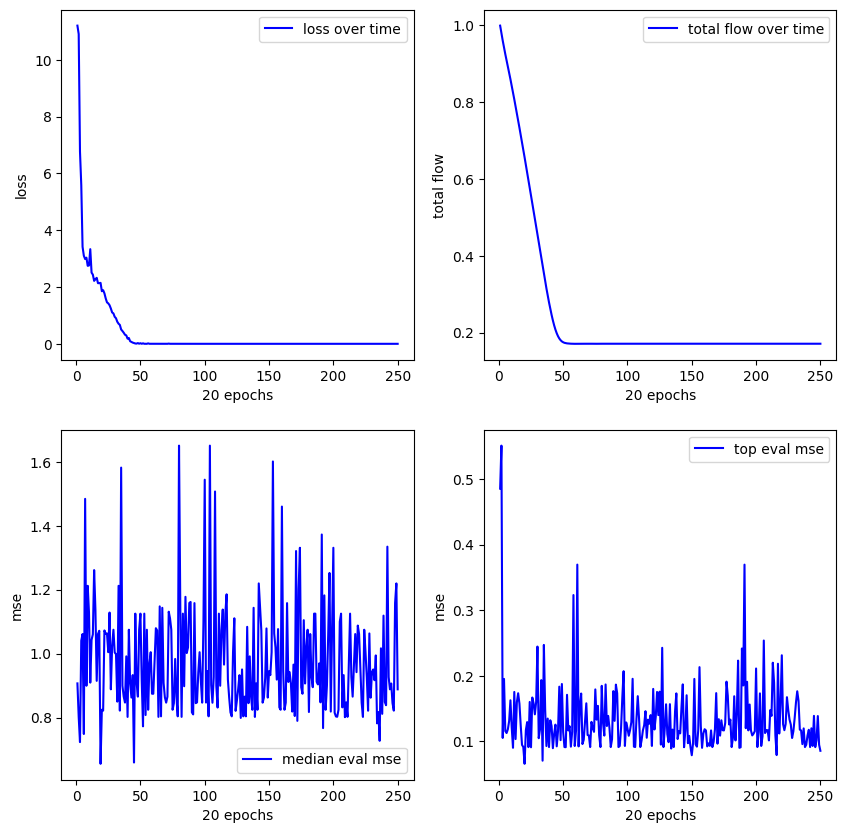

**************************************************
Experiment 2
training started with device cuda


15.922:   0%|          | 0/5000 [00:00<?, ?it/s]


new best reward (vanilla): 0.9875263571739197
mse (pre/post optimized): 0.008399533107876778/0.008399533107876778
(exp(x1)) * (x1)
expr: x1*exp(x1)


0.000: 100%|██████████| 5000/5000 [03:59<00:00, 20.92it/s]


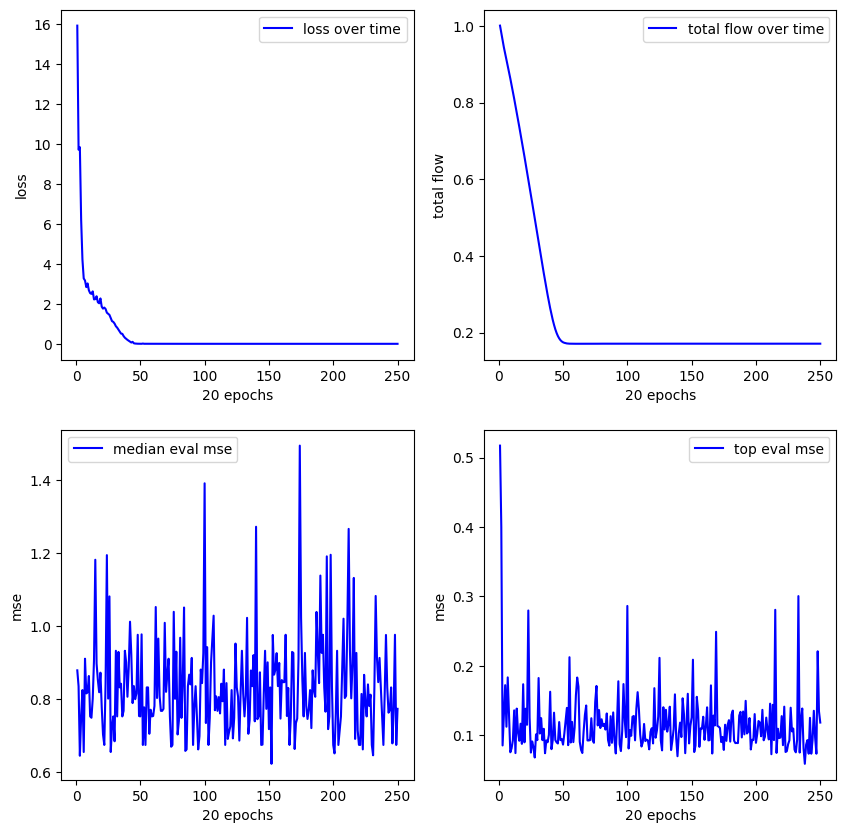

**************************************************
Experiment 3
training started with device cuda


15.334:   0%|          | 0/5000 [00:00<?, ?it/s]


new best reward (vanilla): 0.8237215876579285
mse (pre/post optimized): 0.13424739241600037/0.13424739241600037
(square(x1)) + (sqrt(x1))
expr: sqrt(x1) + square(x1)


15.334:   0%|          | 1/5000 [00:00<36:43,  2.27it/s]


new best reward (vanilla): 0.9891084432601929
mse (pre/post optimized): 0.0021454051602631807/0.0021454051602631807
(square(x1)) / (0.34)
expr: 2.94117647058824*square(x1)


0.000: 100%|██████████| 5000/5000 [05:19<00:00, 15.66it/s]


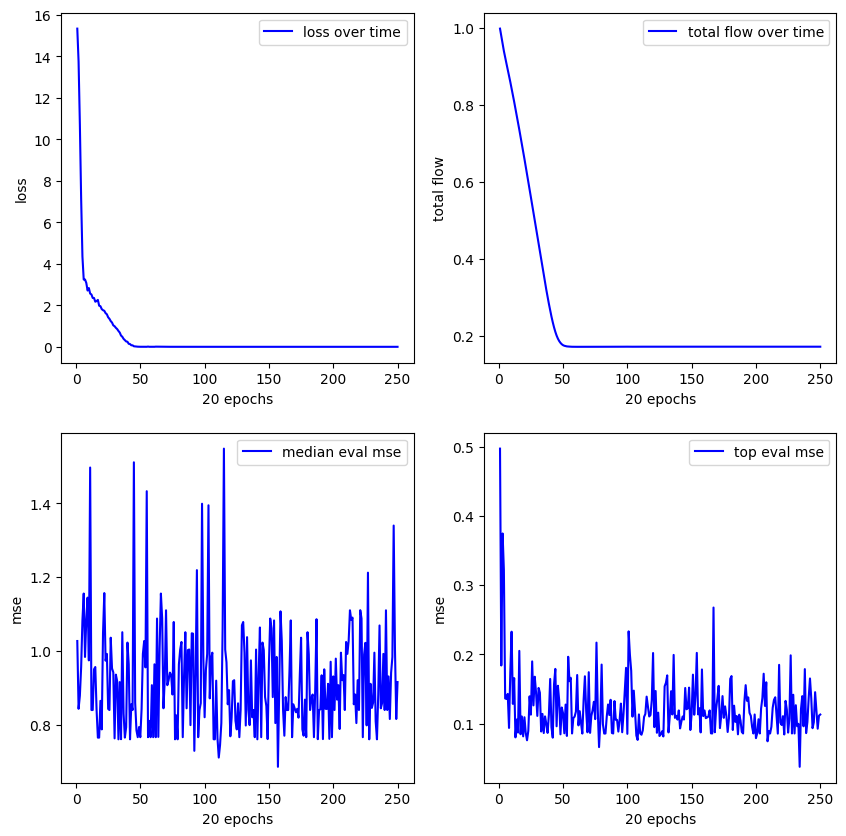

**************************************************
Experiment 4
training started with device cuda


14.834:   0%|          | 0/5000 [00:00<?, ?it/s]


new best reward (vanilla): 0.8563153743743896
mse (pre/post optimized): 0.11146920174360275/0.11146920174360275
(x1) * ((x1) + (x1))
expr: 2*x1**2


0.000: 100%|██████████| 5000/5000 [05:15<00:00, 15.85it/s]


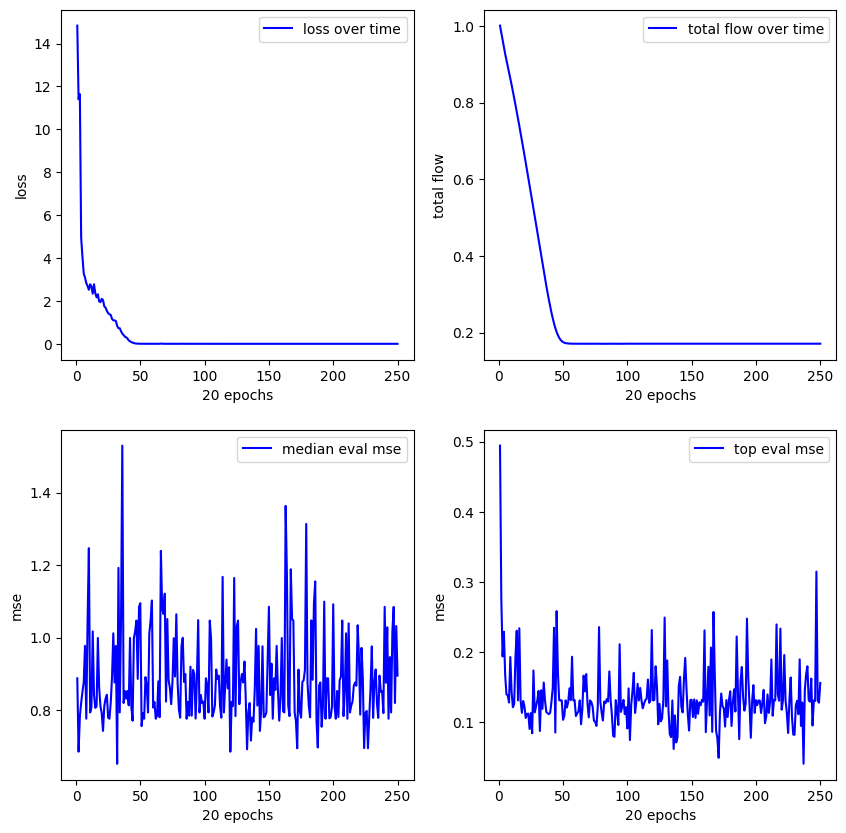

**************************************************
Experiment 5
training started with device cuda


17.396:   0%|          | 0/5000 [00:00<?, ?it/s]


new best reward (vanilla): 0.9975094795227051
mse (pre/post optimized): 0.001642368035390973/0.0016423673368990421
(sin(x1)) * ((x1) / (0.3))
expr: 3.33333333333333*x1*sin(x1)


0.000: 100%|██████████| 5000/5000 [04:29<00:00, 18.54it/s]


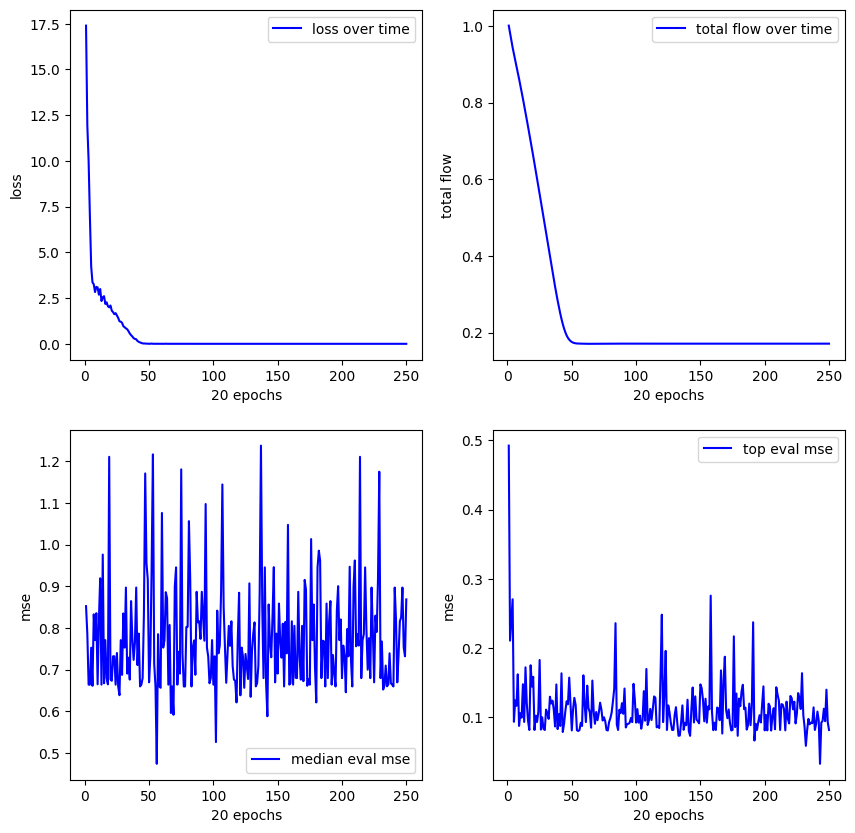

**************************************************
Experiment 6
training started with device cuda


14.365:   0%|          | 1/5000 [00:00<09:36,  8.66it/s]


new best reward (vanilla): 0.6993260383605957
mse (pre/post optimized): 0.194196879863739/0.14217336475849152
((0.66) * (x1)) + ((x1) + (0.24))
expr: 1.66*x1 + 0.24

new best reward (vanilla): 0.8557901382446289
mse (pre/post optimized): 0.0171432476490736/0.17728963494300842
(exp(x1)) + ((x1) - (0.8))
expr: x1 + exp(x1) - 0.8


0.000: 100%|██████████| 5000/5000 [03:32<00:00, 23.54it/s]


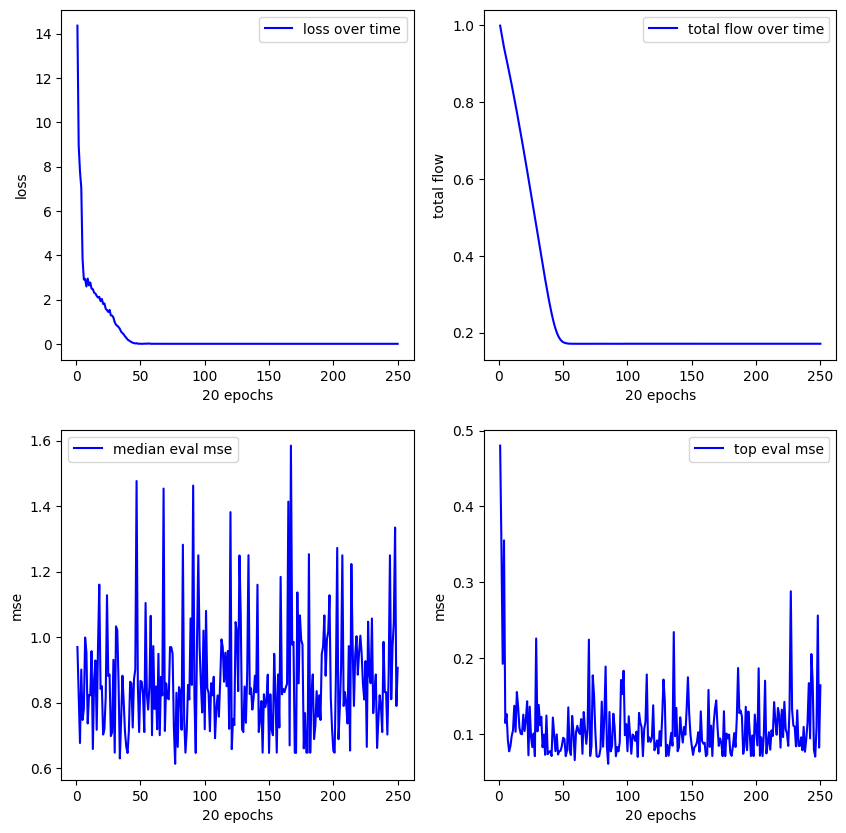

**************************************************
Experiment 7
training started with device cuda


15.319:   0%|          | 1/5000 [00:00<11:21,  7.33it/s]


new best reward (vanilla): 0.8986581563949585
mse (pre/post optimized): 0.06376533210277557/0.06376533210277557
square((0.51) + (x1))
expr: square(x1 + 0.51)


15.319:   0%|          | 6/5000 [00:00<10:19,  8.06it/s]


new best reward (vanilla): 0.9713801145553589
mse (pre/post optimized): 0.000971840345300734/0.0009721399983391166
(exp(x1)) / ((0.93) / (x1))
expr: 1.0752688172043*x1*exp(x1)


0.000: 100%|██████████| 5000/5000 [03:33<00:00, 23.45it/s]


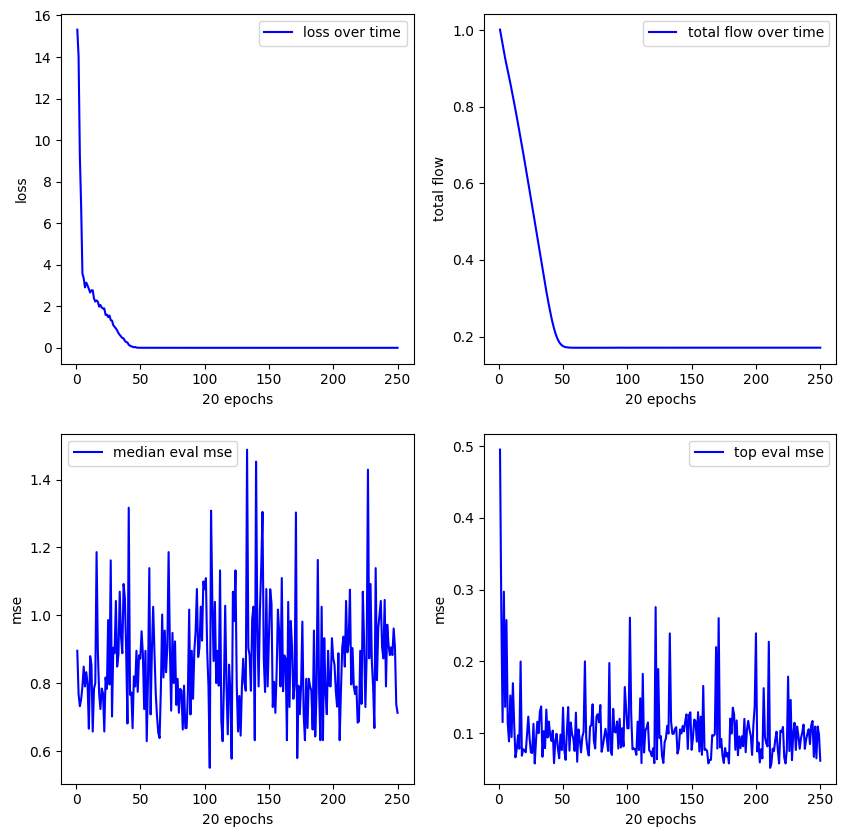

**************************************************
Experiment 8
training started with device cuda


15.777:   0%|          | 0/5000 [00:00<?, ?it/s]


new best reward (vanilla): 0.8363814949989319
mse (pre/post optimized): 0.11852764338254929/0.24139785766601562
(sin(x1)) * ((1.05) + (x1))
expr: (x1 + 1.05)*sin(x1)


15.777:   0%|          | 1/5000 [00:00<18:34,  4.49it/s]


new best reward (vanilla): 0.940415620803833
mse (pre/post optimized): 0.01067254040390253/0.01067254040390253
(x1) / ((0.32) / (x1))
expr: 3.125*x1**2


11.543:   1%|          | 31/5000 [00:02<04:46, 17.32it/s]


new best reward (vanilla): 0.9462127089500427
mse (pre/post optimized): 0.00011762087524402887/0.7455231547355652
((x1) / (0.56)) * (exp(x1))
expr: 1.78571428571429*x1*exp(x1)


0.000: 100%|██████████| 5000/5000 [03:39<00:00, 22.79it/s]


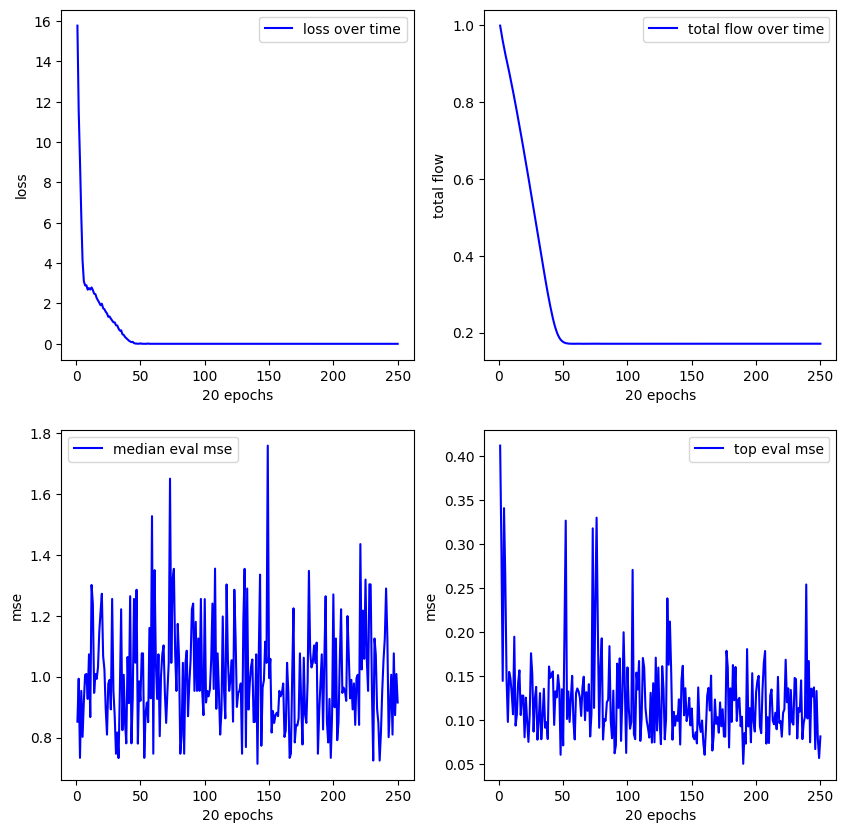

**************************************************
Experiment 9
training started with device cuda


14.977:   0%|          | 0/5000 [00:00<?, ?it/s]


new best reward (vanilla): 0.8722949624061584
mse (pre/post optimized): 0.10121128708124161/0.08878347277641296
((0.18) + (x1)) + (square(x1))
expr: x1 + square(x1) + 0.18


14.977:   0%|          | 1/5000 [00:00<19:39,  4.24it/s]


new best reward (vanilla): 0.9443764686584473
mse (pre/post optimized): 0.005604735109955072/0.005602135788649321
((x1) + (x1)) * ((0.36) + (x1))
expr: 2*x1*(x1 + 0.36)


0.000: 100%|██████████| 5000/5000 [03:42<00:00, 22.52it/s]


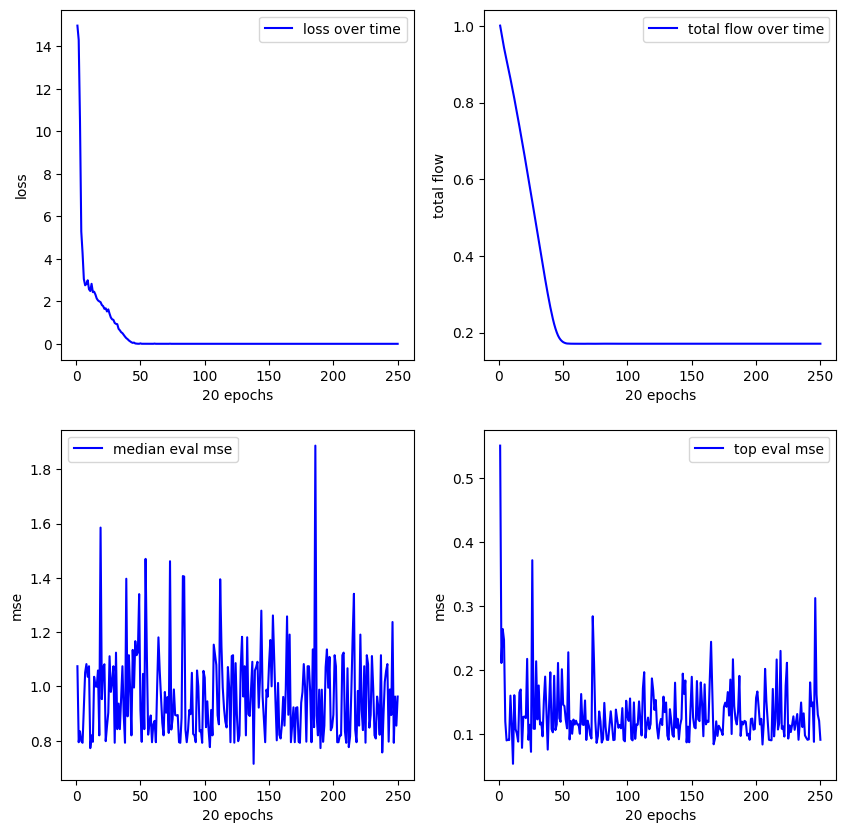

**************************************************
Experiment 10
training started with device cuda


17.335:   0%|          | 3/5000 [00:00<09:53,  8.41it/s]


new best reward (vanilla): 0.9981316924095154
mse (pre/post optimized): 0.0011906843865290284/0.001190684619359672
square((x1) / (0.59))
expr: square(1.69491525423729*x1)


0.000: 100%|██████████| 5000/5000 [03:14<00:00, 25.71it/s]


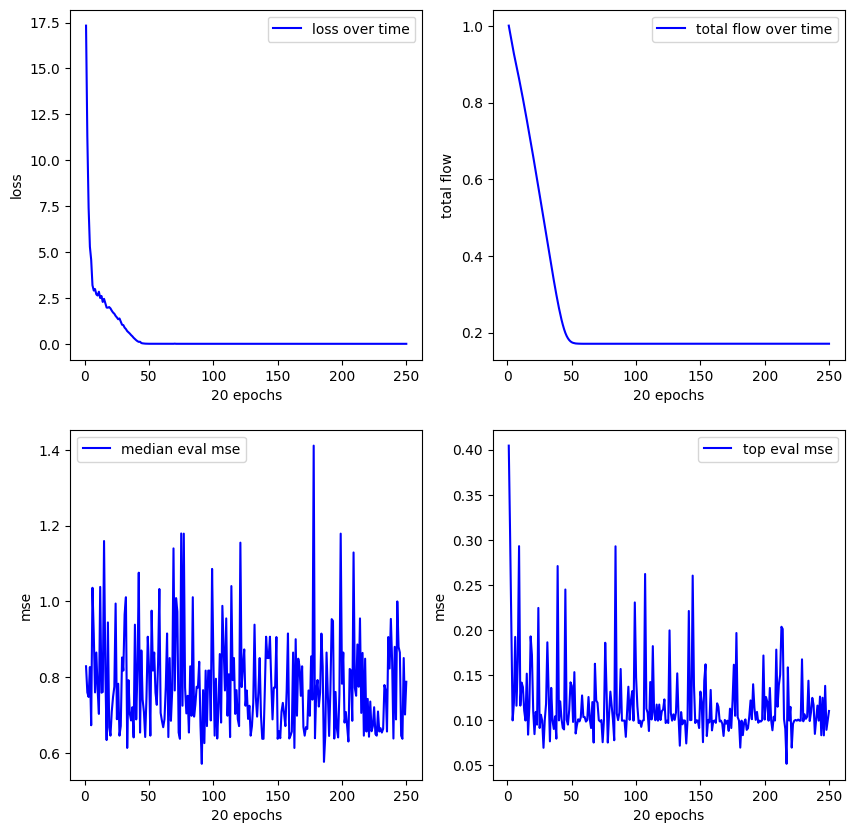

**************************************************
Experiment 11
training started with device cuda


17.388:   0%|          | 1/5000 [00:00<12:26,  6.70it/s]


new best reward (vanilla): 0.9642958641052246
mse (pre/post optimized): 0.02431359328329563/0.09585008025169373
(square(x1)) + ((1.23) * (x1))
expr: 1.23*x1 + square(x1)


0.000: 100%|██████████| 5000/5000 [03:09<00:00, 26.32it/s]


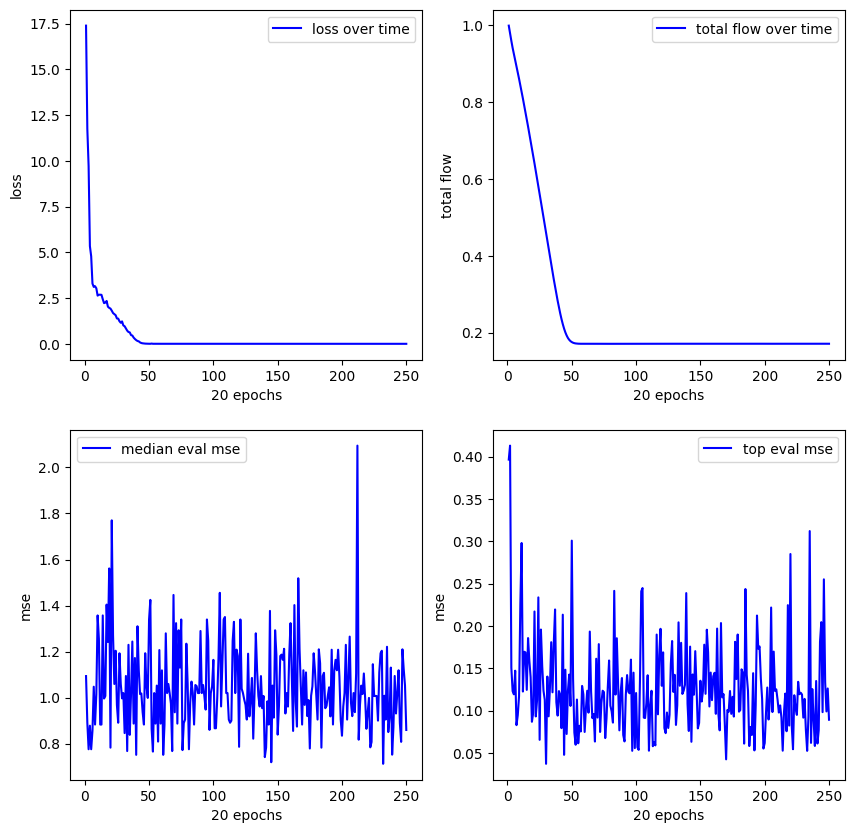

**************************************************
Experiment 12
training started with device cuda


11.853:   0%|          | 1/5000 [00:00<09:12,  9.04it/s]


new best reward (vanilla): 0.8757417798042297
mse (pre/post optimized): 0.0900801345705986/0.0900801345705986
(exp(x1)) * (sqrt(x1))
expr: sqrt(x1)*exp(x1)

new best reward (vanilla): 0.9795182347297668
mse (pre/post optimized): 0.001975033199414611/0.001975032966583967
(square(x1)) / (0.34)
expr: 2.94117647058824*square(x1)


0.000: 100%|██████████| 5000/5000 [03:13<00:00, 25.90it/s]


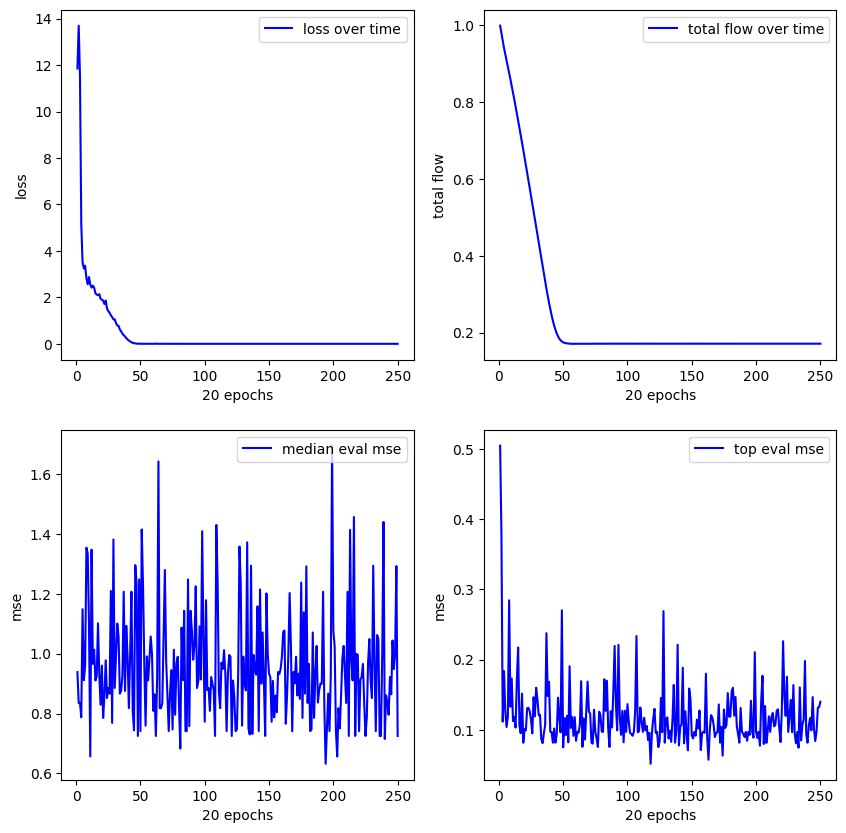

**************************************************
Experiment 13
training started with device cuda


12.009:   0%|          | 1/5000 [00:00<14:40,  5.68it/s]


new best reward (vanilla): 0.8737419843673706
mse (pre/post optimized): 0.10478556901216507/0.10478556901216507
(exp(x1)) - (cos(x1))
expr: exp(x1) - cos(x1)

new best reward (vanilla): 0.9598629474639893
mse (pre/post optimized): 0.007116310764104128/0.004449315369129181
((x1) + (x1)) / ((0.66) / (x1))
expr: 3.03030303030303*x1**2


0.000: 100%|██████████| 5000/5000 [03:13<00:00, 25.86it/s]


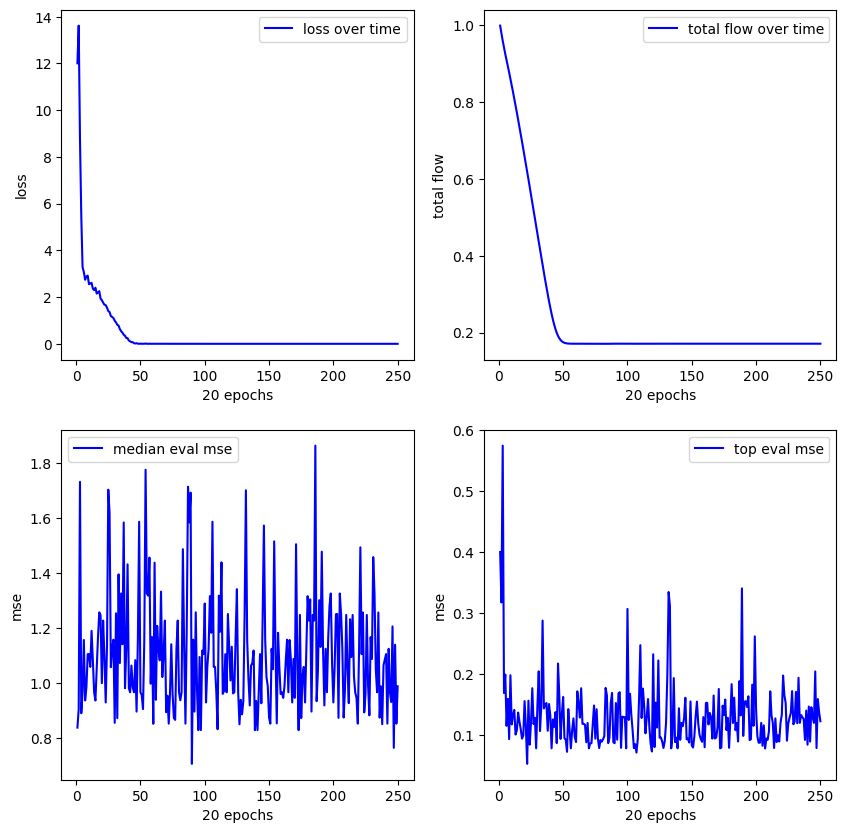

**************************************************
Experiment 14
training started with device cuda


19.763:   0%|          | 1/5000 [00:00<09:55,  8.39it/s]


new best reward (vanilla): 0.8858630657196045
mse (pre/post optimized): 0.07774700224399567/0.07774700224399567
(sin(x1)) + ((x1) + (x1))
expr: 2*x1 + sin(x1)


19.763:   0%|          | 11/5000 [00:00<07:19, 11.35it/s]


new best reward (vanilla): 0.975886344909668
mse (pre/post optimized): 0.0003035838599316776/0.00030358333606272936
(exp(x1)) * ((x1) + (0.16))
expr: (x1 + 0.16)*exp(x1)


0.000: 100%|██████████| 5000/5000 [03:14<00:00, 25.76it/s]


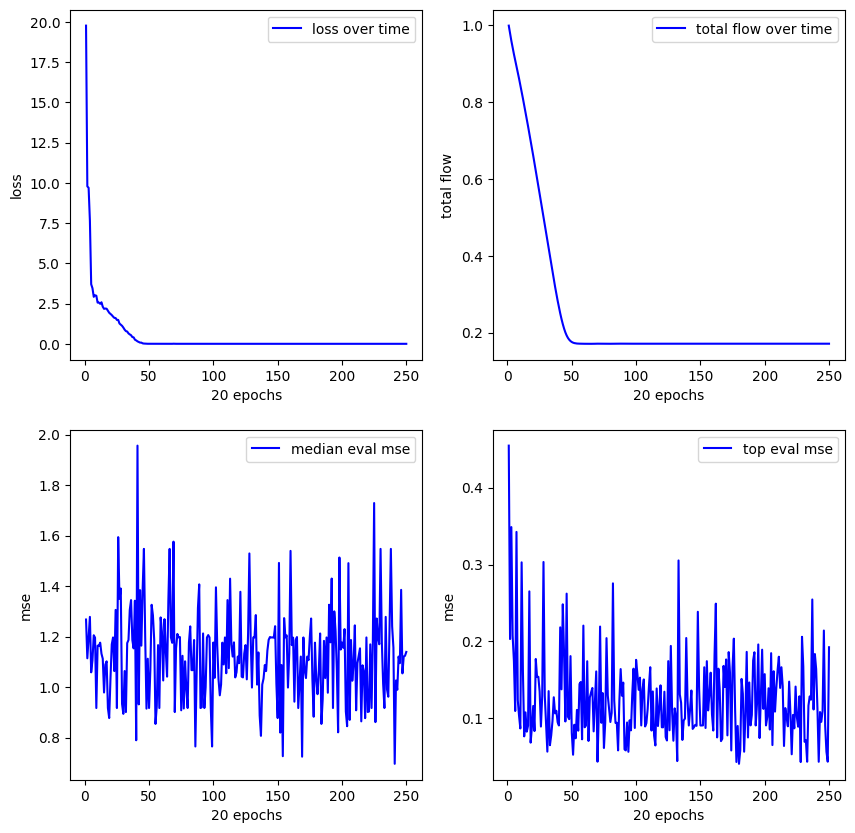

**************************************************
Experiment 15
training started with device cuda


16.347:   0%|          | 3/5000 [00:00<03:11, 26.04it/s]


new best reward (vanilla): 0.9119172692298889
mse (pre/post optimized): 0.06285758316516876/0.06285758316516876
(sqrt(x1)) * (exp(x1))
expr: sqrt(x1)*exp(x1)


0.000: 100%|██████████| 5000/5000 [03:09<00:00, 26.39it/s]


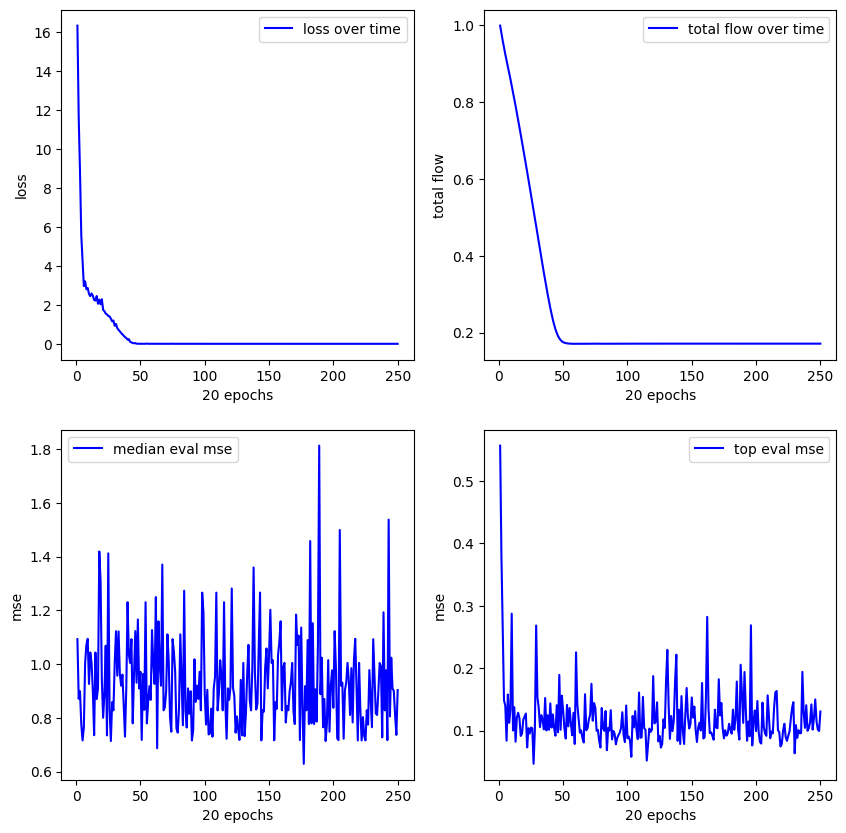

**************************************************
Experiment 16
training started with device cuda


12.333:   0%|          | 1/5000 [00:00<11:08,  7.48it/s]


new best reward (vanilla): 0.8631880283355713
mse (pre/post optimized): 0.10698845237493515/191.9589385986328
square((x1) / (0.17))
expr: square(5.88235294117647*x1)


0.000: 100%|██████████| 5000/5000 [03:10<00:00, 26.22it/s]


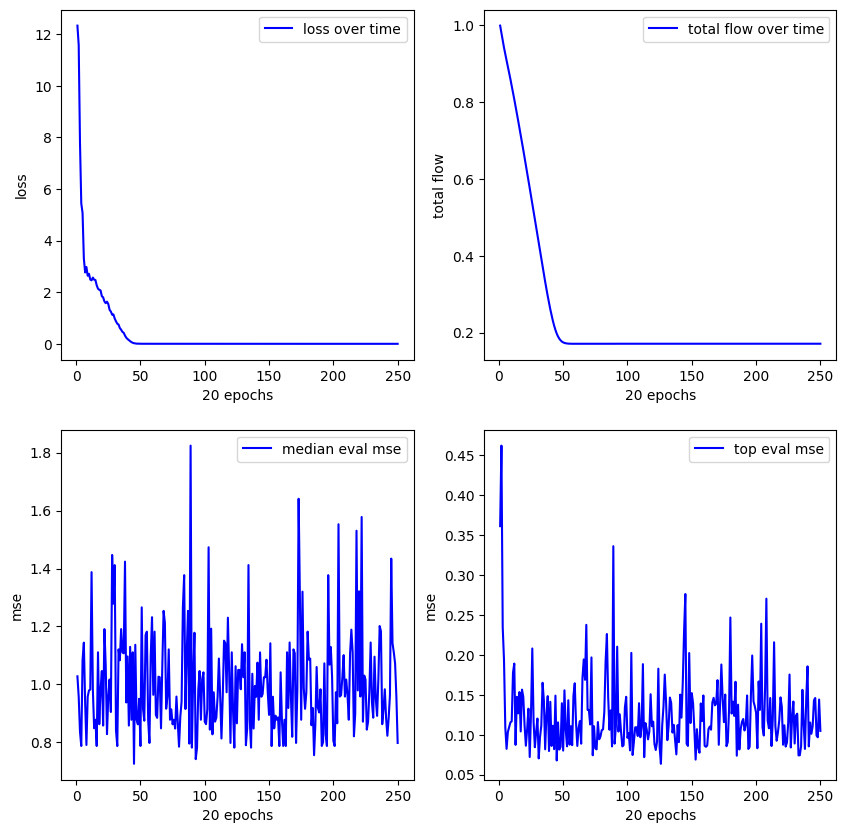

**************************************************
Experiment 17
training started with device cuda


20.886:   0%|          | 1/5000 [00:00<12:31,  6.66it/s]


new best reward (vanilla): 0.7169051170349121
mse (pre/post optimized): 0.23716218769550323/2.863778591156006
(x1) / (0.19)
expr: 5.26315789473684*x1

new best reward (vanilla): 0.8738414645195007
mse (pre/post optimized): 0.03749693185091019/0.03749693185091019
(sqrt(x1)) * (exp(x1))
expr: sqrt(x1)*exp(x1)


20.886:   0%|          | 7/5000 [00:00<08:17, 10.03it/s]


new best reward (vanilla): 0.9464976787567139
mse (pre/post optimized): 0.0011988836340606213/0.13168418407440186
(exp(x1)) * ((0.87) * (x1))
expr: 0.87*x1*exp(x1)


0.000: 100%|██████████| 5000/5000 [03:15<00:00, 25.62it/s]


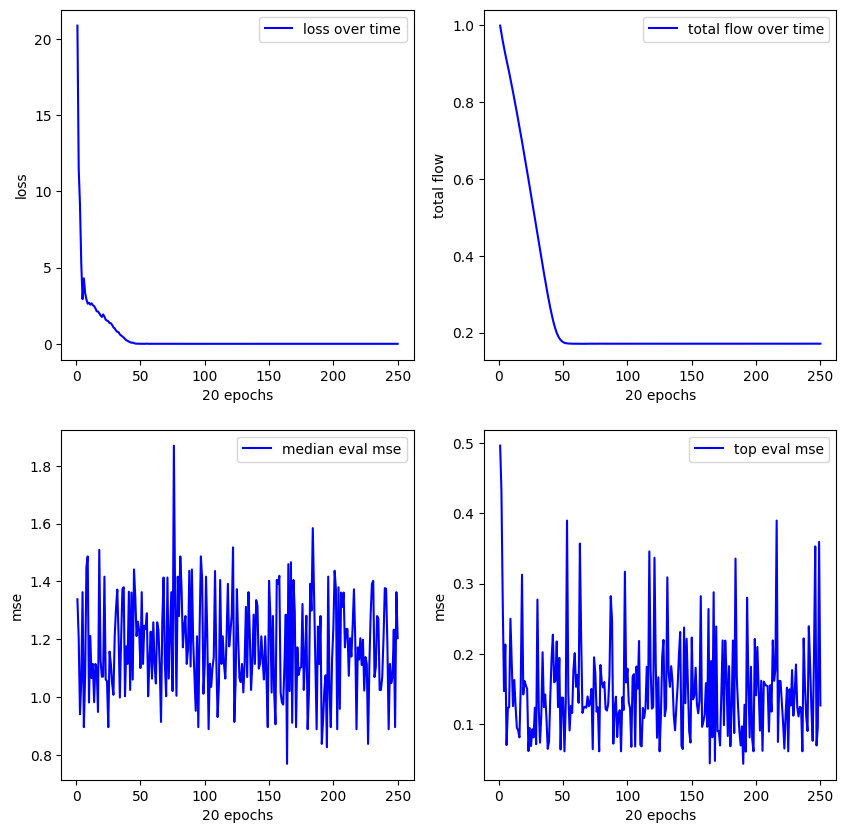

**************************************************
Experiment 18
training started with device cuda


22.767:   0%|          | 1/5000 [00:00<09:46,  8.52it/s]


new best reward (vanilla): 0.9125539660453796
mse (pre/post optimized): 0.06402868032455444/0.06402868032455444
square((0.57) + (x1))
expr: square(x1 + 0.57)


10.986:   0%|          | 22/5000 [00:01<07:14, 11.45it/s]


new best reward (vanilla): 0.9182880520820618
mse (pre/post optimized): 0.0019036774756386876/0.0015416626119986176
((0.1) + (x1)) * (exp(x1))
expr: (x1 + 0.1)*exp(x1)


0.000: 100%|██████████| 5000/5000 [03:14<00:00, 25.76it/s]


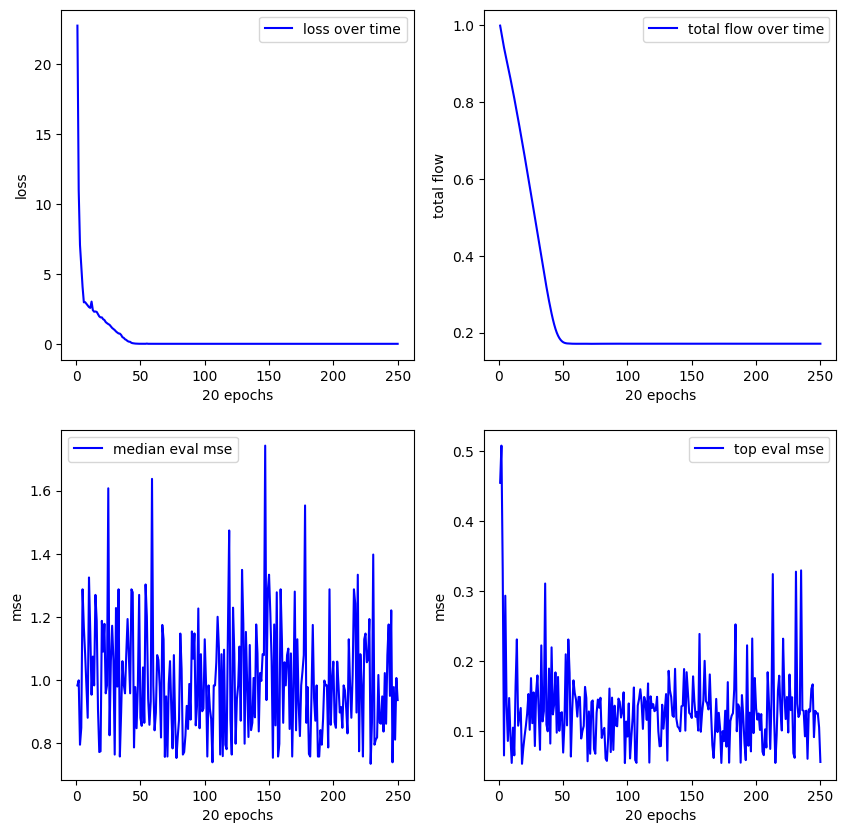

**************************************************
Experiment 19
training started with device cuda


11.403:   0%|          | 1/5000 [00:00<11:29,  7.24it/s]


new best reward (vanilla): 0.8378626704216003
mse (pre/post optimized): 0.12550082802772522/0.12550082802772522
(x1) + (square(x1))
expr: x1 + square(x1)


11.403:   0%|          | 4/5000 [00:00<07:13, 11.53it/s]


new best reward (vanilla): 0.9554295539855957
mse (pre/post optimized): 0.008484193123877048/0.008484193123877048
(x1) * (exp(x1))
expr: x1*exp(x1)


0.000: 100%|██████████| 5000/5000 [03:14<00:00, 25.76it/s]


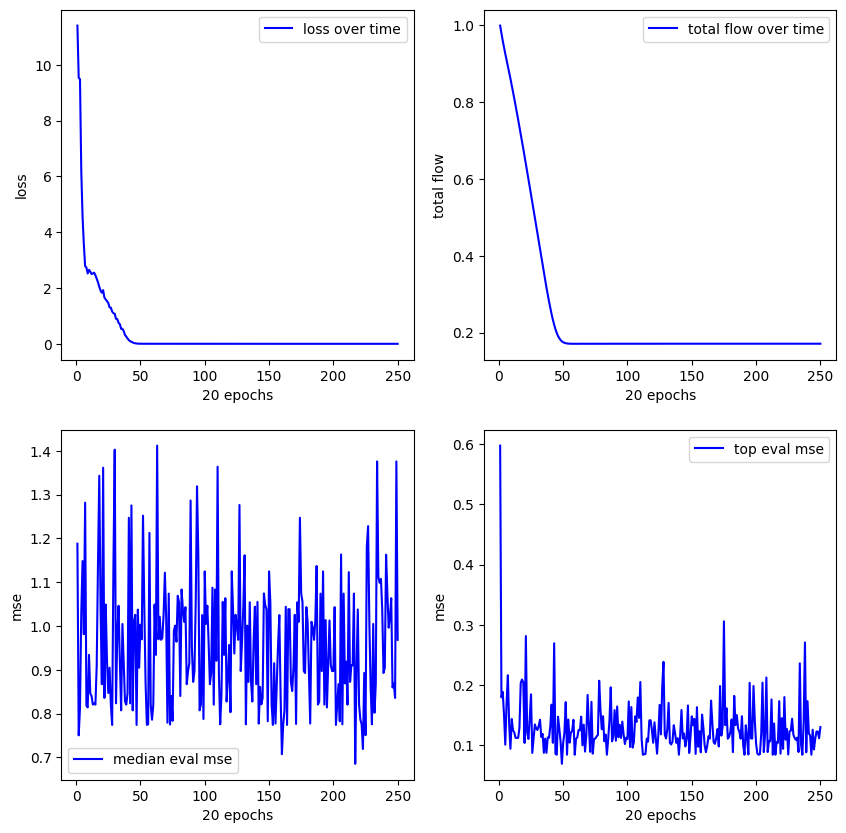

**************************************************
Experiment 20
training started with device cuda


16.356:   0%|          | 1/5000 [00:00<11:07,  7.49it/s]


new best reward (vanilla): 0.9896795749664307
mse (pre/post optimized): 0.007754640653729439/0.007754640653729439
(exp(x1)) * (x1)
expr: x1*exp(x1)


0.000: 100%|██████████| 5000/5000 [03:16<00:00, 25.39it/s]


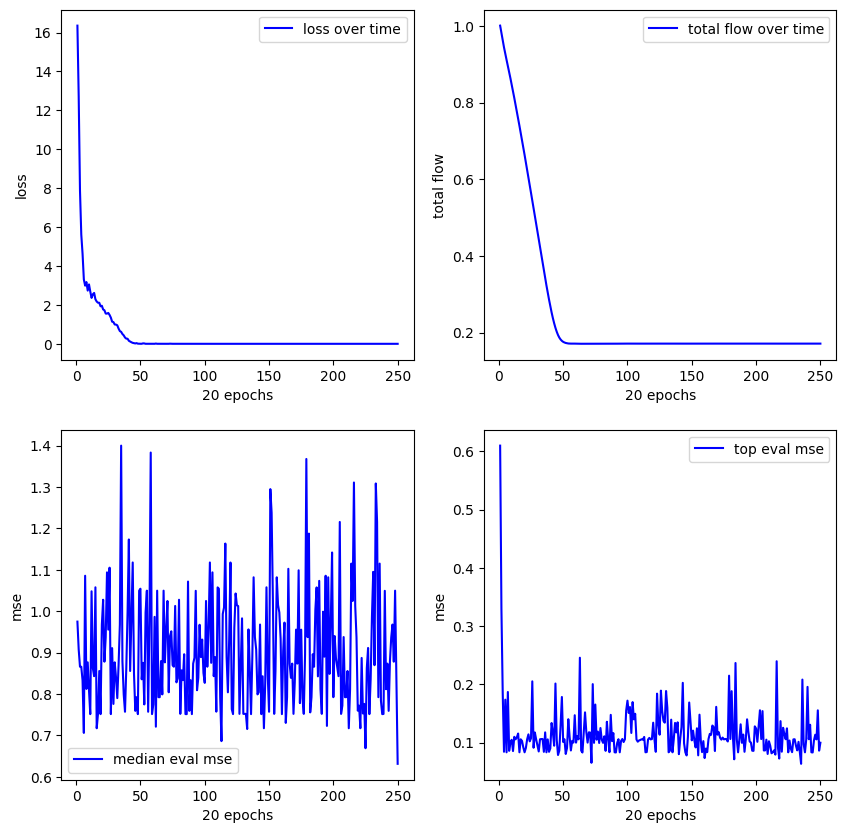

--------------------------------------------------
FUNCTION sin(x)(sqrt(x) + exp(x)) Interval considered: [0, 1]
**************************************************
Experiment 1
training started with device cuda


18.275:   0%|          | 0/5000 [00:00<?, ?it/s]


new best reward (vanilla): 0.7939922213554382
mse (pre/post optimized): 0.19513152539730072/0.7177852392196655
((x1) - (0.31)) * (exp(x1))
expr: (x1 - 0.31)*exp(x1)

new best reward (vanilla): 0.896139919757843
mse (pre/post optimized): 0.028077412396669388/0.02480289712548256
(exp(x1)) - ((0.95) - (x1))
expr: x1 + exp(x1) - 0.95


18.275:   0%|          | 12/5000 [00:01<06:59, 11.89it/s]


new best reward (vanilla): 0.9505311250686646
mse (pre/post optimized): 0.0006962628685869277/0.09881775081157684
(sqrt(x1)) / ((0.27) / (x1))
expr: 3.7037037037037*x1**(3/2)


0.000: 100%|██████████| 5000/5000 [03:15<00:00, 25.57it/s]


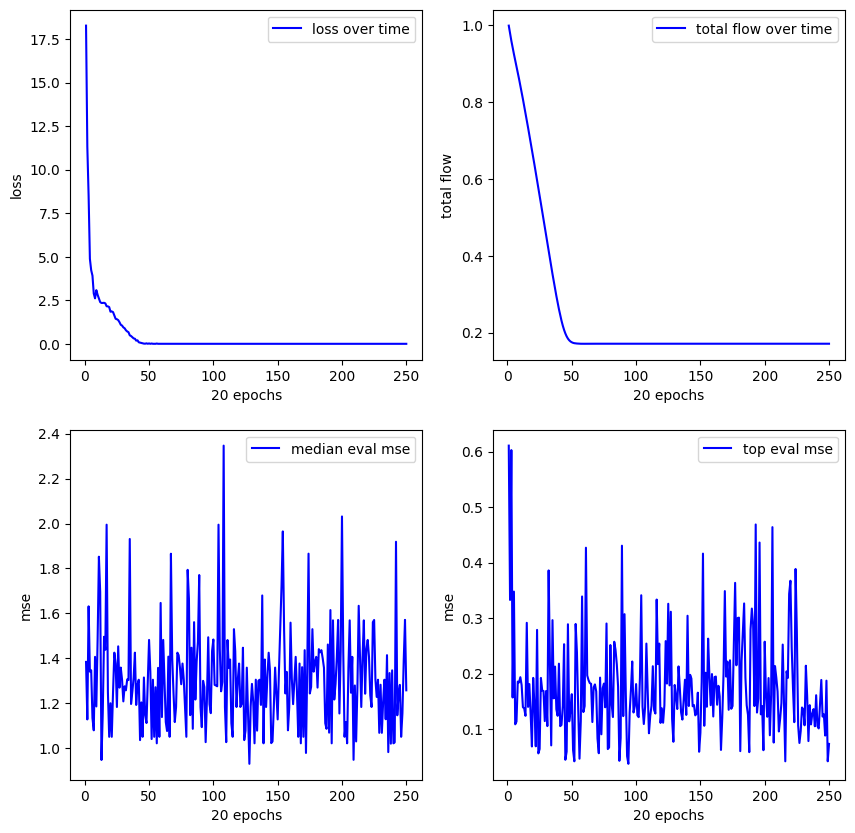

**************************************************
Experiment 2
training started with device cuda


20.815:   0%|          | 0/5000 [00:00<?, ?it/s]


new best reward (vanilla): 0.7735756635665894
mse (pre/post optimized): 0.17735527455806732/0.1188928484916687
((x1) - (0.24)) + ((x1) + (0.45))
expr: 2*x1 + 0.21

new best reward (vanilla): 0.9526817202568054
mse (pre/post optimized): 0.011259317398071289/0.2920236587524414
((x1) - (0.38)) * ((x1) / (0.15))


20.815:   0%|          | 3/5000 [00:00<11:12,  7.43it/s]

expr: 6.66666666666667*x1*(x1 - 0.38)


0.000: 100%|██████████| 5000/5000 [03:12<00:00, 26.03it/s]


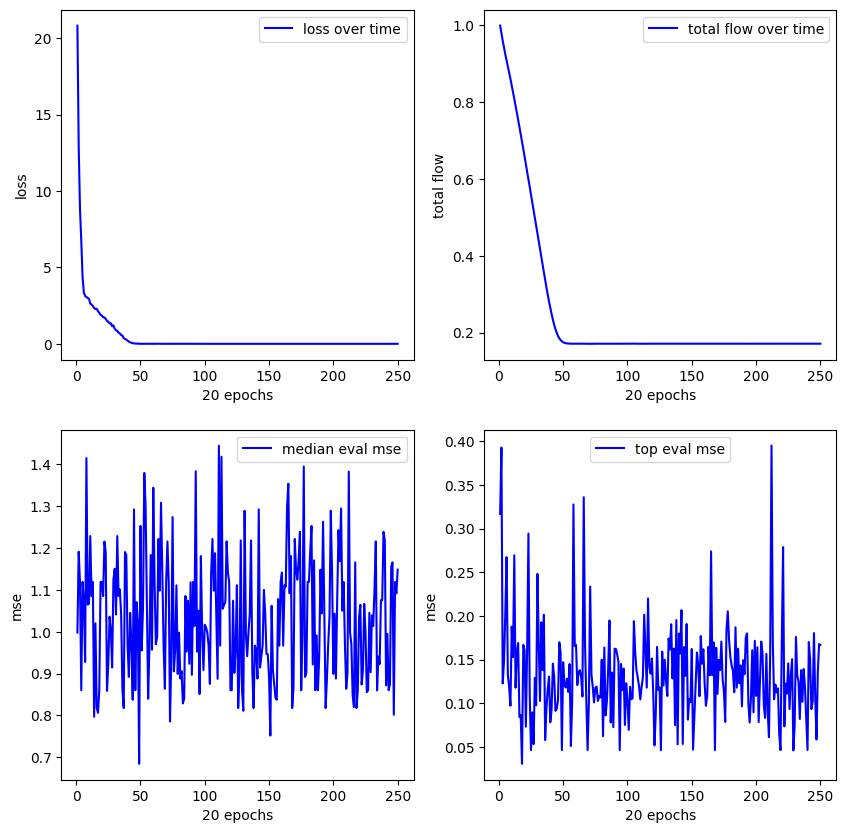

**************************************************
Experiment 3
training started with device cuda


24.737:   0%|          | 1/5000 [00:00<28:43,  2.90it/s]


new best reward (vanilla): 0.9669221043586731
mse (pre/post optimized): 0.02954845502972603/0.2633129358291626
((1.31) + (x1)) * ((0.98) * (x1))
expr: 0.98*x1*(x1 + 1.31)


0.000: 100%|██████████| 5000/5000 [03:17<00:00, 25.35it/s]


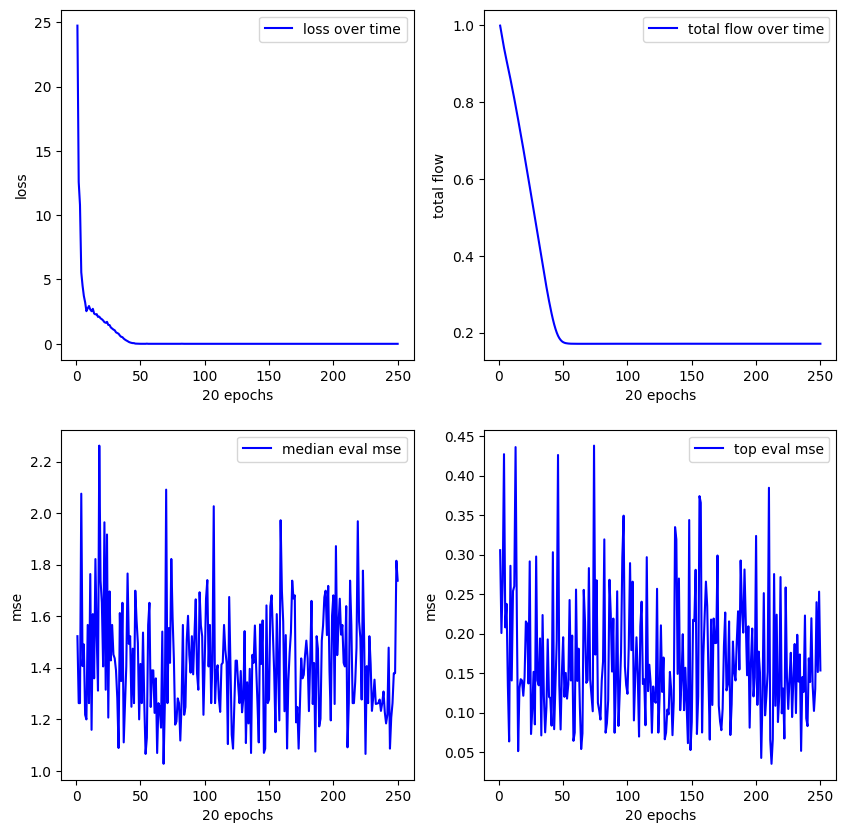

**************************************************
Experiment 4
training started with device cuda


17.328:   0%|          | 1/5000 [00:00<10:14,  8.13it/s]


new best reward (vanilla): 0.9120429158210754
mse (pre/post optimized): 0.06922510266304016/0.06922510266304016
square((0.63) + (x1))
expr: square(x1 + 0.63)


0.000: 100%|██████████| 5000/5000 [03:12<00:00, 25.94it/s]


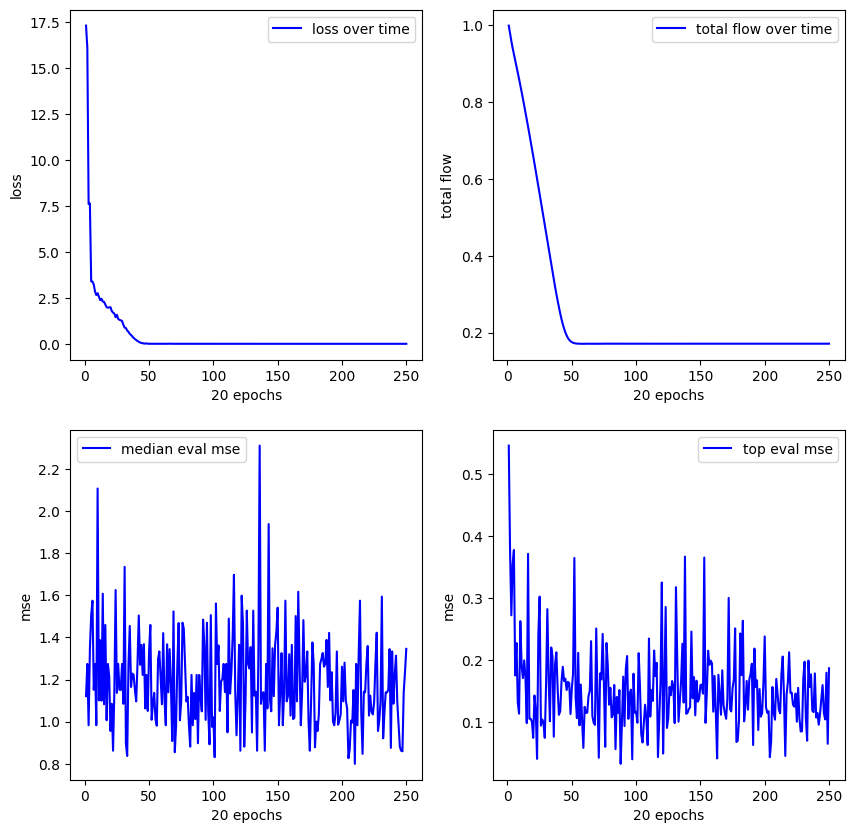

**************************************************
Experiment 5
training started with device cuda


18.289:   0%|          | 1/5000 [00:00<14:14,  5.85it/s]


new best reward (vanilla): 0.8698148131370544
mse (pre/post optimized): 0.10561393946409225/0.16048826277256012
(sqrt(x1)) + ((x1) * (1.13))
expr: sqrt(x1) + 1.13*x1


18.289:   0%|          | 6/5000 [00:00<04:59, 16.70it/s]


new best reward (vanilla): 0.9210817217826843
mse (pre/post optimized): 0.00406856881454587/0.0032709345687180758
((x1) + (x1)) * ((0.67) + (x1))
expr: 2*x1*(x1 + 0.67)


0.000: 100%|██████████| 5000/5000 [03:12<00:00, 26.00it/s]


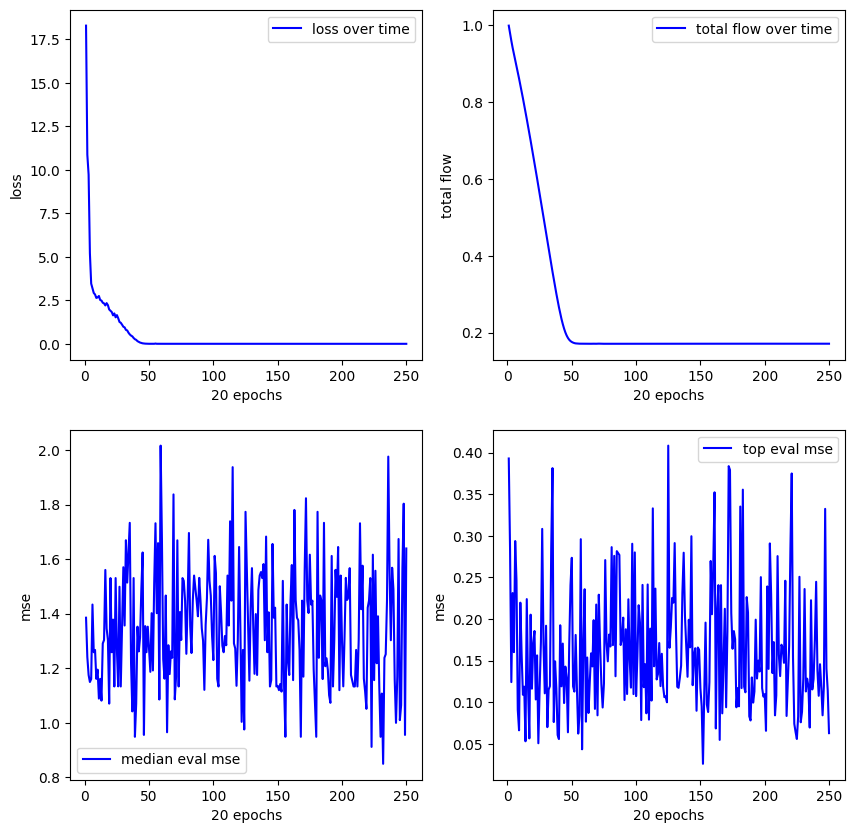

**************************************************
Experiment 6
training started with device cuda


15.107:   0%|          | 1/5000 [00:00<14:59,  5.56it/s]


new best reward (vanilla): 0.9517092108726501
mse (pre/post optimized): 0.03676997497677803/0.08258529752492905
(square(x1)) + ((1.21) * (x1))
expr: 1.21*x1 + square(x1)


0.000: 100%|██████████| 5000/5000 [03:14<00:00, 25.76it/s]


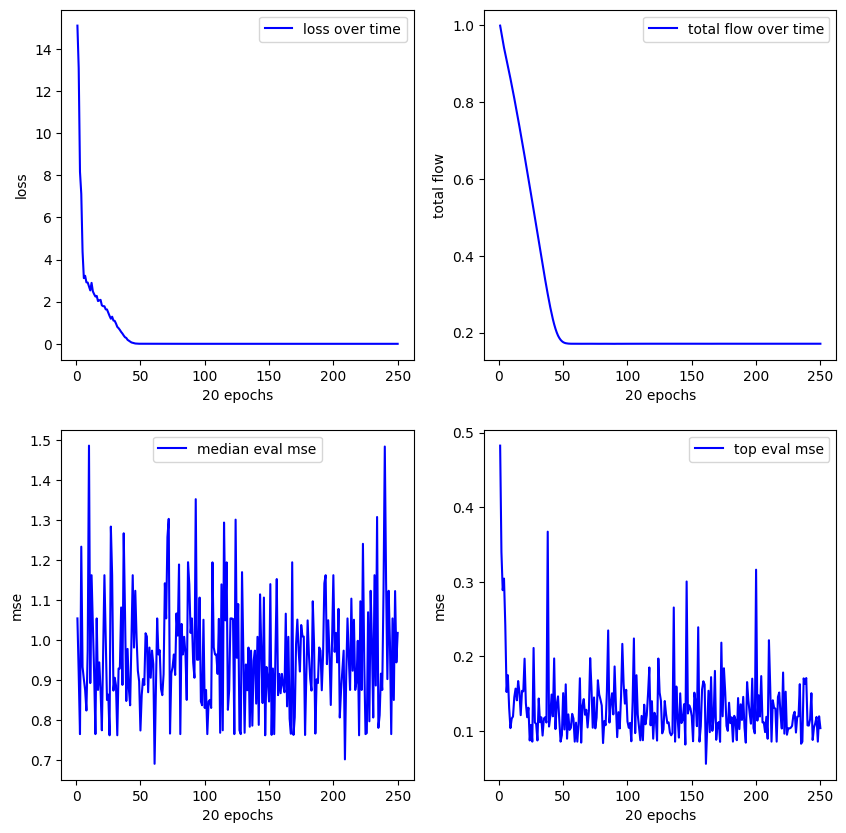

**************************************************
Experiment 7
training started with device cuda


18.655:   0%|          | 2/5000 [00:00<04:59, 16.69it/s]


new best reward (vanilla): 0.9549021124839783
mse (pre/post optimized): 0.03811434656381607/0.038088180124759674
((0.33) * (x1)) + ((x1) / (0.42))
expr: 2.71095238095238*x1


0.000: 100%|██████████| 5000/5000 [03:15<00:00, 25.60it/s]


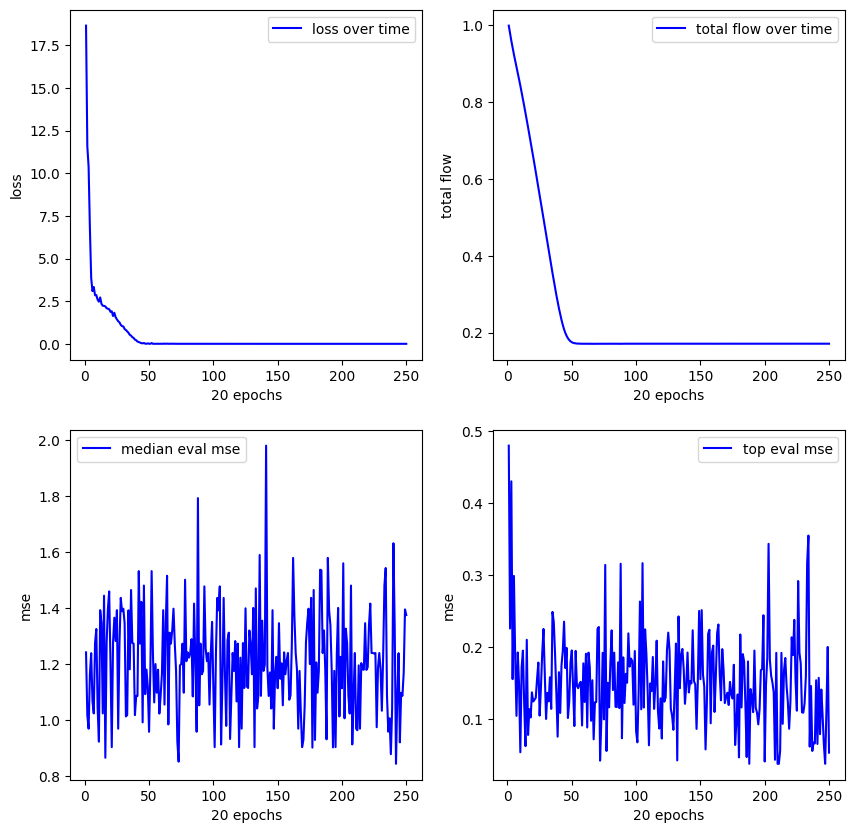

**************************************************
Experiment 8
training started with device cuda


18.527:   0%|          | 2/5000 [00:00<06:07, 13.61it/s]


new best reward (vanilla): 0.936011791229248
mse (pre/post optimized): 0.05029696971178055/0.05029696971178055
(sqrt(x1)) * (exp(x1))
expr: sqrt(x1)*exp(x1)

new best reward (vanilla): 0.957389771938324
mse (pre/post optimized): 0.005278162192553282/0.005278162192553282
((x1) + (x1)) + (square(x1))
expr: 2*x1 + square(x1)


0.000: 100%|██████████| 5000/5000 [03:15<00:00, 25.58it/s]


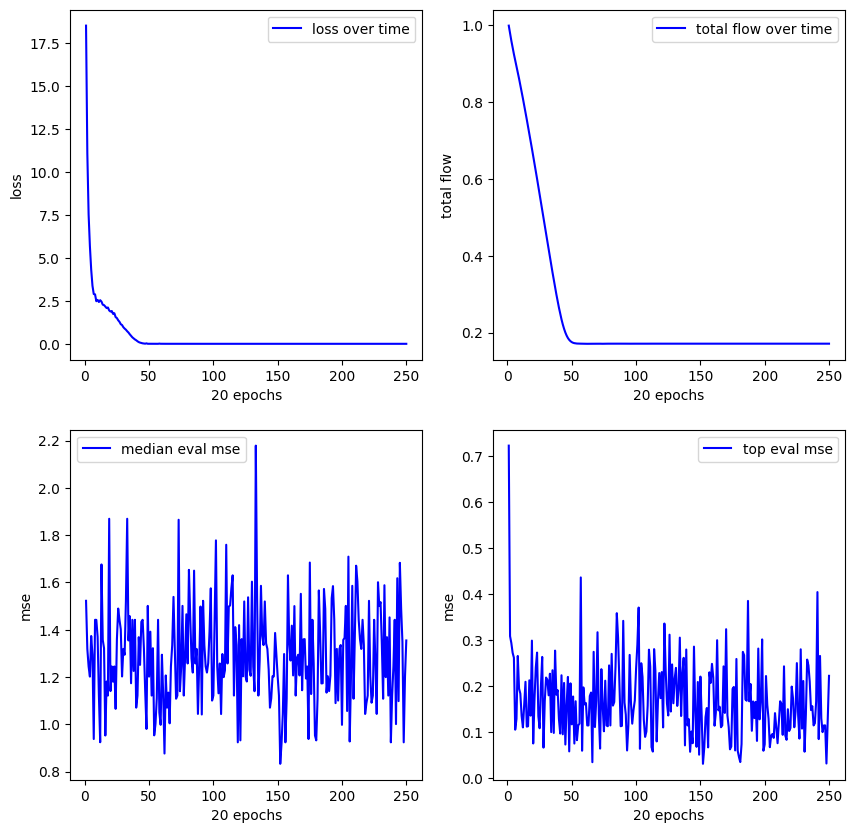

**************************************************
Experiment 9
training started with device cuda


20.699:   0%|          | 2/5000 [00:00<04:57, 16.82it/s]


new best reward (vanilla): 0.7542204856872559
mse (pre/post optimized): 0.21854589879512787/0.17536570131778717
((x1) + (0.34)) + (sin(x1))
expr: x1 + sin(x1) + 0.34

new best reward (vanilla): 0.9743135571479797
mse (pre/post optimized): 0.007336324080824852/0.007336324080824852
((x1) * (x1)) + ((x1) + (x1))
expr: x1*(x1 + 2)


0.000: 100%|██████████| 5000/5000 [03:12<00:00, 26.01it/s]


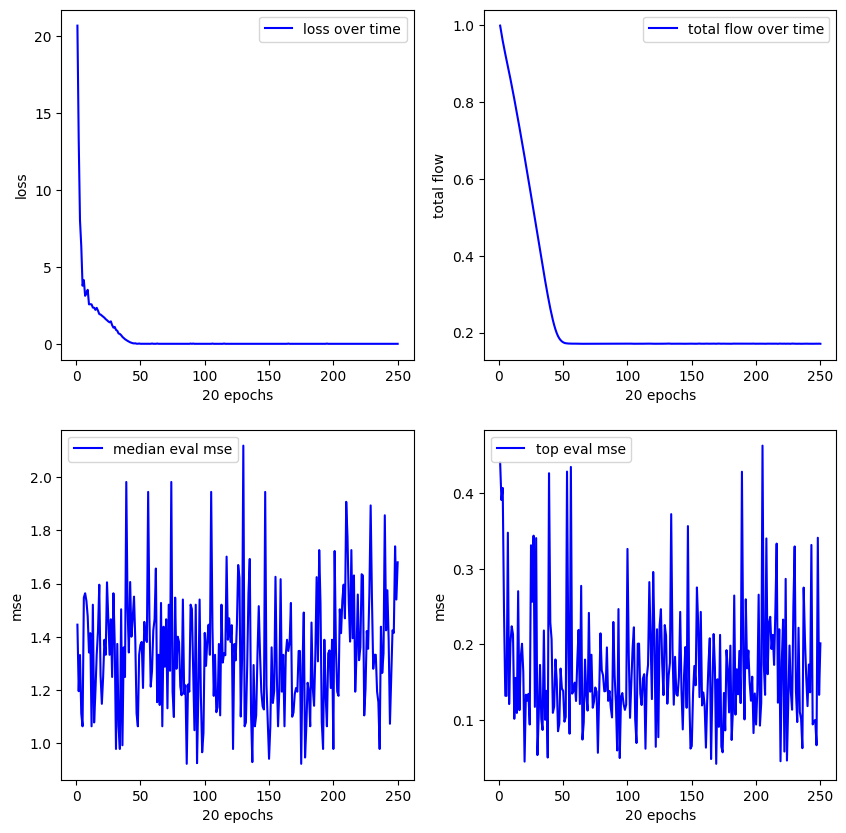

**************************************************
Experiment 10
training started with device cuda


17.453:   0%|          | 1/5000 [00:00<08:35,  9.69it/s]


new best reward (vanilla): 0.5828166007995605
mse (pre/post optimized): 0.35512790083885193/0.35512790083885193
exp(sin(x1))
expr: exp(sin(x1))

new best reward (vanilla): 0.7614285349845886
mse (pre/post optimized): 0.0631043016910553/0.0631043016910553
square((x1) + (0.66))
expr: square(x1 + 0.66)

new best reward (vanilla): 0.9455856084823608
mse (pre/post optimized): 0.004529711790382862/0.005608646664768457
(exp(x1)) * ((0.25) + (x1))


17.453:   0%|          | 3/5000 [00:00<06:54, 12.05it/s]

expr: (x1 + 0.25)*exp(x1)


0.000: 100%|██████████| 5000/5000 [03:17<00:00, 25.28it/s]


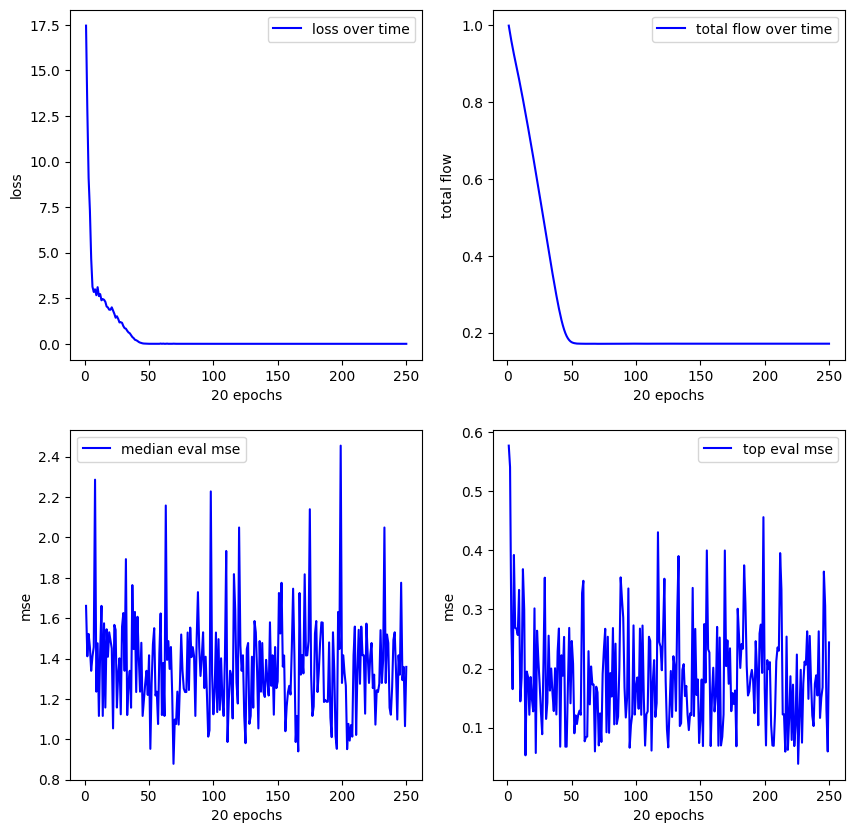

**************************************************
Experiment 11
training started with device cuda


23.816:   0%|          | 1/5000 [00:00<16:09,  5.16it/s]


new best reward (vanilla): 0.9691994786262512
mse (pre/post optimized): 0.026343360543251038/0.023228483274579048
(0.78) / ((0.27) / (x1))
expr: 2.88888888888889*x1


0.000: 100%|██████████| 5000/5000 [03:13<00:00, 25.85it/s]


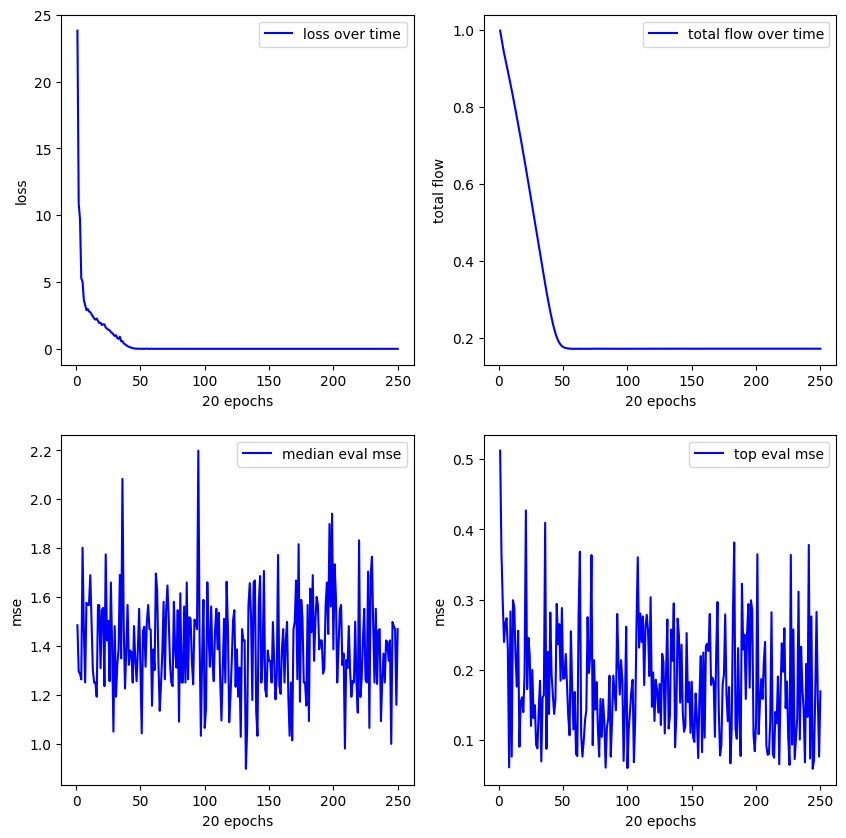

**************************************************
Experiment 12
training started with device cuda


18.528:   0%|          | 1/5000 [00:00<14:02,  5.94it/s]


new best reward (vanilla): 0.9763932824134827
mse (pre/post optimized): 0.01844647340476513/0.013110112398862839
(square(x1)) + ((x1) / (0.54))
expr: 1.85185185185185*x1 + square(x1)


0.000: 100%|██████████| 5000/5000 [03:16<00:00, 25.51it/s]


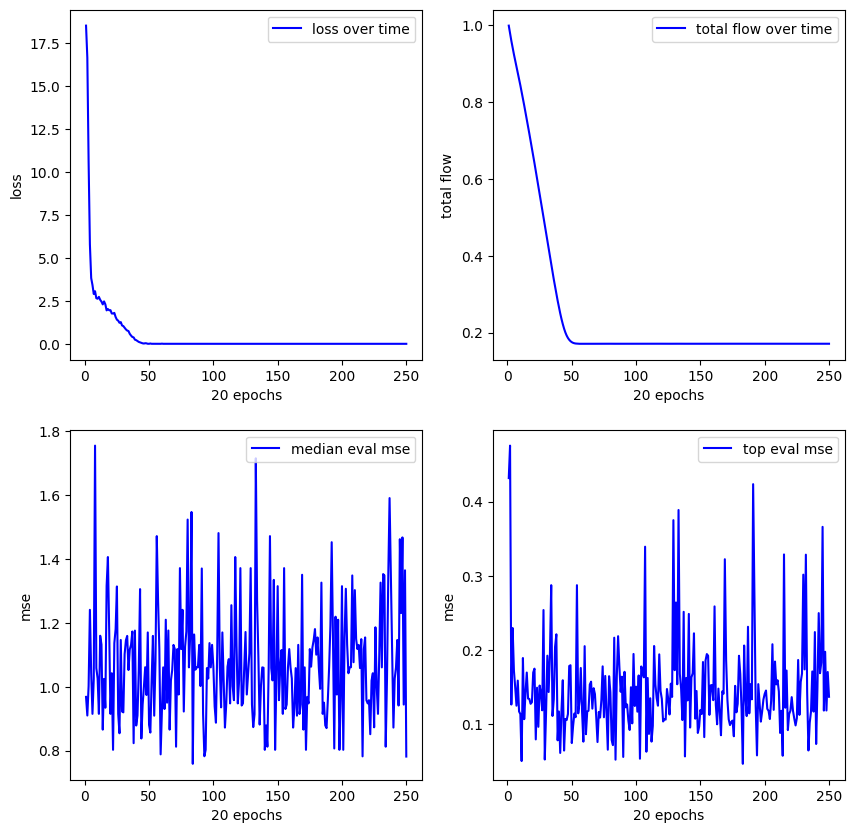

**************************************************
Experiment 13
training started with device cuda


17.167:   0%|          | 1/5000 [00:00<10:41,  7.80it/s]


new best reward (vanilla): 0.7527901530265808
mse (pre/post optimized): 0.2266966998577118/0.05586767569184303
((x1) / (0.27)) - (x1)
expr: 2.7037037037037*x1


17.167:   0%|          | 2/5000 [00:00<10:53,  7.65it/s]


new best reward (vanilla): 0.836432695388794
mse (pre/post optimized): 0.04837162047624588/0.46002623438835144
((1.0) * (x1)) / (cos(x1))
expr: 1.0*x1/cos(x1)


0.000: 100%|██████████| 5000/5000 [03:15<00:00, 25.62it/s]


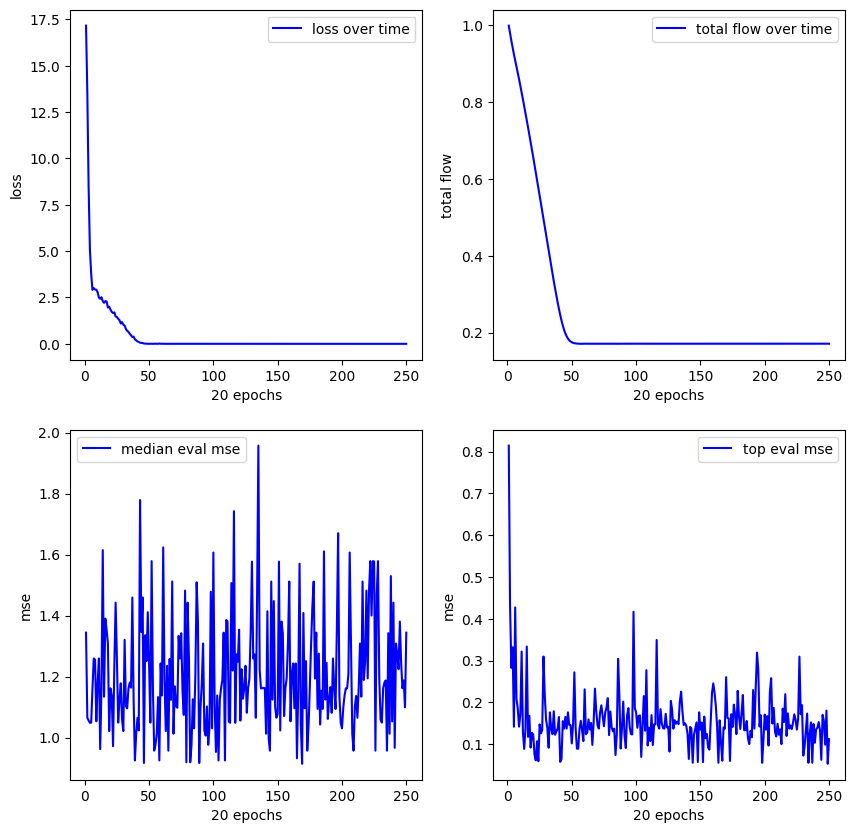

**************************************************
Experiment 14
training started with device cuda


18.734:   0%|          | 1/5000 [00:00<13:27,  6.19it/s]


new best reward (vanilla): 0.9093132019042969
mse (pre/post optimized): 0.07746710628271103/0.07717746496200562
square((x1) + (0.64))
expr: square(x1 + 0.64)

new best reward (vanilla): 0.9429481625556946
mse (pre/post optimized): 0.008851202204823494/0.008851202204823494
(exp(x1)) / ((0.8) / (x1))
expr: 1.25*x1*exp(x1)


18.734:   0%|          | 15/5000 [00:01<05:19, 15.63it/s]


new best reward (vanilla): 0.9520514607429504
mse (pre/post optimized): 0.0011258512968197465/0.0011232986580580473
(sqrt(x1)) / ((0.32) / (x1))
expr: 3.125*x1**(3/2)


0.000: 100%|██████████| 5000/5000 [03:14<00:00, 25.72it/s]


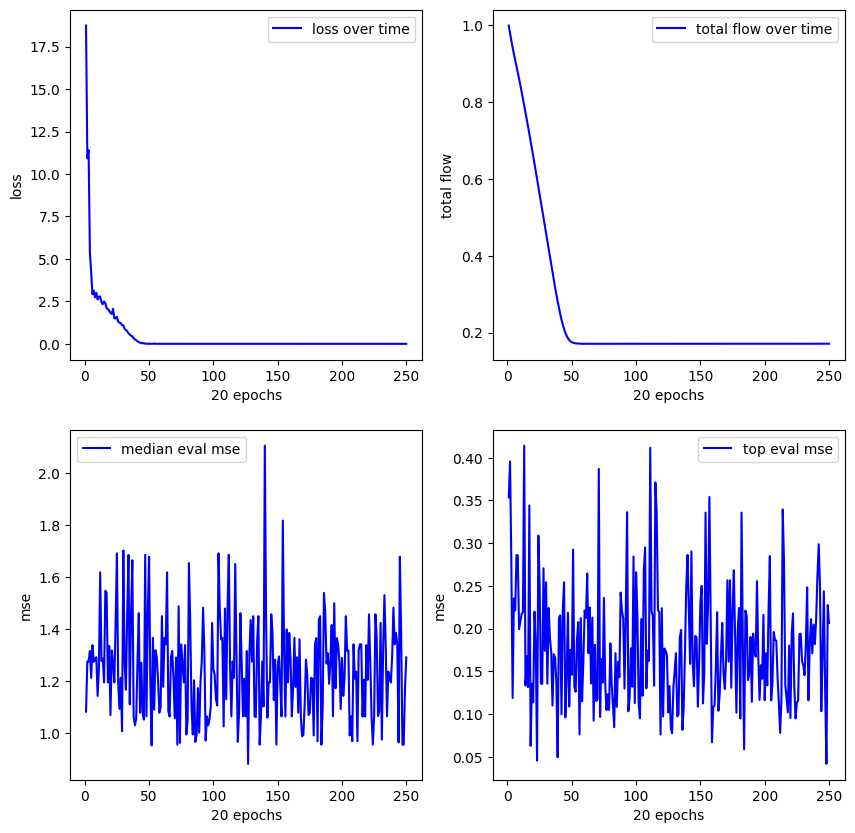

**************************************************
Experiment 15
training started with device cuda


14.664:   0%|          | 1/5000 [00:00<10:26,  7.98it/s]


new best reward (vanilla): 0.6246734857559204
mse (pre/post optimized): 0.2957134544849396/0.2957134544849396
exp(square(x1))
expr: exp(square(x1))

new best reward (vanilla): 0.7505142092704773
mse (pre/post optimized): 0.08605524897575378/0.08605524897575378
(x1) * (exp(x1))
expr: x1*exp(x1)

new best reward (vanilla): 0.9296674728393555
mse (pre/post optimized): 0.007873221300542355/0.007817193865776062
((x1) / (0.52)) + (square(x1))
expr: 1.92307692307692*x1 + square(x1)


14.664:   0%|          | 12/5000 [00:00<07:07, 11.66it/s]


new best reward (vanilla): 0.9517636895179749
mse (pre/post optimized): 0.000473420019261539/0.000473420019261539
((x1) + (x1)) * ((x1) + (0.6))
expr: 2*x1*(x1 + 0.6)


0.000: 100%|██████████| 5000/5000 [03:15<00:00, 25.62it/s]


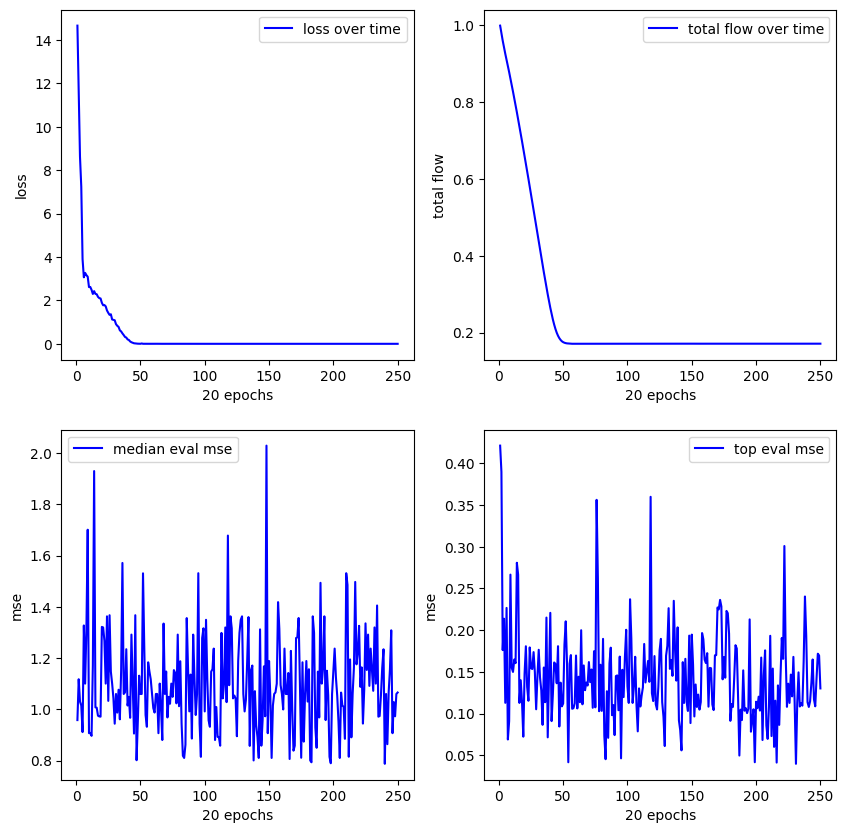

**************************************************
Experiment 16
training started with device cuda


18.923:   0%|          | 1/5000 [00:00<15:23,  5.42it/s]


new best reward (vanilla): 0.9969024658203125
mse (pre/post optimized): 0.0025050973054021597/0.002505097771063447
((0.65) + (x1)) * ((x1) + (x1))
expr: 2*x1*(x1 + 0.65)


0.000: 100%|██████████| 5000/5000 [03:14<00:00, 25.77it/s]


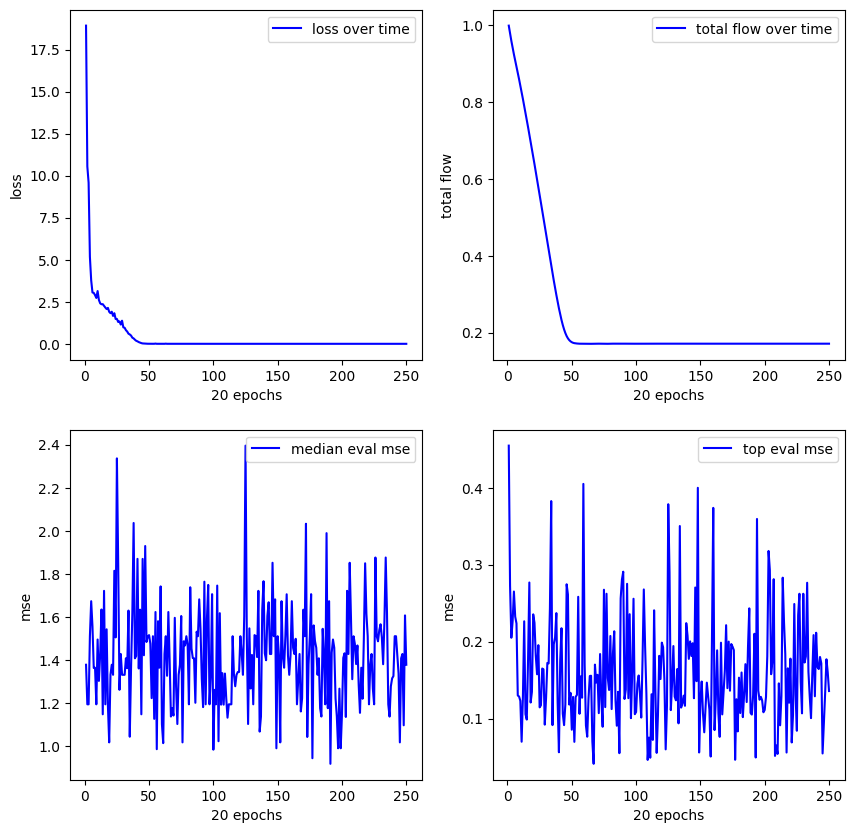

**************************************************
Experiment 17
training started with device cuda


16.504:   0%|          | 1/5000 [00:00<10:45,  7.74it/s]


new best reward (vanilla): 0.9632413387298584
mse (pre/post optimized): 0.03097562864422798/0.03097562864422798
(1.12) / ((0.4) / (x1))
expr: 2.8*x1


0.000: 100%|██████████| 5000/5000 [03:13<00:00, 25.87it/s]


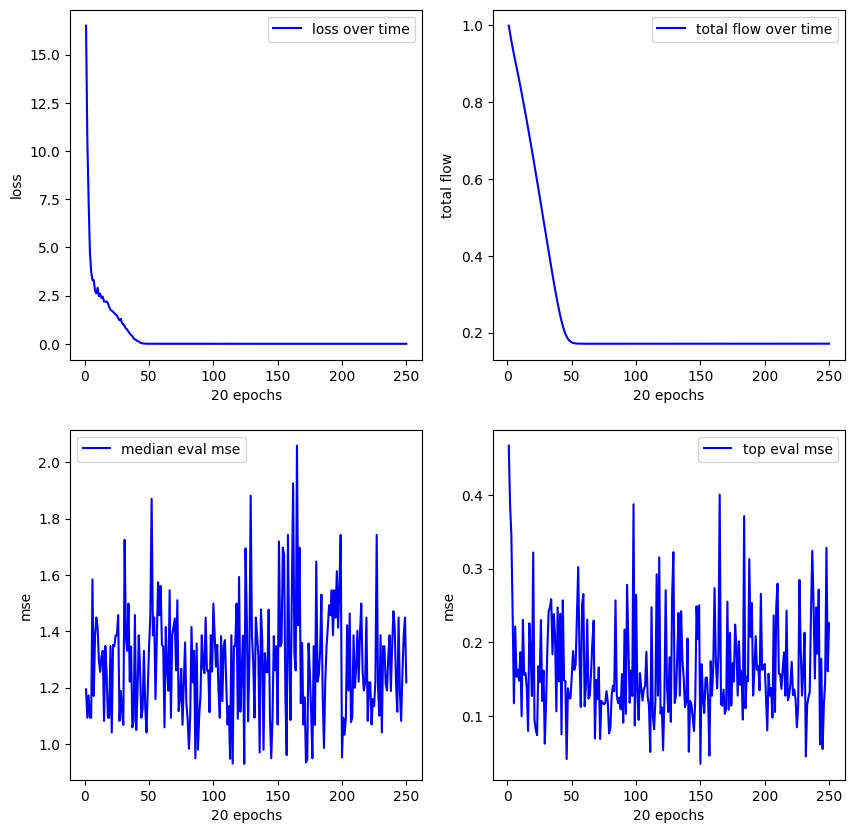

**************************************************
Experiment 18
training started with device cuda


17.780:   0%|          | 1/5000 [00:00<15:48,  5.27it/s]


new best reward (vanilla): 0.7770509719848633
mse (pre/post optimized): 0.1802138388156891/0.08615545183420181
square((x1) + (0.59))
expr: square(x1 + 0.59)


17.780:   0%|          | 9/5000 [00:00<04:42, 17.67it/s]


new best reward (vanilla): 0.9094499945640564
mse (pre/post optimized): 0.00524655357003212/0.4197341501712799
(exp(x1)) * ((0.68) * (x1))
expr: 0.68*x1*exp(x1)


0.000: 100%|██████████| 5000/5000 [03:11<00:00, 26.05it/s]


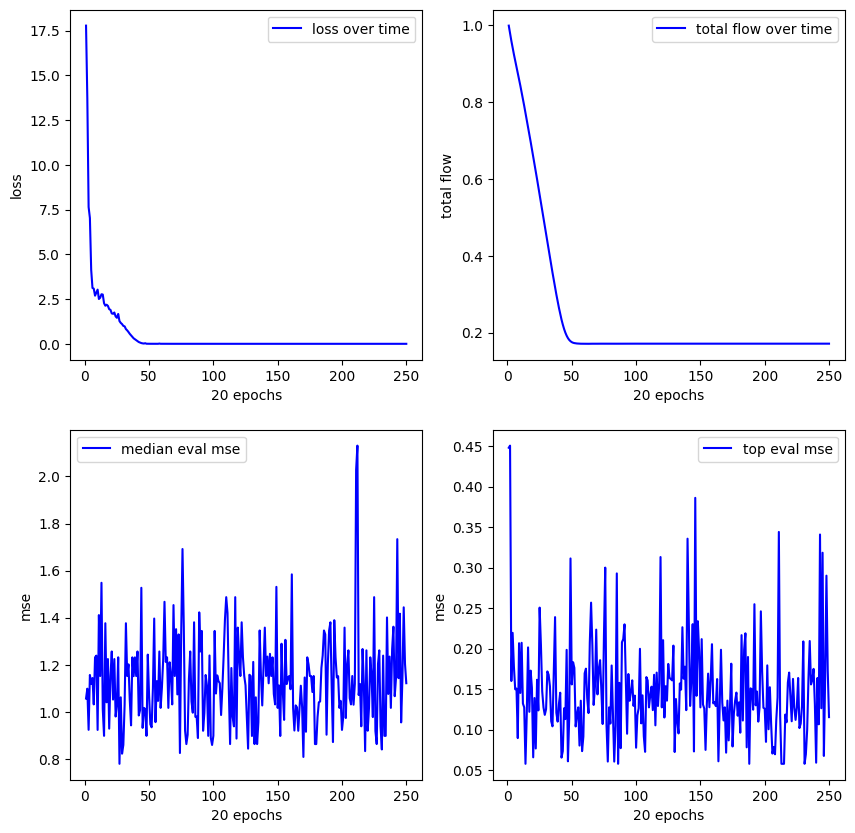

**************************************************
Experiment 19
training started with device cuda


17.526:   0%|          | 1/5000 [00:00<10:00,  8.33it/s]


new best reward (vanilla): 0.9335336089134216
mse (pre/post optimized): 0.05868879333138466/0.058831024914979935
square((0.69) + (x1))
expr: square(x1 + 0.69)


0.000: 100%|██████████| 5000/5000 [03:13<00:00, 25.85it/s]


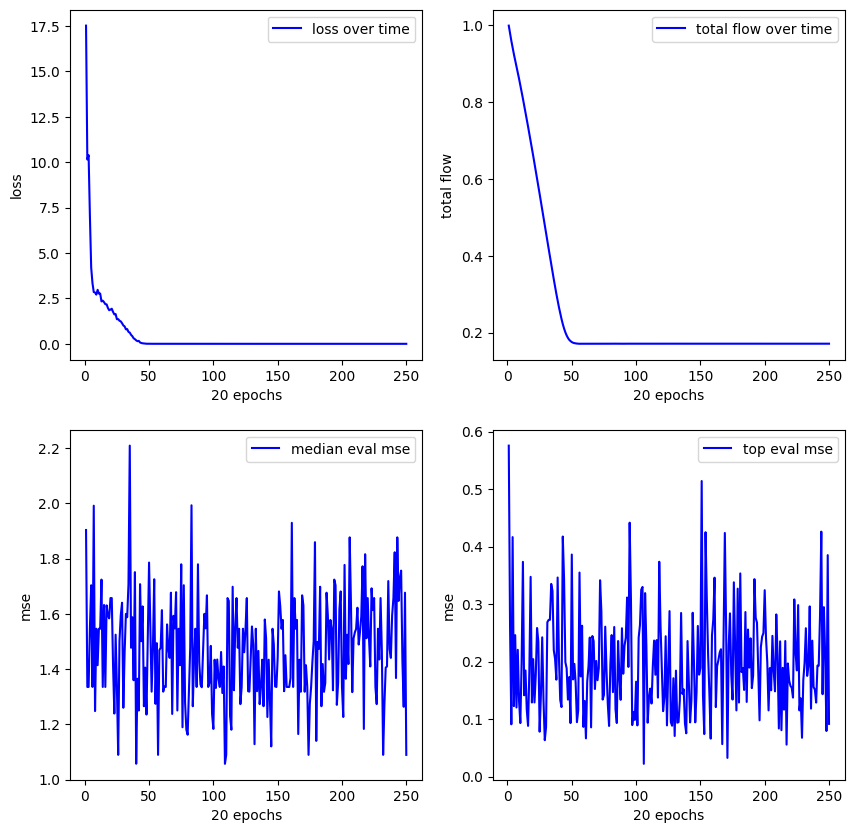

**************************************************
Experiment 20
training started with device cuda


21.311:   0%|          | 1/5000 [00:00<14:45,  5.65it/s]


new best reward (vanilla): 0.9828630089759827
mse (pre/post optimized): 0.01604575663805008/0.01604575663805008
((x1) * (x1)) + ((x1) + (x1))
expr: x1*(x1 + 2)


12.476:   0%|          | 21/5000 [00:01<07:54, 10.49it/s]


new best reward (vanilla): 0.982883095741272
mse (pre/post optimized): 0.00010137140634469688/0.00010137140634469688
(sqrt(x1)) / ((0.33) / (x1))
expr: 3.03030303030303*x1**(3/2)


0.000: 100%|██████████| 5000/5000 [03:15<00:00, 25.55it/s]


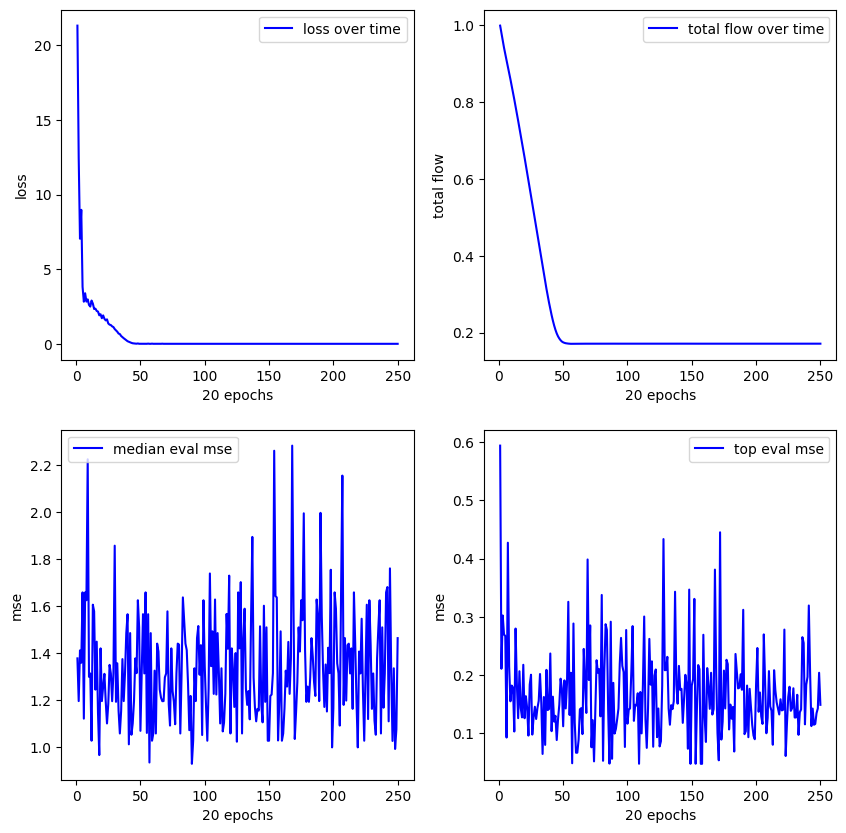

--------------------------------------------------
FUNCTION log(x + 1) Interval considered: [-0.1, 0.1]
**************************************************
Experiment 1
training started with device cuda


11.589:   0%|          | 1/5000 [00:00<10:07,  8.23it/s]


new best reward (vanilla): 0.9817607402801514
mse (pre/post optimized): 6.277012289501727e-05/6.277012289501727e-05
x1
expr: x1


0.049: 100%|██████████| 5000/5000 [03:09<00:00, 26.33it/s]


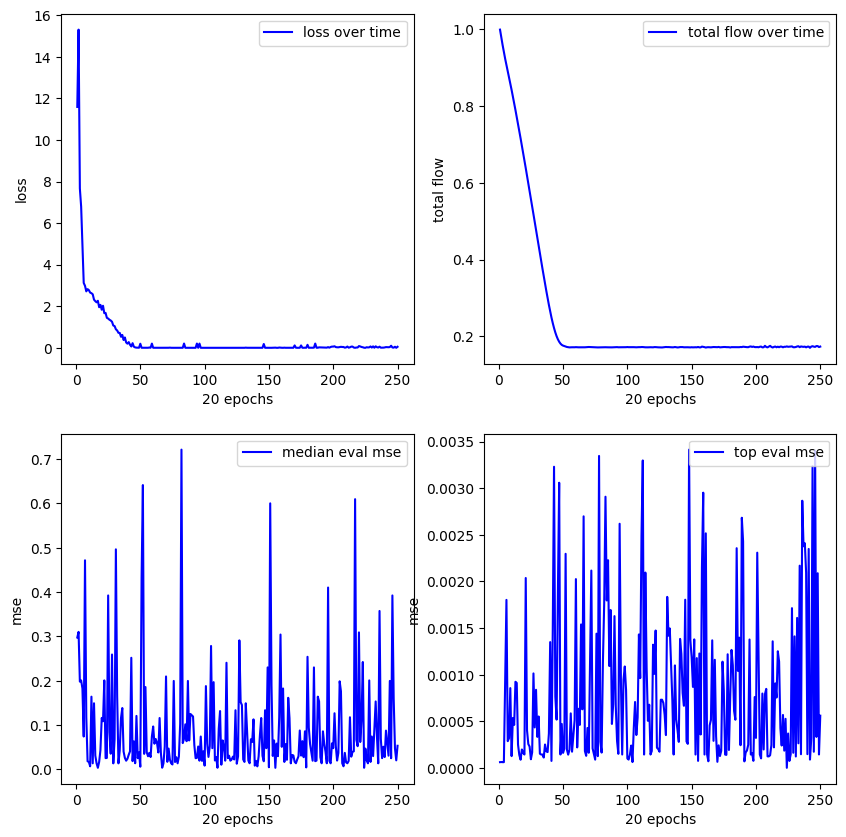

**************************************************
Experiment 2
training started with device cuda


10.759:   0%|          | 1/5000 [00:00<11:31,  7.23it/s]


new best reward (vanilla): 0.9972994327545166
mse (pre/post optimized): 8.350882126251236e-06/8.350882126251236e-06
x1
expr: x1


15.890: 100%|██████████| 5000/5000 [03:33<00:00, 23.46it/s]


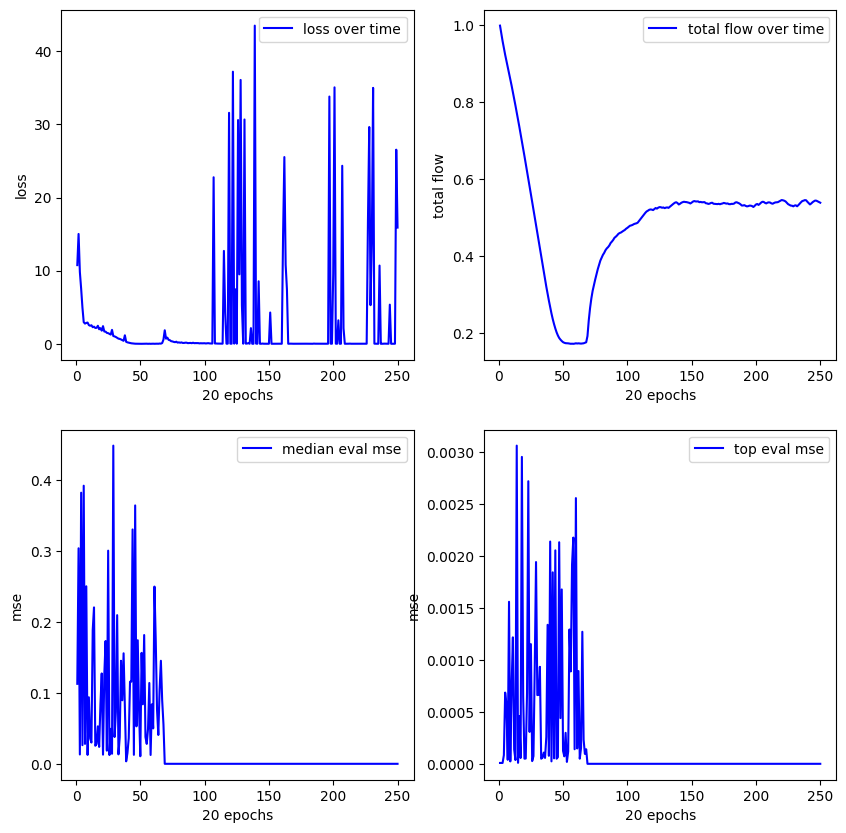

**************************************************
Experiment 3
training started with device cuda


12.496:   0%|          | 3/5000 [00:00<02:56, 28.28it/s]


new best reward (vanilla): 0.986430823802948
mse (pre/post optimized): 4.743856334243901e-05/4.743856334243901e-05
sin(x1)
expr: sin(x1)


0.016: 100%|██████████| 5000/5000 [03:10<00:00, 26.30it/s]


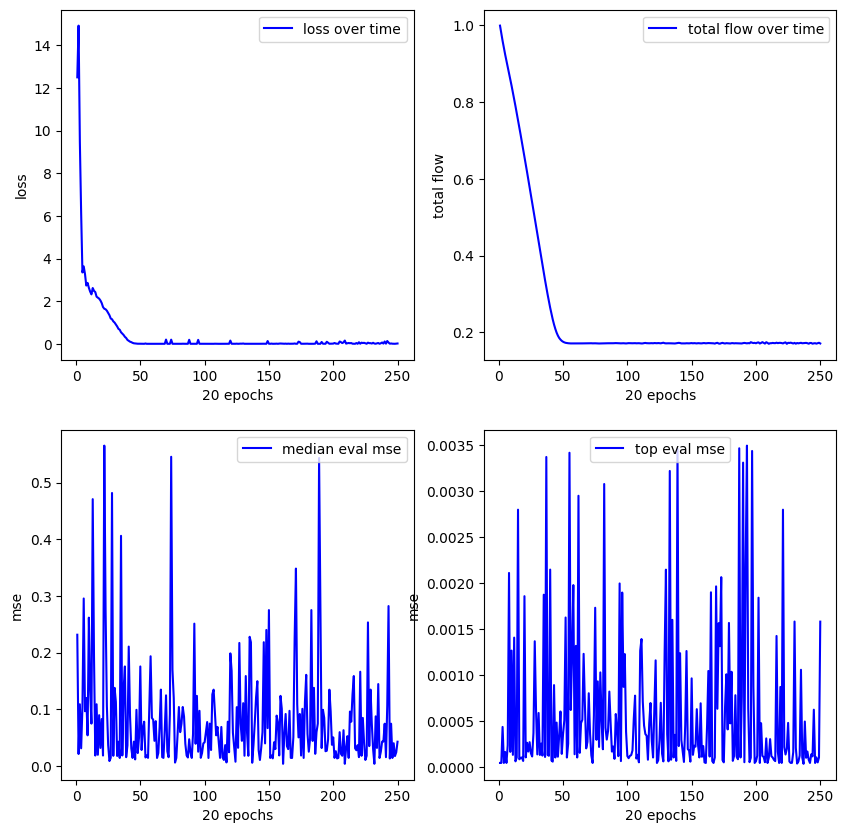

**************************************************
Experiment 4
training started with device cuda


15.333:   0%|          | 1/5000 [00:00<10:39,  7.82it/s]


new best reward (vanilla): 0.9950771331787109
mse (pre/post optimized): 1.6184887499548495e-05/1.6184887499548495e-05
x1
expr: x1


0.000: 100%|██████████| 5000/5000 [03:38<00:00, 22.91it/s] 


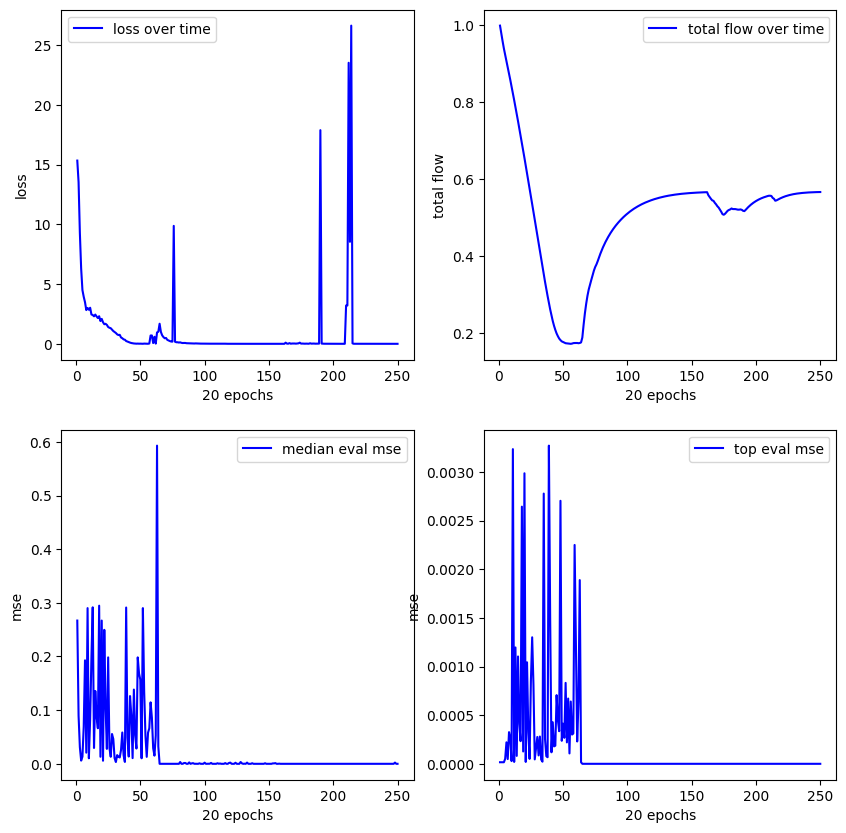

**************************************************
Experiment 5
training started with device cuda


10.462:   0%|          | 2/5000 [00:00<04:10, 19.94it/s]


new best reward (vanilla): 0.9977907538414001
mse (pre/post optimized): 7.732031008345075e-06/7.732031008345075e-06
x1
expr: x1


0.005: 100%|██████████| 5000/5000 [03:35<00:00, 23.18it/s] 


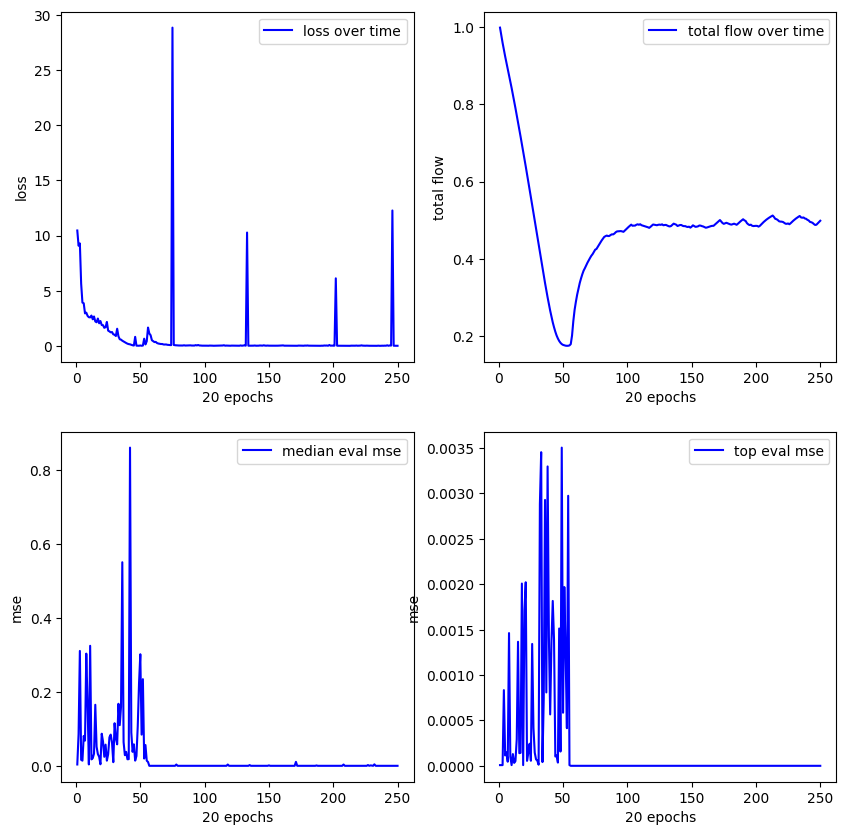

**************************************************
Experiment 6
training started with device cuda


11.565:   0%|          | 2/5000 [00:00<05:04, 16.44it/s]


new best reward (vanilla): 0.97015780210495
mse (pre/post optimized): 0.00010004137584473938/0.00010004137584473938
x1
expr: x1


0.010: 100%|██████████| 5000/5000 [03:10<00:00, 26.31it/s]


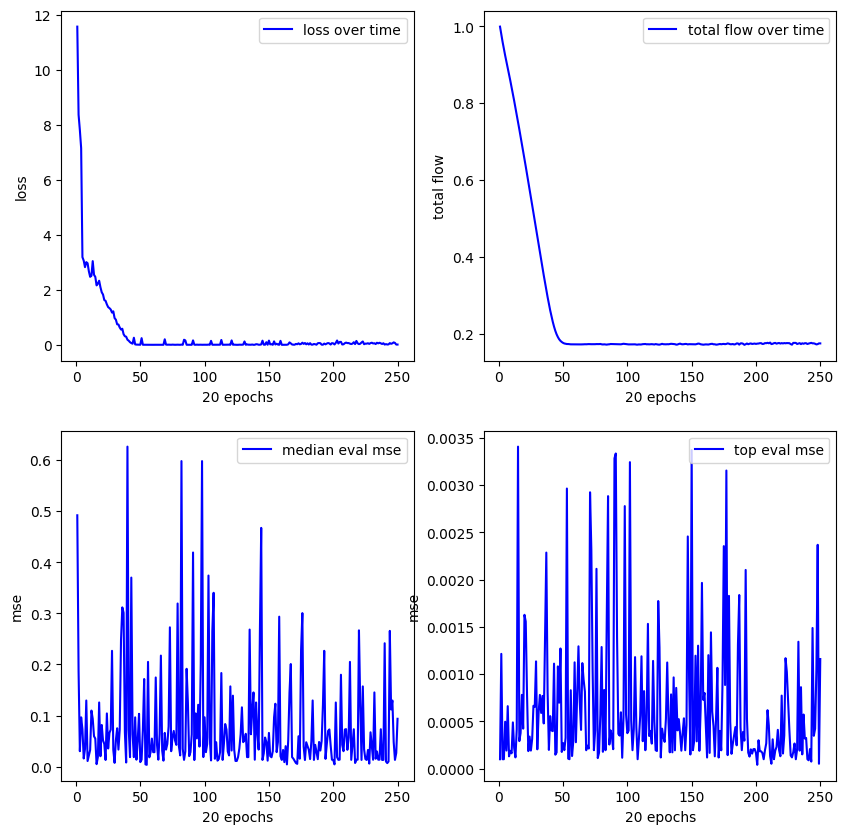

**************************************************
Experiment 7
training started with device cuda


12.033:   0%|          | 1/5000 [00:00<08:44,  9.53it/s]


new best reward (vanilla): 0.9927672147750854
mse (pre/post optimized): 2.6388435799162835e-05/2.6388435799162835e-05
sin(sin(x1))
expr: sin(sin(x1))


0.013: 100%|██████████| 5000/5000 [03:29<00:00, 23.84it/s] 


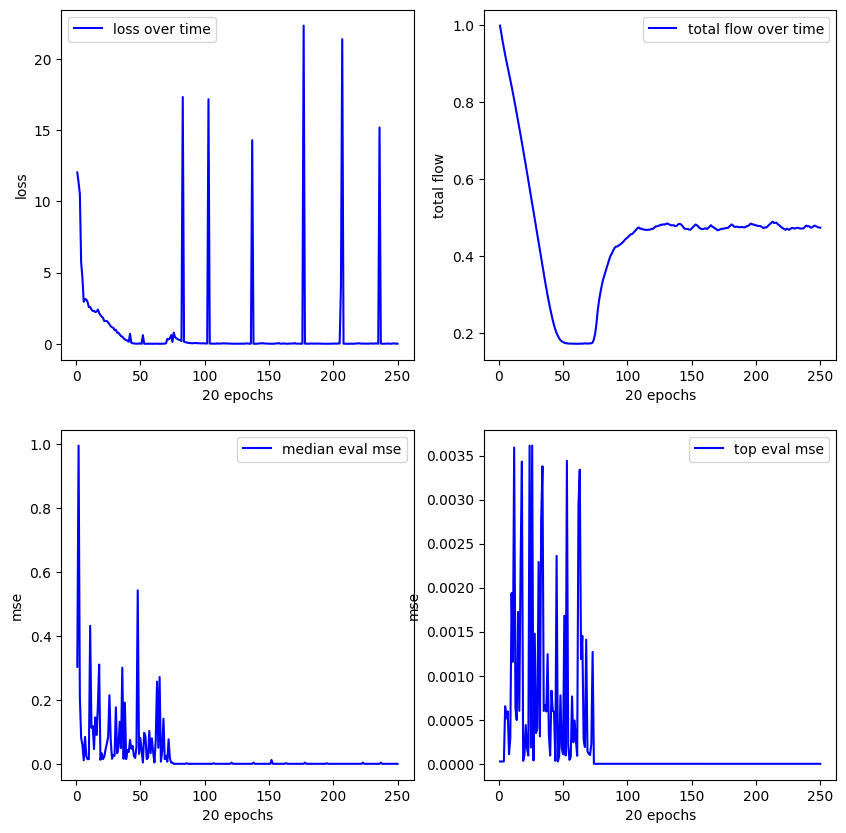

**************************************************
Experiment 8
training started with device cuda


12.078:   0%|          | 1/5000 [00:00<08:24,  9.91it/s]


new best reward (vanilla): 0.9970664381980896
mse (pre/post optimized): 1.0665464287740178e-05/1.0665464287740178e-05
x1
expr: x1


0.011: 100%|██████████| 5000/5000 [03:29<00:00, 23.83it/s] 


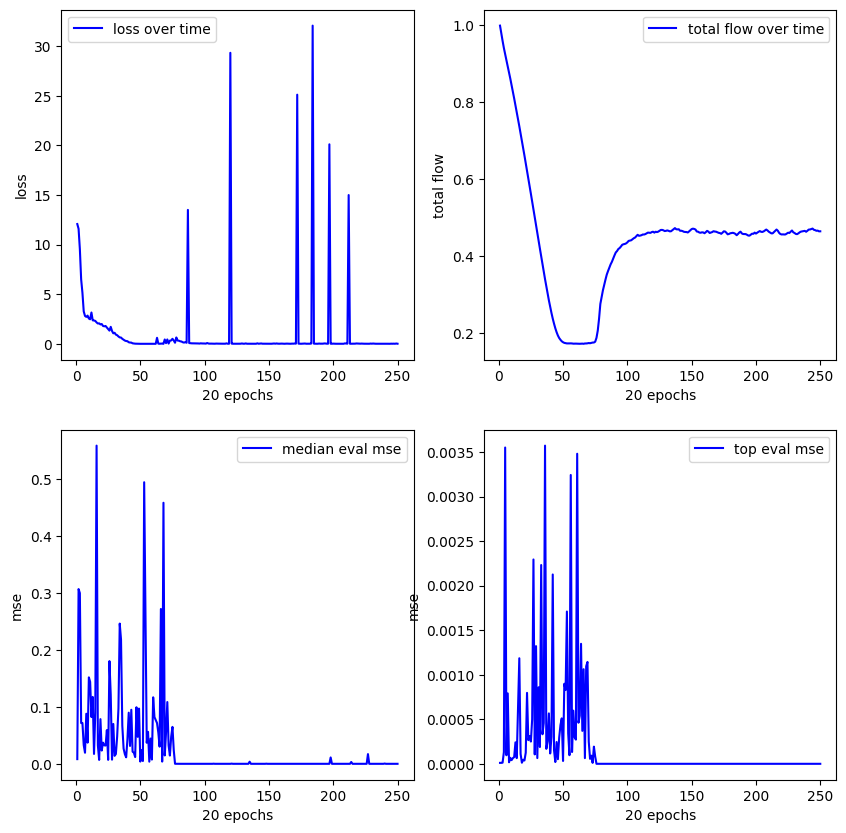

**************************************************
Experiment 9
training started with device cuda


15.983:   0%|          | 1/5000 [00:00<09:08,  9.11it/s]


new best reward (vanilla): 0.9381788969039917
mse (pre/post optimized): 0.00021203268261160702/0.00021203268261160702
x1
expr: x1


9.800:   1%|          | 54/5000 [00:02<03:23, 24.26it/s] 


new best reward (vanilla): 0.947750449180603
mse (pre/post optimized): 2.473624590493273e-06/2.47362572736165e-06
(0.17) + ((x1) - (0.19))
expr: x1 - 0.02


0.013: 100%|██████████| 5000/5000 [03:09<00:00, 26.44it/s]


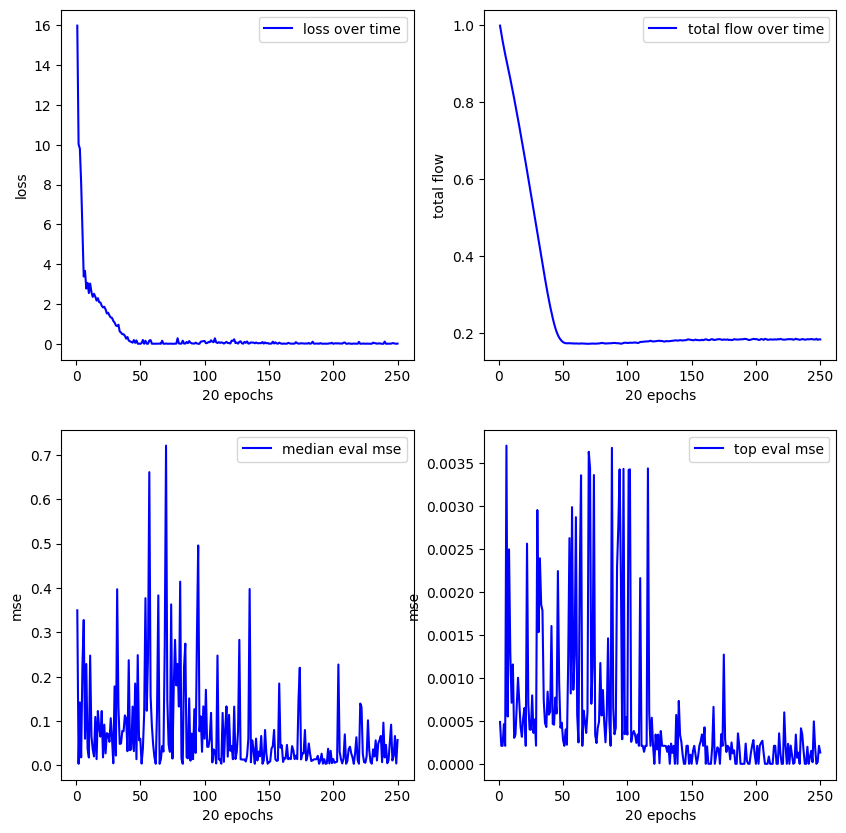

**************************************************
Experiment 10
training started with device cuda


14.170:   0%|          | 1/5000 [00:00<11:02,  7.54it/s]


new best reward (vanilla): 0.9958903193473816
mse (pre/post optimized): 1.2668877388932742e-05/1.2668877388932742e-05
(x1) / (exp(x1))
expr: x1*exp(-x1)


0.001: 100%|██████████| 5000/5000 [03:36<00:00, 23.12it/s] 


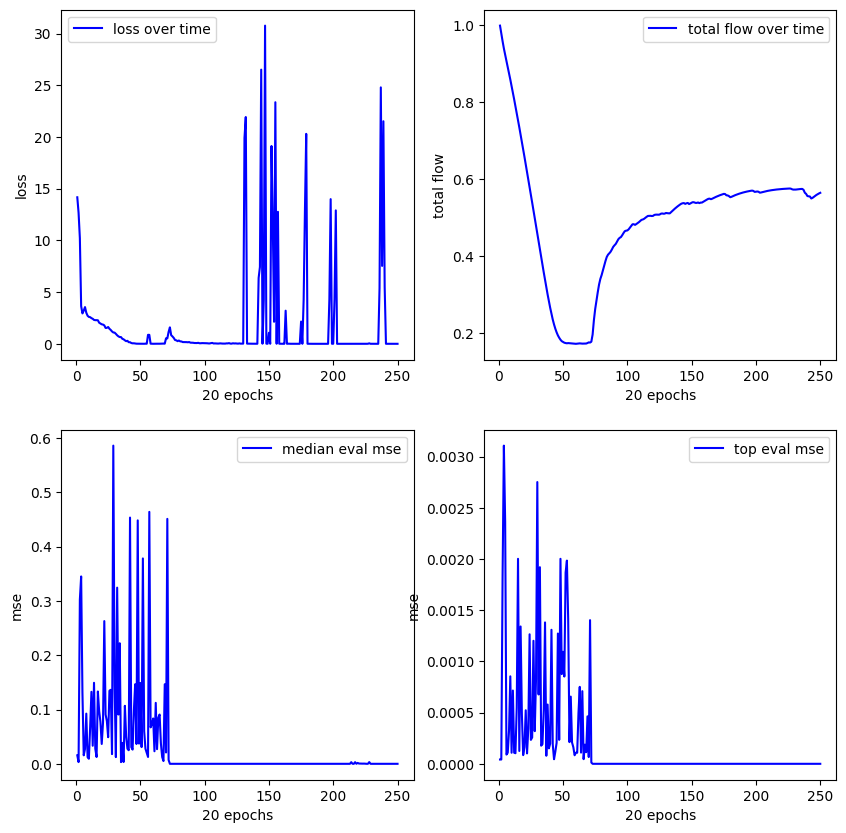

**************************************************
Experiment 11
training started with device cuda


15.800:   0%|          | 1/5000 [00:00<09:16,  8.99it/s]


new best reward (vanilla): 0.9985536336898804
mse (pre/post optimized): 4.861724391957978e-06/4.861724391957978e-06
x1
expr: x1


0.122: 100%|██████████| 5000/5000 [03:11<00:00, 26.16it/s]


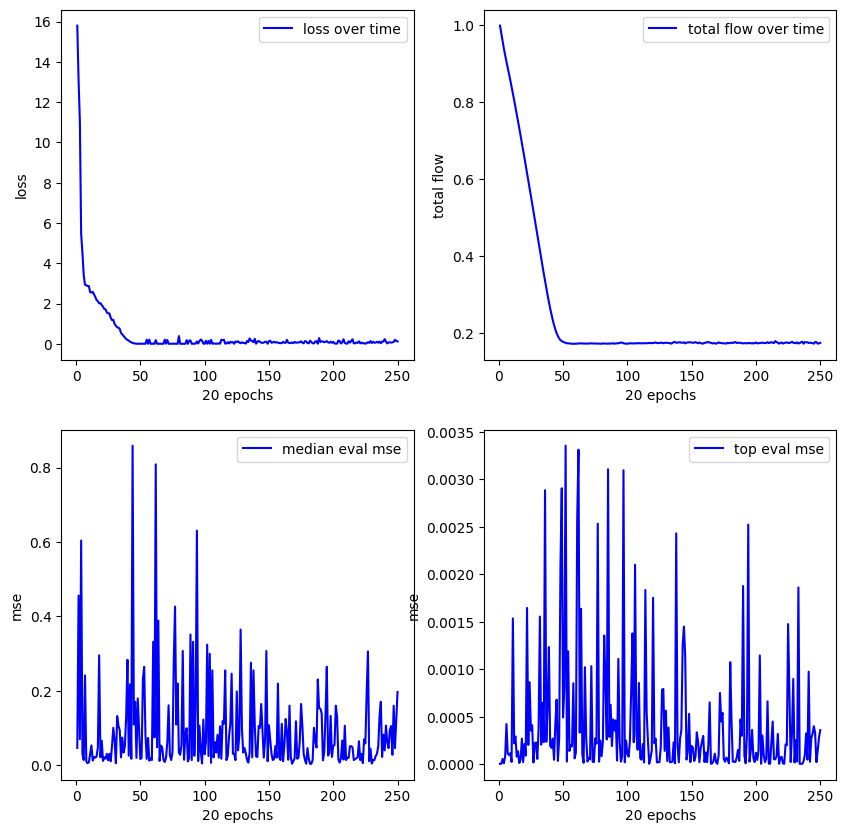

**************************************************
Experiment 12
training started with device cuda


11.482:   0%|          | 1/5000 [00:00<09:33,  8.71it/s]


new best reward (vanilla): 0.9892012476921082
mse (pre/post optimized): 3.5555713111534715e-05/3.5555713111534715e-05
log(exp(x1))
expr: log(exp(x1))


0.053: 100%|██████████| 5000/5000 [03:07<00:00, 26.66it/s]


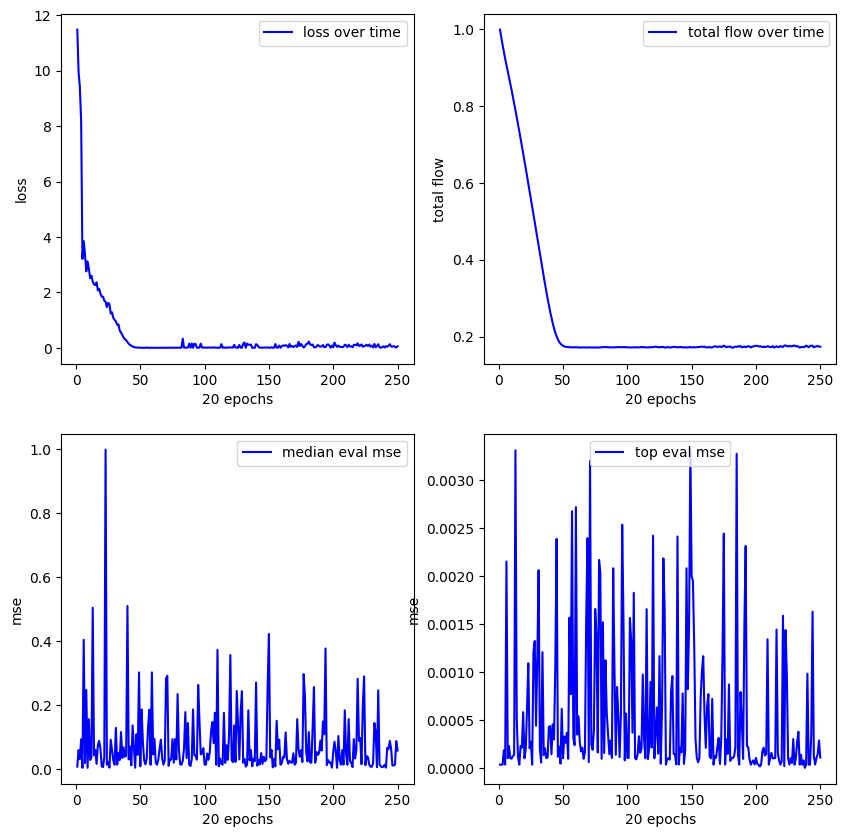

**************************************************
Experiment 13
training started with device cuda


12.658:   0%|          | 0/5000 [00:00<?, ?it/s]


new best reward (vanilla): 0.9906749129295349
mse (pre/post optimized): 3.147483221255243e-05/3.147483221255243e-05
x1
expr: x1


0.067: 100%|██████████| 5000/5000 [03:11<00:00, 26.06it/s]


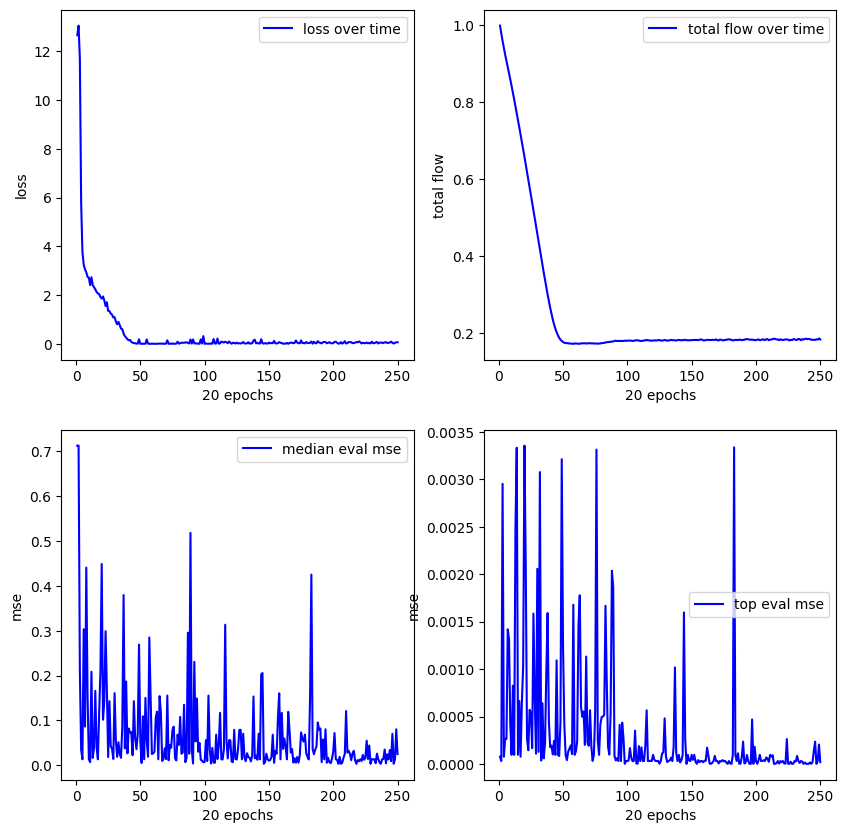

**************************************************
Experiment 14
training started with device cuda


10.716:   0%|          | 1/5000 [00:00<11:14,  7.41it/s]


new best reward (vanilla): 0.999322772026062
mse (pre/post optimized): 2.422232682874892e-06/2.422232682874892e-06
(x1) - (square(x1))
expr: x1 - square(x1)


0.022: 100%|██████████| 5000/5000 [03:10<00:00, 26.28it/s]


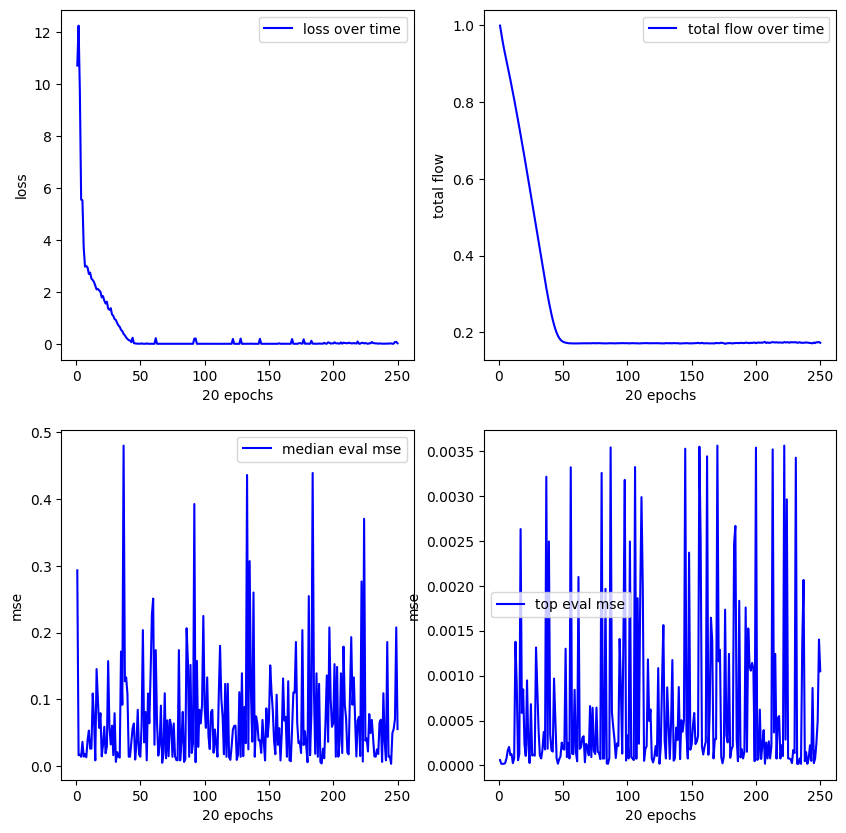

**************************************************
Experiment 15
training started with device cuda


14.355:   0%|          | 1/5000 [00:00<08:47,  9.48it/s]


new best reward (vanilla): 0.9873538017272949
mse (pre/post optimized): 3.886421109200455e-05/3.886421109200455e-05
x1
expr: x1


0.005: 100%|██████████| 5000/5000 [04:02<00:00, 20.62it/s] 


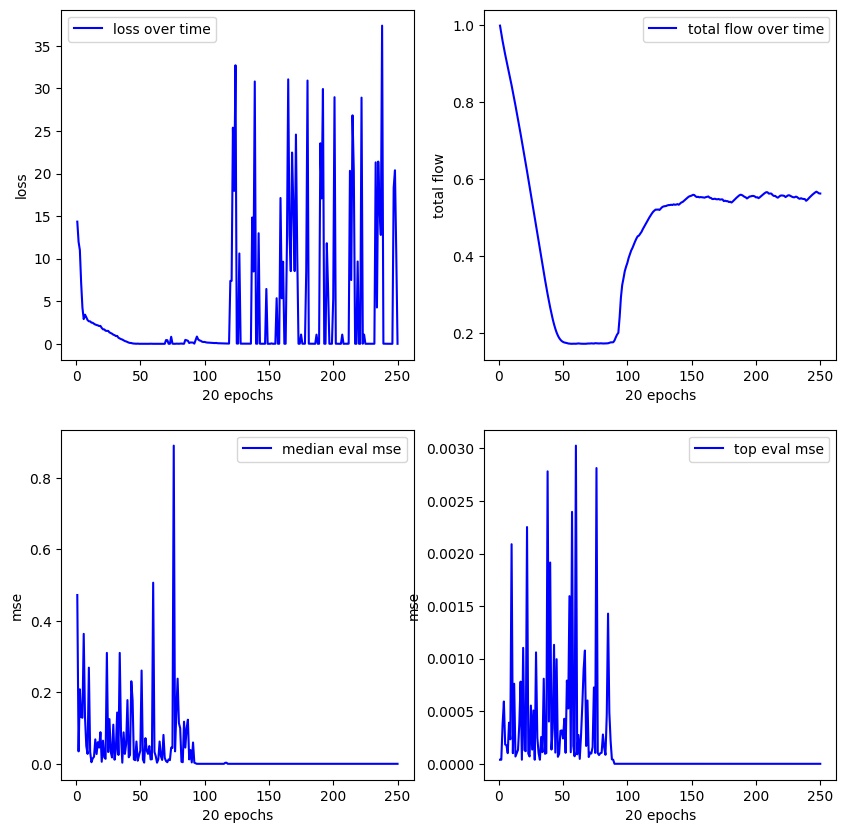

**************************************************
Experiment 16
training started with device cuda


10.717:   0%|          | 2/5000 [00:00<05:05, 16.34it/s]


new best reward (vanilla): 0.991872251033783
mse (pre/post optimized): 2.595212936284952e-05/2.595212936284952e-05
x1
expr: x1


7.119:   1%|▏         | 63/5000 [00:03<04:49, 17.07it/s] 


new best reward (vanilla): 0.9934172630310059
mse (pre/post optimized): 1.5939402686626636e-08/5.072649855719646e-07
((x1) - (1.0)) + (cos(x1))
expr: x1 + cos(x1) - 1.0


0.000: 100%|██████████| 5000/5000 [04:30<00:00, 18.49it/s] 


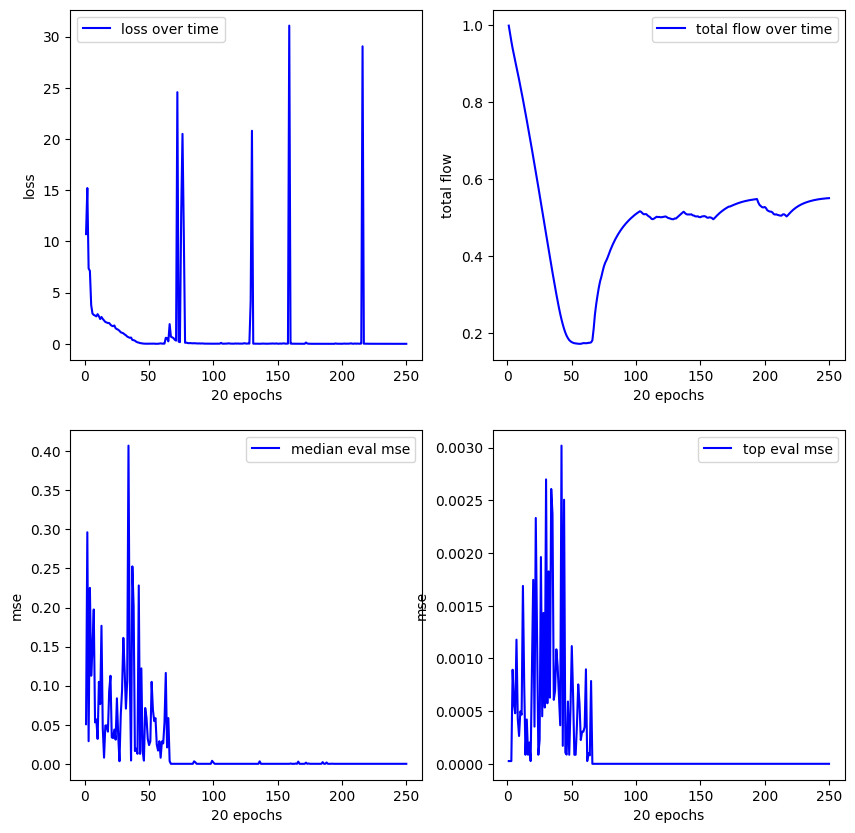

**************************************************
Experiment 17
training started with device cuda


12.052:   0%|          | 2/5000 [00:00<06:07, 13.60it/s]


new best reward (vanilla): 0.9993651509284973
mse (pre/post optimized): 2.0495267563092057e-06/2.0495267563092057e-06
sin(sin(x1))
expr: sin(sin(x1))


0.006: 100%|██████████| 5000/5000 [03:19<00:00, 25.00it/s]


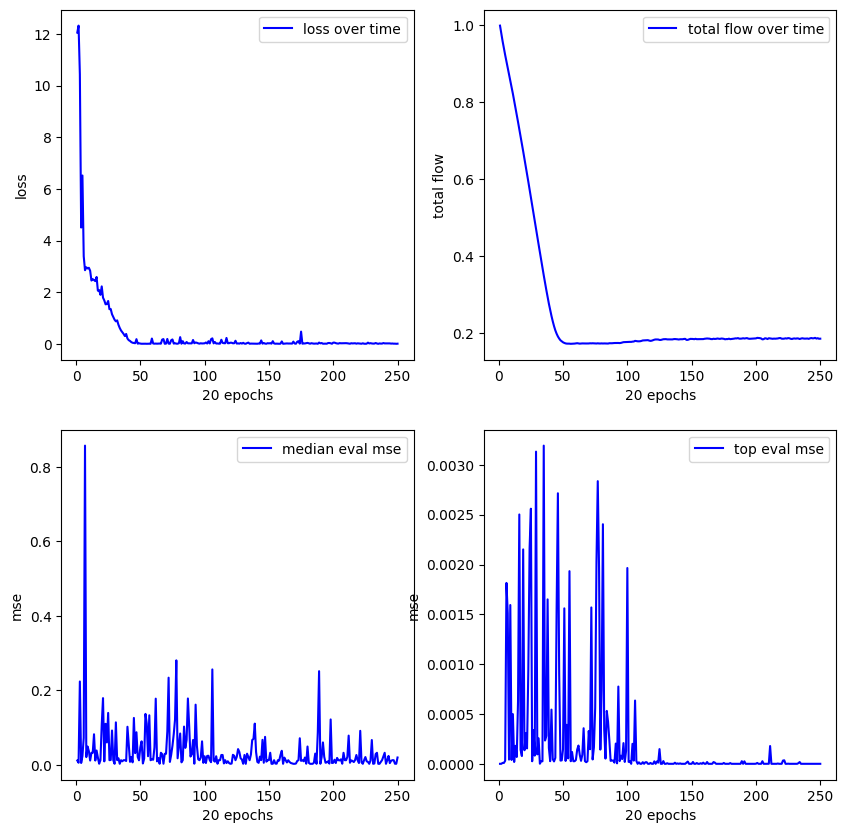

**************************************************
Experiment 18
training started with device cuda


13.977:   0%|          | 1/5000 [00:00<12:32,  6.64it/s]


new best reward (vanilla): 0.9654776453971863
mse (pre/post optimized): 0.00010647059389157221/0.00010647059389157221
(square(x1)) + (x1)
expr: x1 + square(x1)


0.036: 100%|██████████| 5000/5000 [03:01<00:00, 27.52it/s]


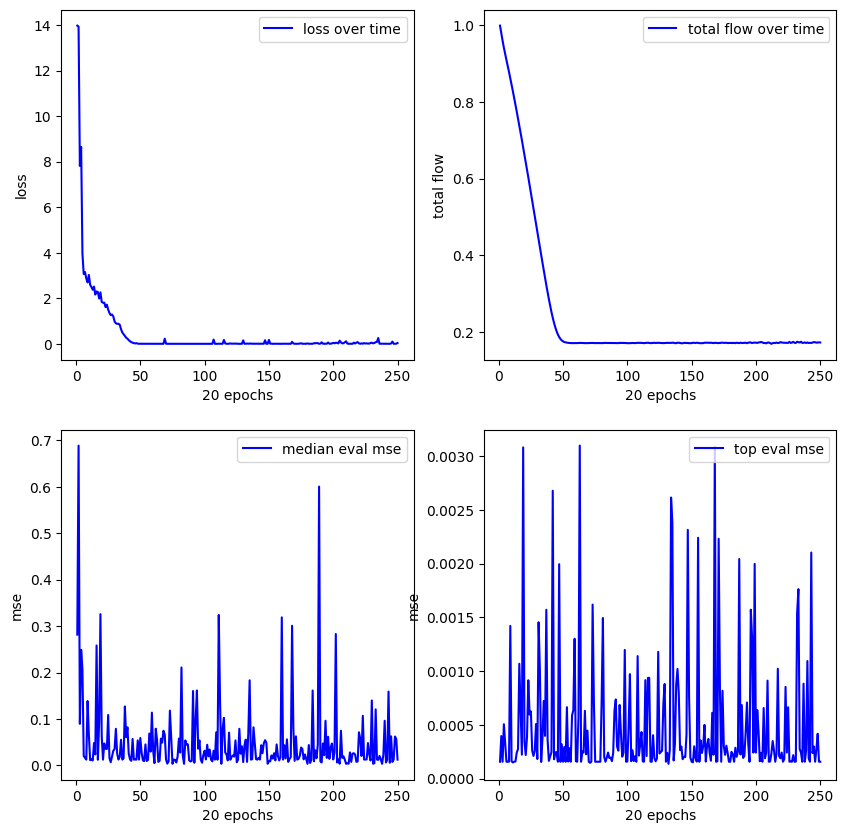

**************************************************
Experiment 19
training started with device cuda


12.801:   0%|          | 1/5000 [00:00<12:08,  6.86it/s]


new best reward (vanilla): 0.9846363663673401
mse (pre/post optimized): 4.9784484872361645e-05/4.9784484872361645e-05
(x1) - ((x1) * (x1))
expr: x1*(1 - x1)


0.000: 100%|██████████| 5000/5000 [04:13<00:00, 19.75it/s] 


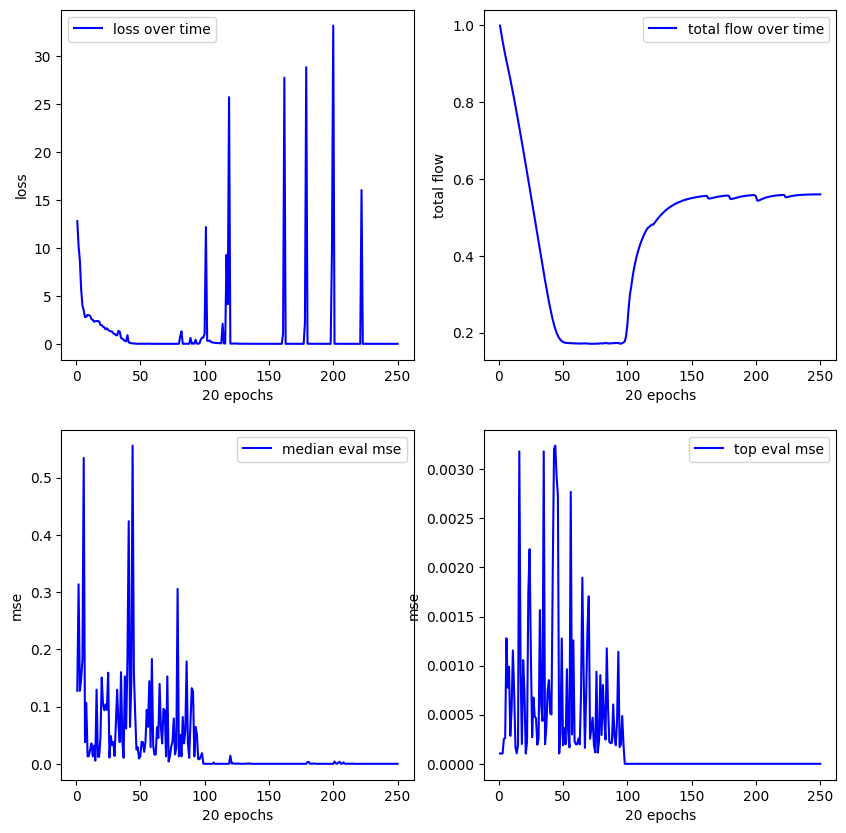

**************************************************
Experiment 20
training started with device cuda


11.212:   0%|          | 1/5000 [00:00<09:29,  8.78it/s]


new best reward (vanilla): 0.9930002689361572
mse (pre/post optimized): 2.6380052077001892e-05/2.6380052077001892e-05
(x1) + (square(x1))
expr: x1 + square(x1)


0.043: 100%|██████████| 5000/5000 [03:47<00:00, 21.98it/s]


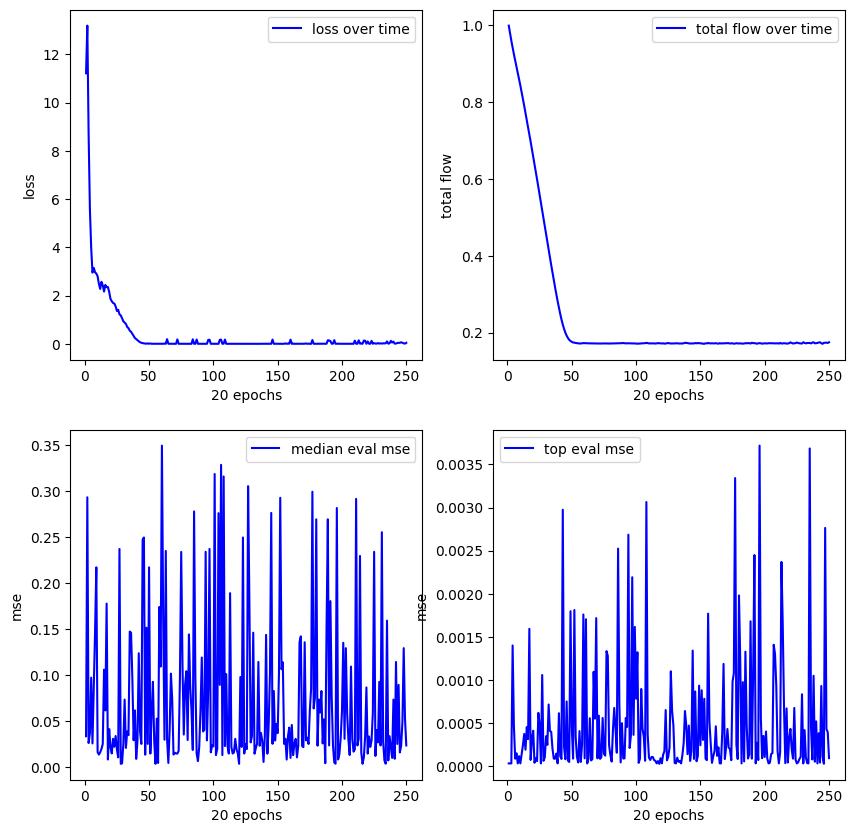

--------------------------------------------------
FUNCTION 0.5 * x Interval considered: [-0.1, 0.1]
**************************************************
Experiment 1
training started with device cuda


16.743:   0%|          | 1/5000 [00:00<09:00,  9.25it/s]


new best reward (vanilla): 0.3479788303375244
mse (pre/post optimized): 0.0005047697341069579/2.6037028874270618e-05
(1.2) * ((x1) * (0.41))
expr: 0.492*x1

new best reward (vanilla): 0.9113460183143616
mse (pre/post optimized): 4.71389212179929e-05/2.6039901058538817e-05
((x1) * (x1)) * ((0.49) / (x1))
expr: 0.49*x1


8.117:   1%|          | 42/5000 [00:01<03:45, 22.03it/s] 


new best reward (vanilla): 0.9999966025352478
mse (pre/post optimized): 4.7794667529243995e-11/0.03880136087536812
((x1) * (1.01)) + (0.2)
expr: 1.01*x1 + 0.2


2.534:  28%|██▊       | 1384/5000 [00:48<02:49, 21.35it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 1.1302536332920466e-17/0.023073874413967133
((x1) * (0.98)) + (0.16)
expr: 0.98*x1 + 0.16


0.050: 100%|██████████| 5000/5000 [03:18<00:00, 25.25it/s] 


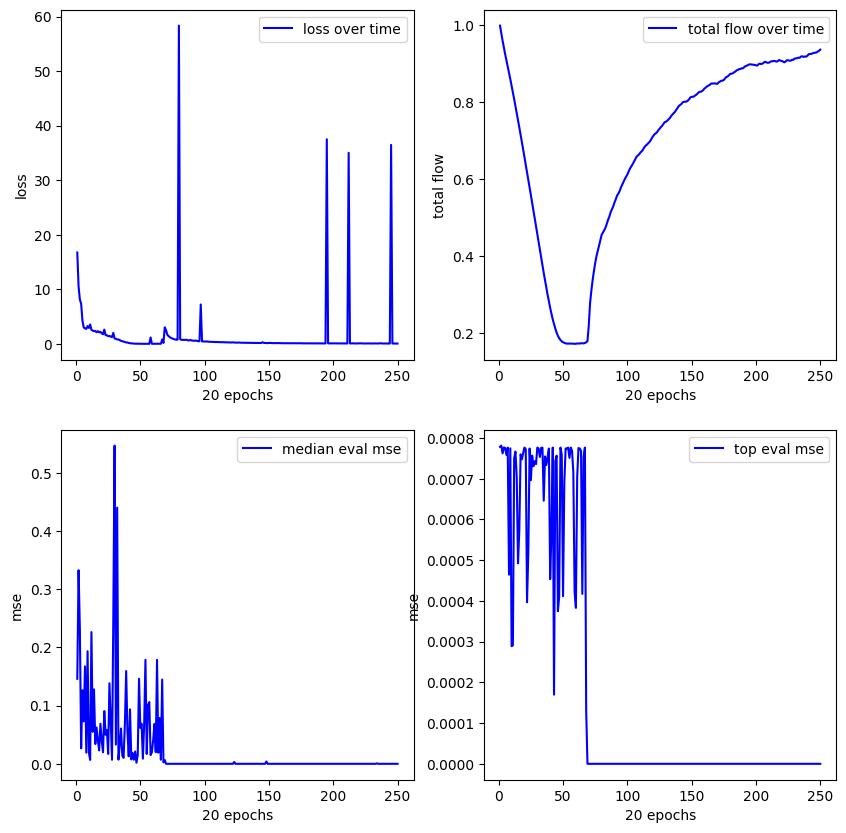

**************************************************
Experiment 2
training started with device cuda


17.467:   0%|          | 1/5000 [00:00<12:28,  6.68it/s]


new best reward (vanilla): 0.8634858131408691
mse (pre/post optimized): 0.00011490492761367932/4.034754238091409e-05
((0.86) + (x1)) * ((0.58) * (x1))
expr: 0.58*x1*(x1 + 0.86)


13.257:   1%|          | 28/5000 [00:01<03:00, 27.62it/s]


new best reward (vanilla): 0.9999943971633911
mse (pre/post optimized): 1.4855706942373814e-10/3.4372660967507684e-12
(-0.0) + ((0.5) * (x1))
expr: 0.5*x1


3.011:  21%|██▏       | 1069/5000 [00:37<02:17, 28.57it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 0.0/9.196393511956558e-05
(0.01) + ((0.51) * (x1))
expr: 0.51*x1 + 0.01


0.039: 100%|██████████| 5000/5000 [03:21<00:00, 24.79it/s] 


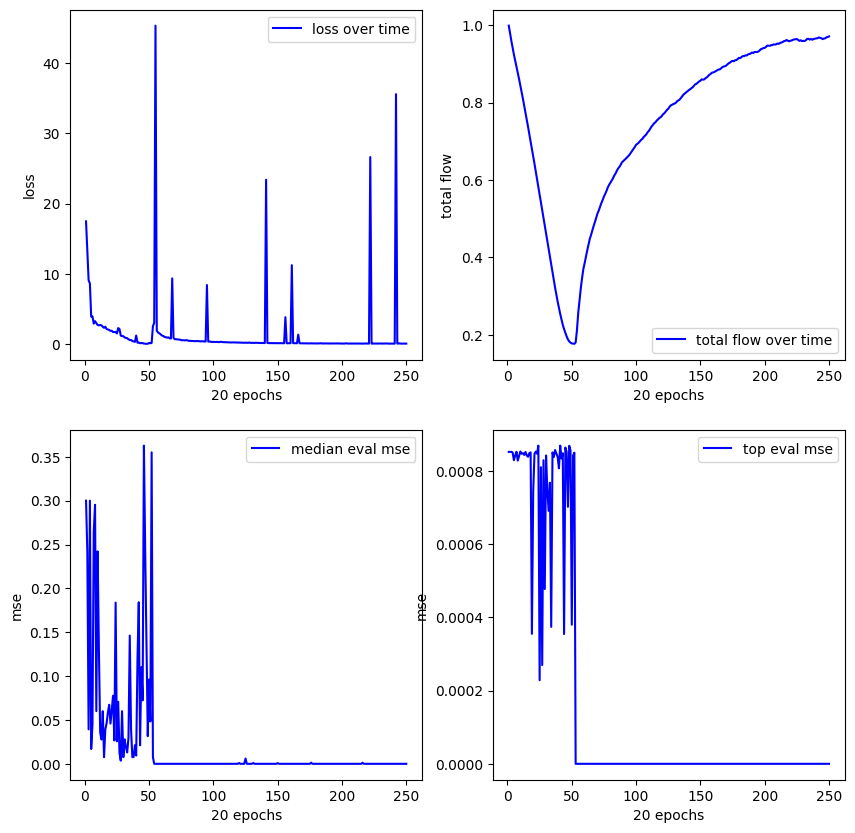

**************************************************
Experiment 3
training started with device cuda


12.016:   0%|          | 1/5000 [00:00<11:29,  7.25it/s]


new best reward (vanilla): 9.999999747378752e-05
mse (pre/post optimized): 0.7102674245834351/0.001722273649647832
((0.02) + (x1)) + (square(x1))
expr: x1 + square(x1) + 0.02

new best reward (vanilla): 0.9810552000999451
mse (pre/post optimized): 1.6028328900574706e-05/9.971916369977407e-06
(x1) - ((x1) * (0.5))
expr: 0.5*x1


11.986:   1%|          | 28/5000 [00:01<03:12, 25.86it/s]


new best reward (vanilla): 0.9999089241027832
mse (pre/post optimized): 1.1784138109760534e-09/0.000670462497510016
((x1) * (0.49)) + (0.02)
expr: 0.49*x1 + 0.02


9.407:   1%|          | 47/5000 [00:02<04:45, 17.34it/s] 


new best reward (vanilla): 0.9999979734420776
mse (pre/post optimized): 2.6729115882445642e-12/0.005073115695267916
((0.07) + (x1)) - ((0.51) * (x1))
expr: 0.49*x1 + 0.07


2.995:  23%|██▎       | 1170/5000 [00:39<01:57, 32.66it/s]


new best reward (vanilla): 0.9999998807907104
mse (pre/post optimized): 1.086263215404411e-15/6.113003792052041e-08
((x1) * (0.5)) + (-0.0)
expr: 0.5*x1


1.991:  24%|██▎       | 1186/5000 [00:39<02:02, 31.07it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 0.0/0.015187319368124008
((x1) * (0.48)) + (0.12)
expr: 0.48*x1 + 0.12


0.099: 100%|██████████| 5000/5000 [03:19<00:00, 25.01it/s] 


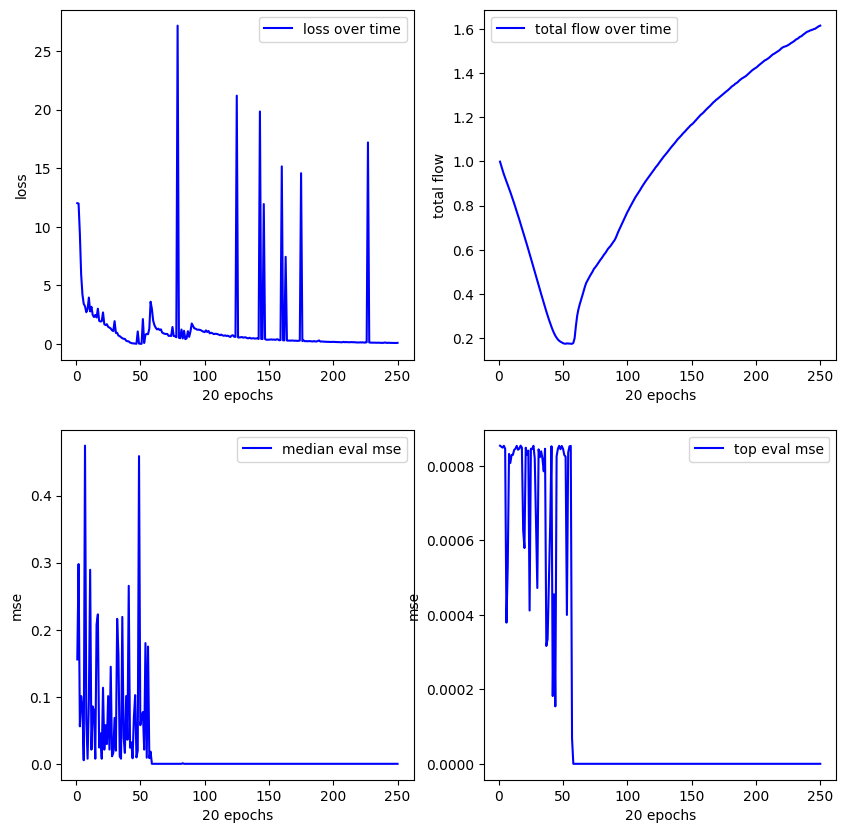

**************************************************
Experiment 4
training started with device cuda


15.114:   0%|          | 1/5000 [00:00<10:40,  7.80it/s]


new best reward (vanilla): 0.004857838153839111
mse (pre/post optimized): 0.0008558341069146991/0.0008550382917746902
(square(x1)) * (0.61)
expr: 0.61*square(x1)

new best reward (vanilla): 0.4273871183395386
mse (pre/post optimized): 0.000490306003484875/0.06458152085542679
square((0.49) + (x1))
expr: square(x1 + 0.49)

new best reward (vanilla): 0.9290440082550049
mse (pre/post optimized): 3.73874390788842e-05/1.2828621947846841e-05
(sin(x1)) * ((0.51) - (x1))
expr: (0.51 - x1)*sin(x1)


15.114:   0%|          | 11/5000 [00:00<03:11, 26.00it/s]


new best reward (vanilla): 0.9714801907539368
mse (pre/post optimized): 2.4626508547953563e-06/2.041436118815909e-06
(0.92) * ((x1) * (0.54))
expr: 0.4968*x1


3.378:   2%|▏         | 107/5000 [00:04<03:21, 24.25it/s]


new best reward (vanilla): 0.9999741315841675
mse (pre/post optimized): 3.378489502048332e-11/9.631234713567121e-16
(-0.0) + ((x1) * (0.5))
expr: 0.5*x1


1.784:  28%|██▊       | 1410/5000 [00:49<03:18, 18.09it/s] 


new best reward (vanilla): 1.0
mse (pre/post optimized): 5.604533785339967e-17/0.047774363309144974
(0.22) + ((x1) * (0.2))
expr: 0.2*x1 + 0.22


0.052: 100%|██████████| 5000/5000 [03:23<00:00, 24.58it/s] 


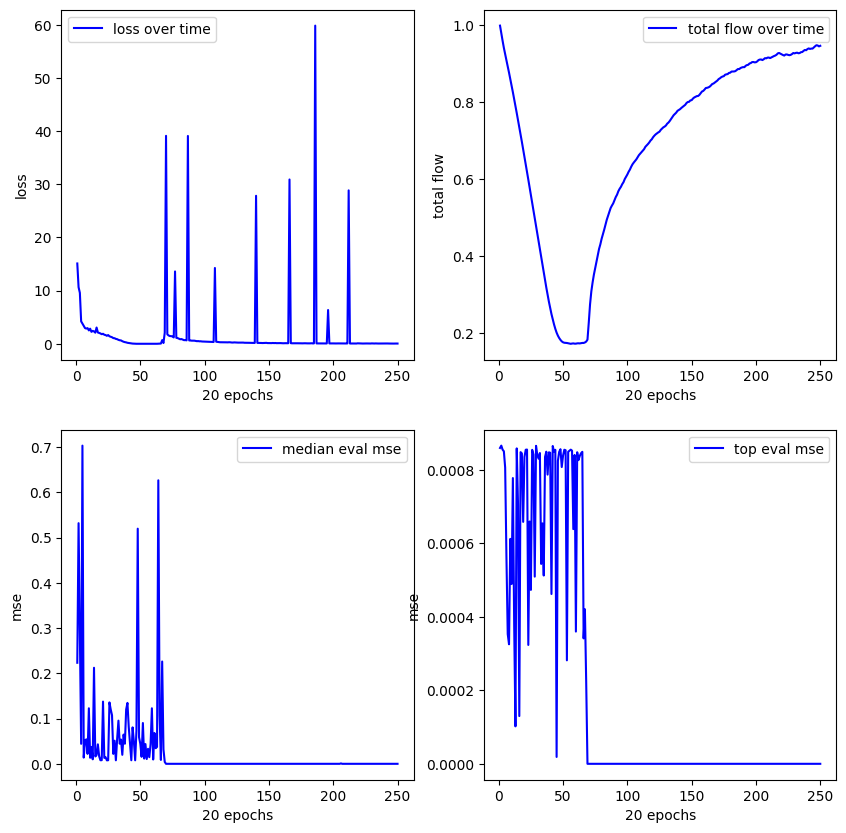

**************************************************
Experiment 5
training started with device cuda


16.969:   0%|          | 1/5000 [00:00<12:42,  6.56it/s]


new best reward (vanilla): 0.5908281803131104
mse (pre/post optimized): 0.00034982329816557467/1.4199697488948004e-06
((x1) / (x1)) * ((0.48) * (x1))
expr: 0.48*x1

new best reward (vanilla): 0.9401304125785828
mse (pre/post optimized): 1.8925748008769006e-05/4.049859470001138e-08
((x1) / (0.17)) - ((x1) / (0.19))
expr: 0.619195046439628*x1


16.969:   0%|          | 16/5000 [00:00<03:39, 22.67it/s]


new best reward (vanilla): 0.9592233300209045
mse (pre/post optimized): 4.106405810944125e-07/3.269597570465521e-08
(x1) * (0.5)
expr: 0.5*x1


3.428:   2%|▏         | 108/5000 [00:05<04:43, 17.26it/s]


new best reward (vanilla): 0.9999996423721313
mse (pre/post optimized): 1.5377364773238103e-14/0.00860714353621006
((x1) / (0.73)) + ((0.09) - (x1))
expr: 0.36986301369863*x1 + 0.09


4.202:  29%|██▊       | 1430/5000 [01:00<03:35, 16.55it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 1.7984481468789123e-17/0.05883133038878441
((x1) / (0.8)) + ((0.24) - (x1))
expr: 0.25*x1 + 0.24


0.057: 100%|██████████| 5000/5000 [04:16<00:00, 19.52it/s]


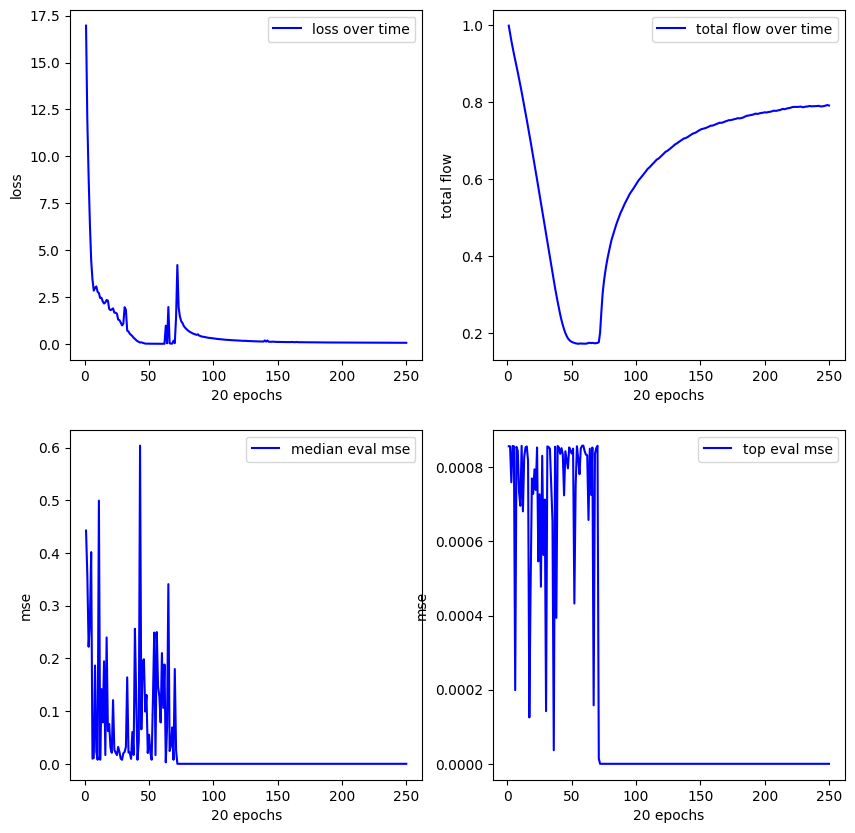

**************************************************
Experiment 6
training started with device cuda


14.621:   0%|          | 2/5000 [00:00<04:52, 17.09it/s]


new best reward (vanilla): 0.549988865852356
mse (pre/post optimized): 0.00038654619129374623/9.89397904049838e-07
(0.38) / ((0.76) / (x1))
expr: 0.5*x1

new best reward (vanilla): 0.6426485180854797
mse (pre/post optimized): 0.00015501822053920478/9.894367849483388e-07
(x1) - ((0.5) * (x1))
expr: 0.5*x1

new best reward (vanilla): 0.8661173582077026
mse (pre/post optimized): 2.4487822884111665e-05/9.970910923584597e-07
sin((0.5) * (x1))
expr: sin(0.5*x1)


14.621:   0%|          | 6/5000 [00:00<02:49, 29.50it/s]


new best reward (vanilla): 0.9421960115432739
mse (pre/post optimized): 1.0289335250490694e-06/9.893981314235134e-07
((0.94) * (x1)) - ((x1) * (0.44))
expr: 0.5*x1


4.479:   1%|▏         | 71/5000 [00:02<04:12, 19.52it/s] 


new best reward (vanilla): 0.9999480843544006
mse (pre/post optimized): 5.193487306875966e-11/0.007806671317666769
((x1) + (0.09)) - ((0.55) * (x1))
expr: 0.45*x1 + 0.09


2.653:   4%|▍         | 214/5000 [00:08<02:59, 26.67it/s]


new best reward (vanilla): 0.9999921321868896
mse (pre/post optimized): 7.927057447953967e-14/0.0021374505013227463
((x1) - (0.05)) - ((x1) * (0.34))
expr: 0.66*x1 - 0.05


6.106:  24%|██▍       | 1200/5000 [00:41<01:52, 33.69it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 2.5419471981991354e-16/2.2344983502398108e-11
((x1) - (-0.0)) - ((x1) * (0.5))
expr: 0.5*x1


6.263: 100%|██████████| 5000/5000 [04:22<00:00, 19.07it/s] 


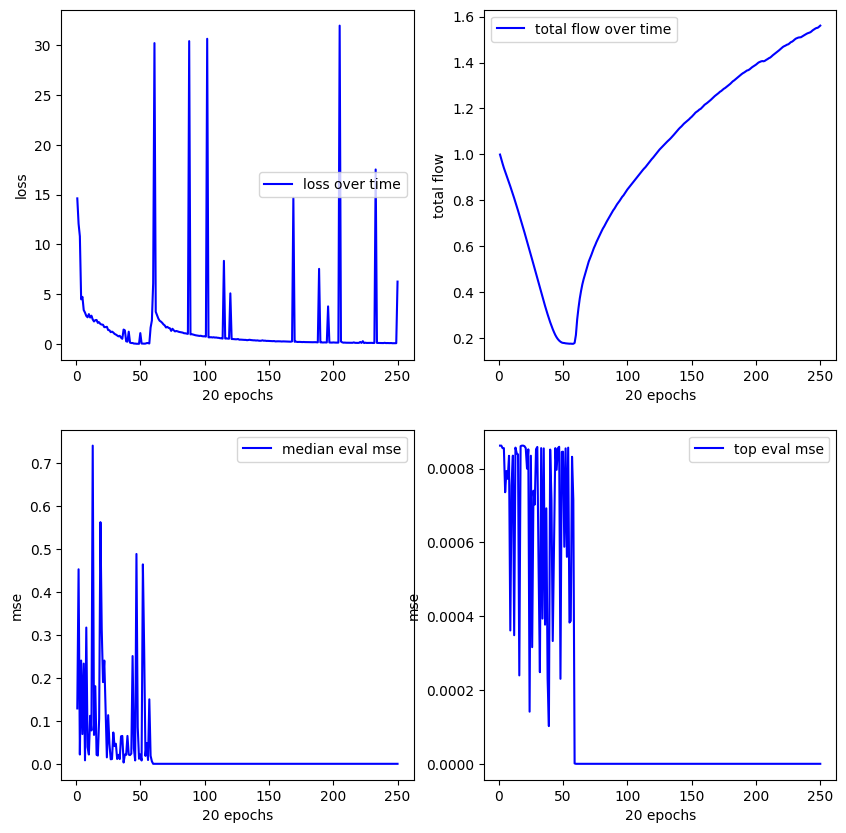

**************************************************
Experiment 7
training started with device cuda


17.260:   0%|          | 1/5000 [00:00<15:26,  5.40it/s]


new best reward (vanilla): 0.9347960352897644
mse (pre/post optimized): 5.604766192846e-05/1.9311069081595633e-06
(0.49) * (sin(x1))
expr: 0.49*sin(x1)


17.260:   0%|          | 9/5000 [00:00<04:21, 19.07it/s]


new best reward (vanilla): 0.9861786961555481
mse (pre/post optimized): 1.8853586425393587e-06/1.8853586425393587e-06
(square(x1)) / ((x1) + (x1))
expr: square(x1)/(2*x1)


3.935:   2%|▏         | 99/5000 [00:04<04:18, 18.95it/s] 


new best reward (vanilla): 0.9999280571937561
mse (pre/post optimized): 1.3536528842283957e-10/5.0527069106465206e-06
((x1) - (-0.0)) - ((x1) * (0.46))
expr: 0.54*x1


2.703:   3%|▎         | 148/5000 [00:07<04:16, 18.95it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 8.050067458317882e-17/0.0008555004023946822
(0.03) + ((x1) * (0.46))
expr: 0.46*x1 + 0.03


0.474: 100%|██████████| 5000/5000 [04:31<00:00, 18.41it/s] 


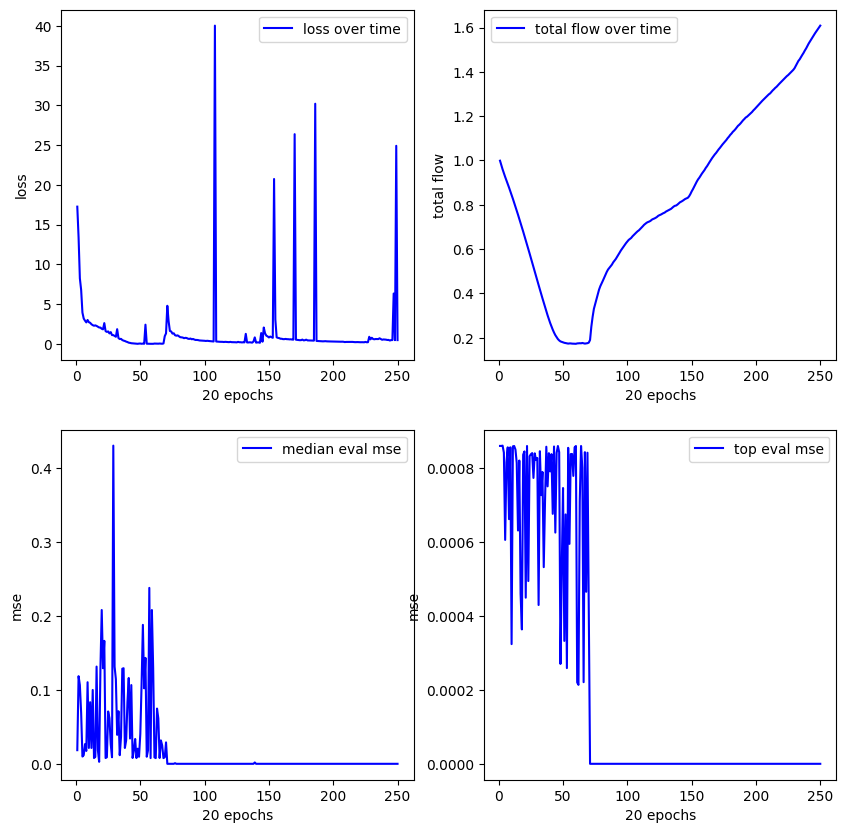

**************************************************
Experiment 8
training started with device cuda


13.800:   0%|          | 1/5000 [00:00<15:36,  5.34it/s]


new best reward (vanilla): 0.17622435092926025
mse (pre/post optimized): 0.0006678905338048935/0.0009602470090612769
square((0.16) + (x1))
expr: square(x1 + 0.16)

new best reward (vanilla): 0.9296603202819824
mse (pre/post optimized): 4.798483496415429e-05/2.4319037947861943e-06
(0.49) * (sin(x1))
expr: 0.49*sin(x1)


0.187: 100%|██████████| 5000/5000 [03:40<00:00, 22.72it/s]


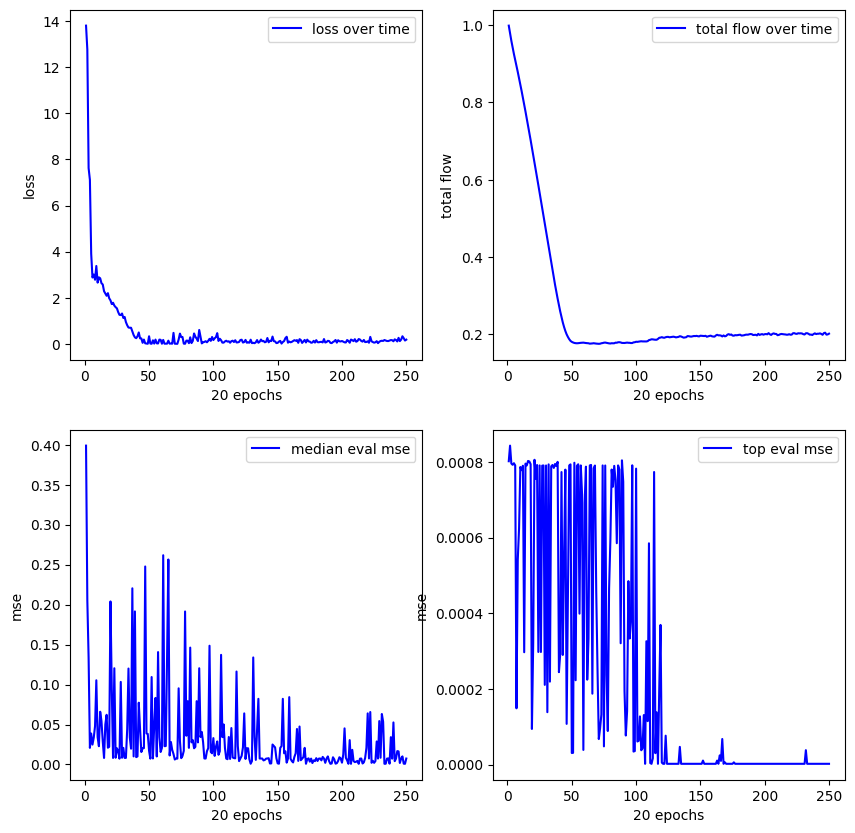

**************************************************
Experiment 9
training started with device cuda


15.335:   0%|          | 1/5000 [00:00<08:58,  9.28it/s]


new best reward (vanilla): 0.9567080140113831
mse (pre/post optimized): 3.608749102568254e-05/2.709589352889452e-06
(cos(x1)) * ((0.51) * (x1))
expr: 0.51*x1*cos(x1)


7.750:   1%|          | 47/5000 [00:02<03:45, 21.94it/s] 


new best reward (vanilla): 1.0
mse (pre/post optimized): 7.606491523964076e-18/1.8218088371213526e-06
((-0.0) + (x1)) - ((x1) * (0.5))
expr: 0.5*x1


0.051: 100%|██████████| 5000/5000 [04:01<00:00, 20.71it/s] 


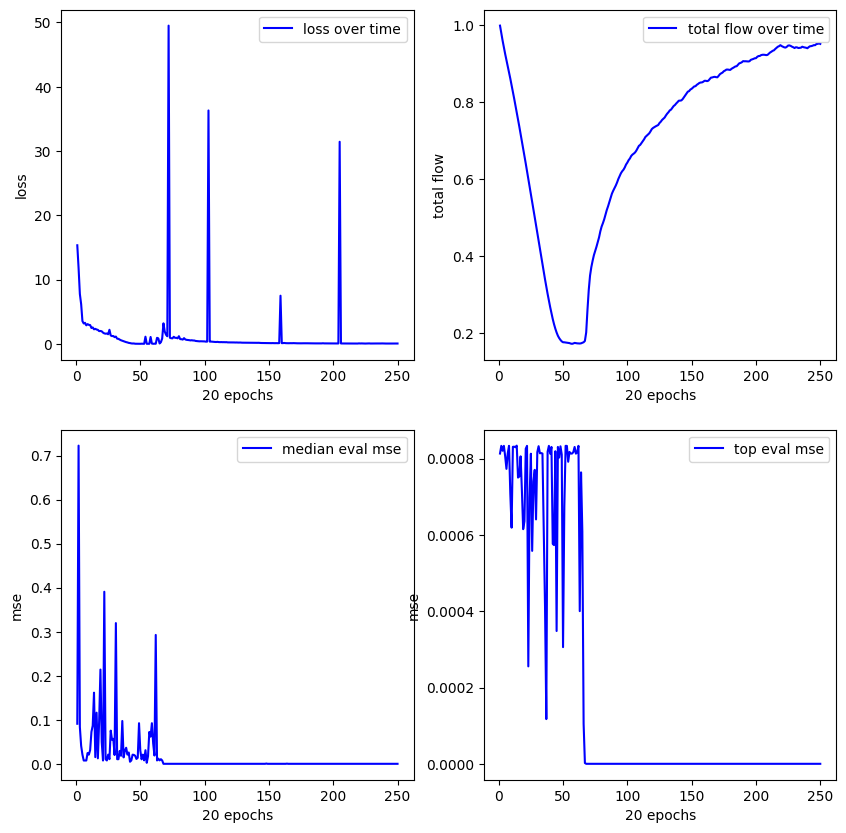

**************************************************
Experiment 10
training started with device cuda


14.739:   0%|          | 1/5000 [00:00<15:17,  5.45it/s]


new best reward (vanilla): 0.8799086809158325
mse (pre/post optimized): 0.00010146503336727619/0.00010140705853700638
(sin(x1)) * ((0.51) - (x1))
expr: (0.51 - x1)*sin(x1)


14.739:   0%|          | 20/5000 [00:01<04:32, 18.24it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 7.963464626033785e-18/8.450421660199936e-07
((x1) - (-0.01)) - ((x1) * (0.5))
expr: 0.5*x1 + 0.01


0.079: 100%|██████████| 5000/5000 [04:22<00:00, 19.06it/s] 


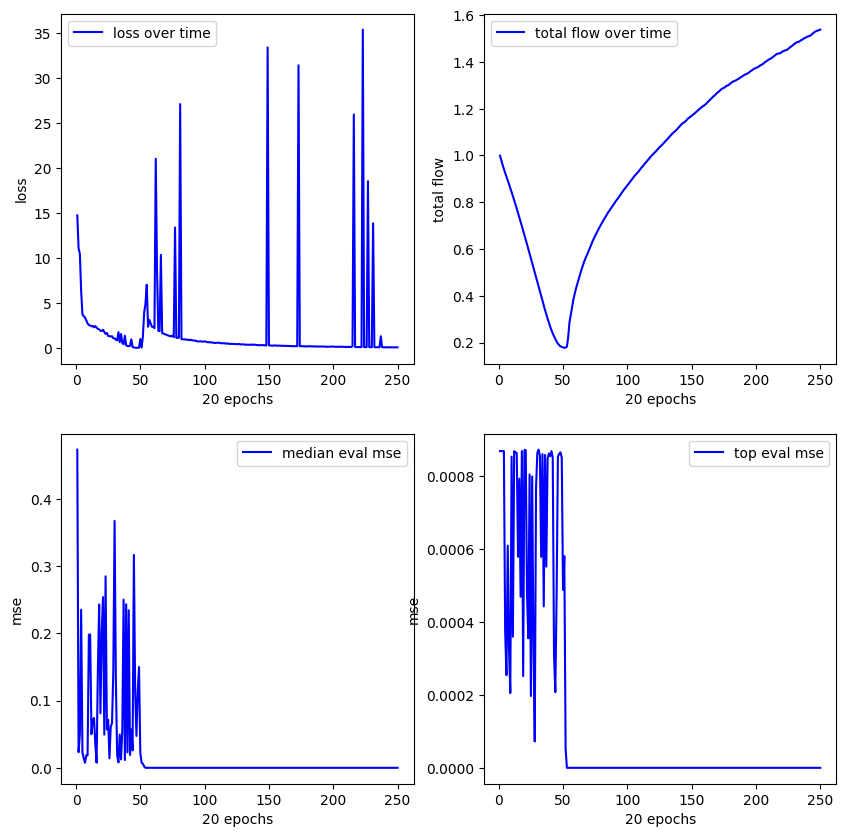

**************************************************
Experiment 11
training started with device cuda


11.964:   0%|          | 1/5000 [00:00<09:54,  8.40it/s]


new best reward (vanilla): 0.40054851770401
mse (pre/post optimized): 0.0004828522796742618/6.183258847158868e-06
(0.47) * (x1)
expr: 0.47*x1

new best reward (vanilla): 0.7933048009872437
mse (pre/post optimized): 0.00010647388262441382/3.638393764049397e-06
(square(x1)) / ((x1) / (0.5))
expr: 0.5*square(x1)/x1


11.964:   0%|          | 14/5000 [00:00<04:04, 20.41it/s]


new best reward (vanilla): 0.8996542096138
mse (pre/post optimized): 3.6383946735440986e-06/3.638433781816275e-06
(0.4) / ((0.79) / (x1))
expr: 0.506329113924051*x1


0.065: 100%|██████████| 5000/5000 [03:52<00:00, 21.46it/s]


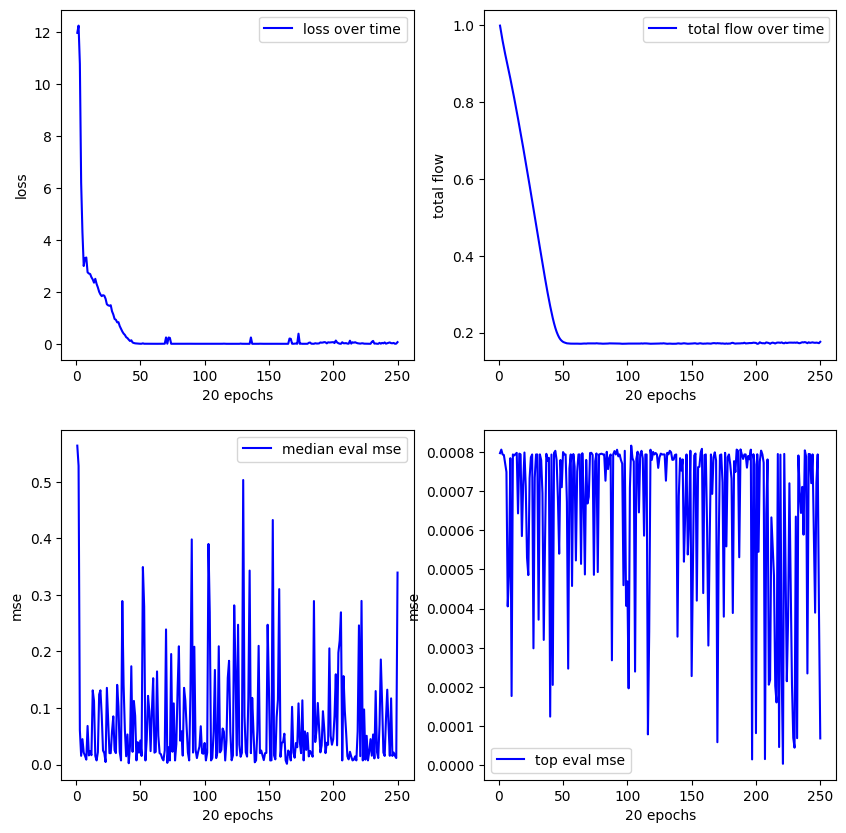

**************************************************
Experiment 12
training started with device cuda


13.911:   0%|          | 1/5000 [00:00<11:52,  7.02it/s]


new best reward (vanilla): 0.9889214634895325
mse (pre/post optimized): 9.076434253074694e-06/2.4334278805326903e-06
(0.5) * (x1)
expr: 0.5*x1


3.359:   2%|▏         | 102/5000 [00:05<03:05, 26.46it/s]


new best reward (vanilla): 0.9999999403953552
mse (pre/post optimized): 1.2221624266003234e-13/1.9263276044512168e-05
(0.0) + ((x1) * (0.55))
expr: 0.55*x1


27.605:  28%|██▊       | 1382/5000 [00:47<03:11, 18.89it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 0.0/0.08404980599880219
(0.29) + ((x1) * (-0.07))
expr: 0.29 - 0.07*x1


0.052: 100%|██████████| 5000/5000 [03:07<00:00, 26.67it/s] 


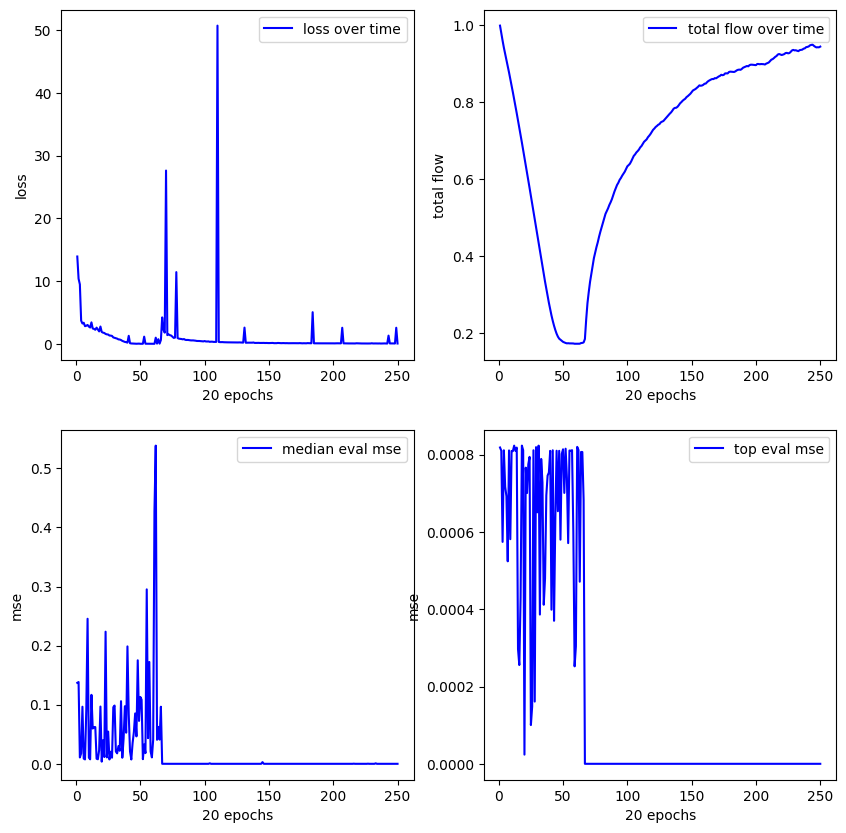

**************************************************
Experiment 13
training started with device cuda


13.510:   0%|          | 1/5000 [00:00<11:31,  7.23it/s]


new best reward (vanilla): 0.002206087112426758
mse (pre/post optimized): 0.000717958202585578/0.000717958202585578
log(cos(x1))
expr: log(cos(x1))

new best reward (vanilla): 0.7891772985458374
mse (pre/post optimized): 0.00015139726747293025/8.005658855836373e-06
(sin(x1)) * (0.5)
expr: 0.5*sin(x1)

new best reward (vanilla): 0.9361423254013062
mse (pre/post optimized): 8.222961696446873e-06/7.985614502104e-06
((0.51) * (x1)) + (square(x1))
expr: 0.51*x1 + square(x1)


0.005:  59%|█████▊    | 2929/5000 [01:34<00:51, 40.49it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 2.160083073444848e-17/1.926139356294233e-17
((x1) / (0.67)) - ((-0.0) + (x1))
expr: 0.492537313432836*x1


0.064: 100%|██████████| 5000/5000 [03:00<00:00, 27.77it/s] 


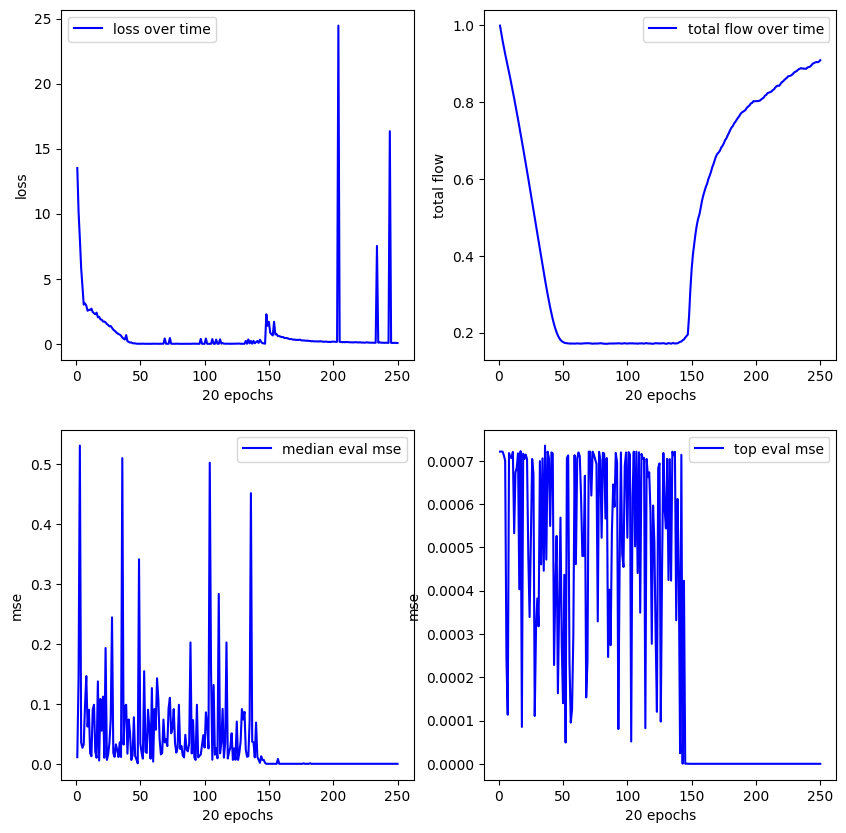

**************************************************
Experiment 14
training started with device cuda


15.732:   0%|          | 1/5000 [00:00<10:37,  7.84it/s]


new best reward (vanilla): 0.9882919788360596
mse (pre/post optimized): 1.0715710232034326e-05/3.463747816567775e-06
(0.53) * (x1)
expr: 0.53*x1


10.120:   1%|          | 44/5000 [00:01<03:18, 24.93it/s]


new best reward (vanilla): 0.9994351863861084
mse (pre/post optimized): 5.319898965794323e-10/1.3712492513001662e-12
((0.0) + (x1)) - ((x1) * (0.5))
expr: 0.5*x1


2.214:  36%|███▌      | 1783/5000 [00:56<02:15, 23.76it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 7.3898372051048e-18/3.4233245127524015e-09
((0.0) + (x1)) - ((x1) * (0.5))
expr: 0.5*x1


0.038: 100%|██████████| 5000/5000 [03:28<00:00, 23.97it/s] 


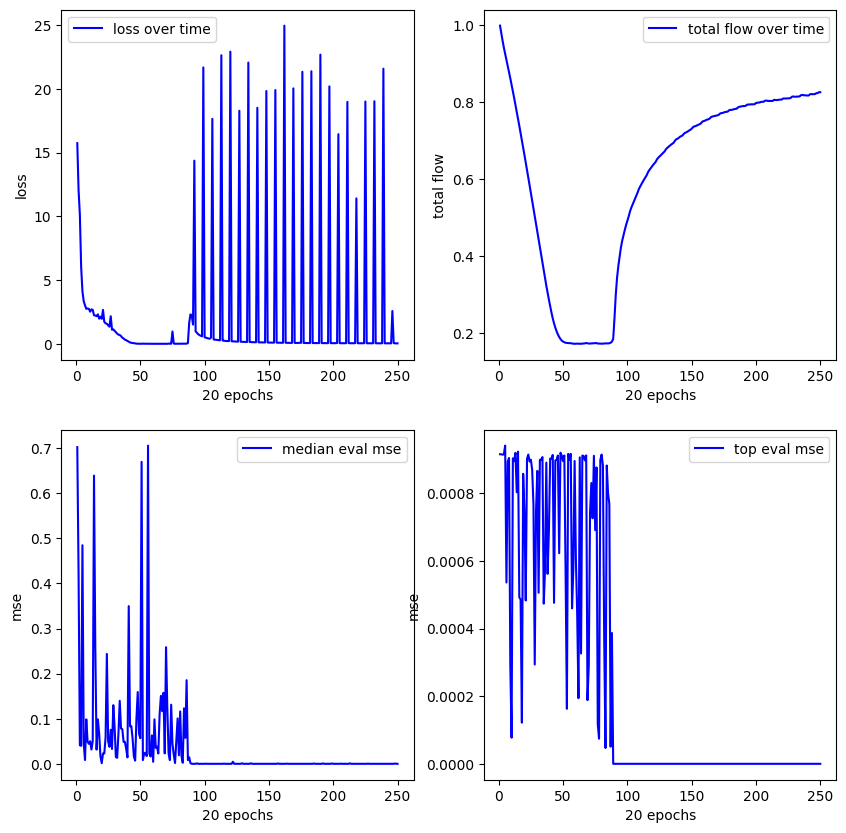

**************************************************
Experiment 15
training started with device cuda


16.444:   0%|          | 1/5000 [00:00<11:08,  7.48it/s]


new best reward (vanilla): 0.989384651184082
mse (pre/post optimized): 9.289429726777598e-06/9.289429726777598e-06
(square(x1)) / ((x1) + (x1))
expr: square(x1)/(2*x1)


5.920:   1%|▏         | 63/5000 [00:02<03:33, 23.09it/s] 


new best reward (vanilla): 0.9982514977455139
mse (pre/post optimized): 7.062039397709441e-09/8.71857139372878e-07
((-0.0) + (x1)) - ((x1) * (0.52))
expr: 0.48*x1


2.764:  46%|████▌     | 2281/5000 [01:13<01:56, 23.41it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 3.5473374548051595e-16/4.7958968934835866e-05
((0.0) + (x1)) - ((x1) * (0.5))
expr: 0.5*x1


0.063: 100%|██████████| 5000/5000 [03:05<00:00, 26.95it/s] 


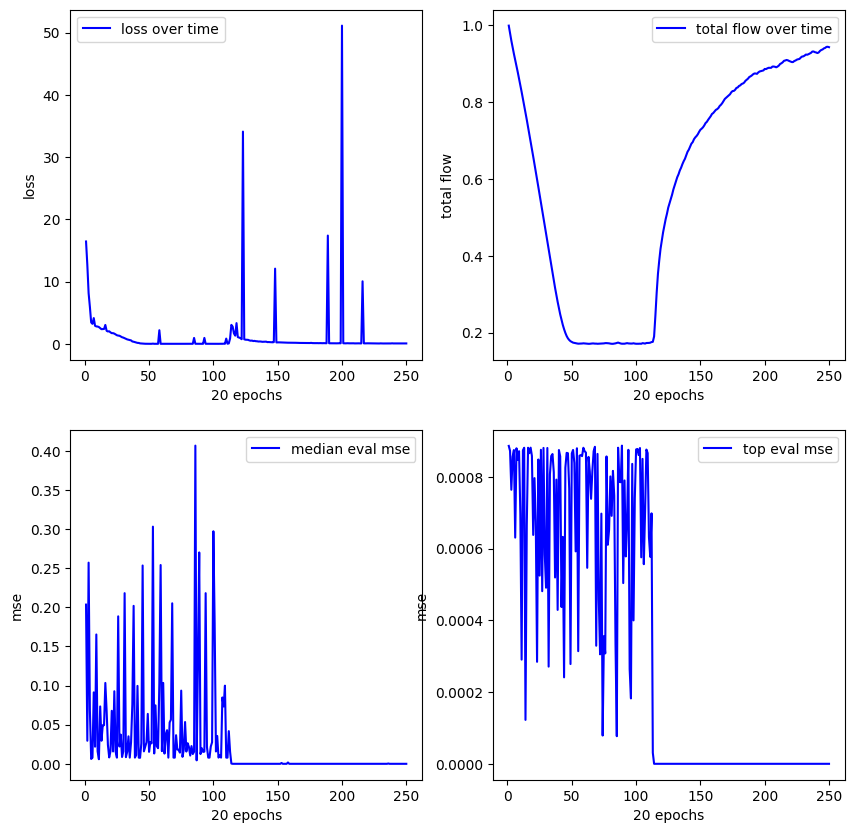

**************************************************
Experiment 16
training started with device cuda


14.466:   0%|          | 1/5000 [00:00<12:17,  6.78it/s]


new best reward (vanilla): 0.0140303373336792
mse (pre/post optimized): 0.0007214897777885199/0.0007206539157778025
square((x1) * (0.88))
expr: square(0.88*x1)

new best reward (vanilla): 0.8558993339538574
mse (pre/post optimized): 0.00010411641414975747/7.694312807871029e-05
(sin(x1)) * ((0.46) + (x1))
expr: (x1 + 0.46)*sin(x1)


2.950:   2%|▏         | 107/5000 [00:04<03:27, 23.58it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 5.625448193477978e-15/0.06987114995718002
((0.26) - (x1)) + ((x1) / (0.76))
expr: 0.315789473684211*x1 + 0.26


0.048: 100%|██████████| 5000/5000 [03:10<00:00, 26.28it/s] 


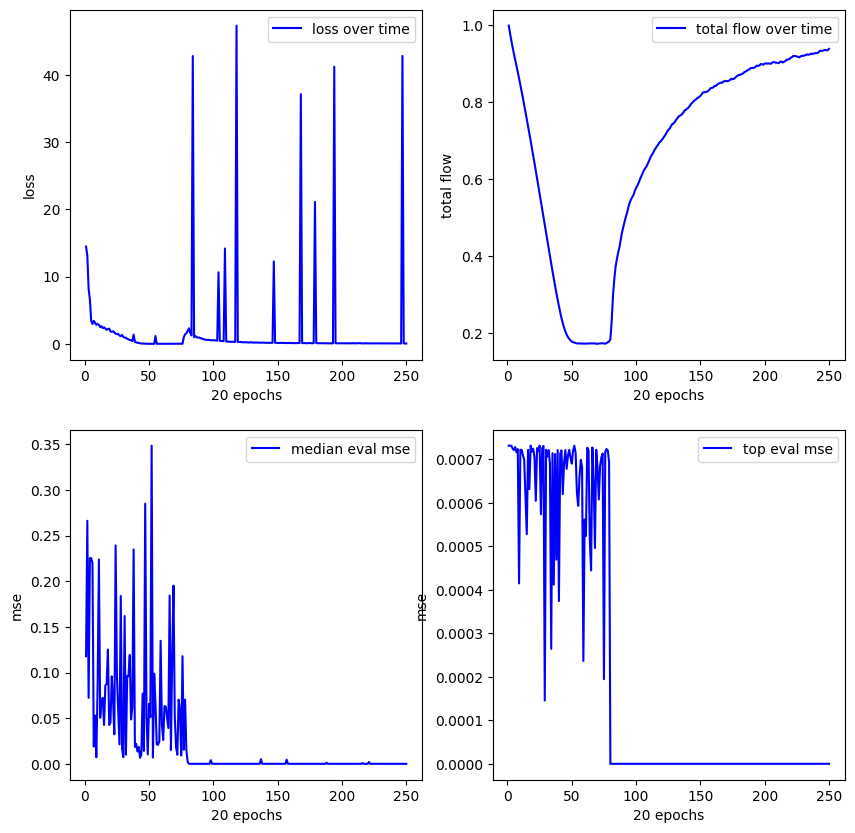

**************************************************
Experiment 17
training started with device cuda


16.850:   0%|          | 1/5000 [00:00<12:35,  6.62it/s]


new best reward (vanilla): 0.9557170867919922
mse (pre/post optimized): 3.204819586244412e-05/1.0420135367894545e-05
((x1) * (0.2)) + ((x1) * (0.35))
expr: 0.55*x1

new best reward (vanilla): 0.9704705476760864
mse (pre/post optimized): 2.9890859423176153e-06/0.00011071807966800407
((x1) + (x1)) * (0.34)
expr: 0.68*x1


4.749:   2%|▏         | 83/5000 [00:02<03:01, 27.05it/s] 


new best reward (vanilla): 1.0
mse (pre/post optimized): 1.598879739880286e-17/0.01011019665747881
((0.34) * (x1)) - (0.1)
expr: 0.34*x1 - 0.1


0.171: 100%|██████████| 5000/5000 [03:02<00:00, 27.45it/s] 


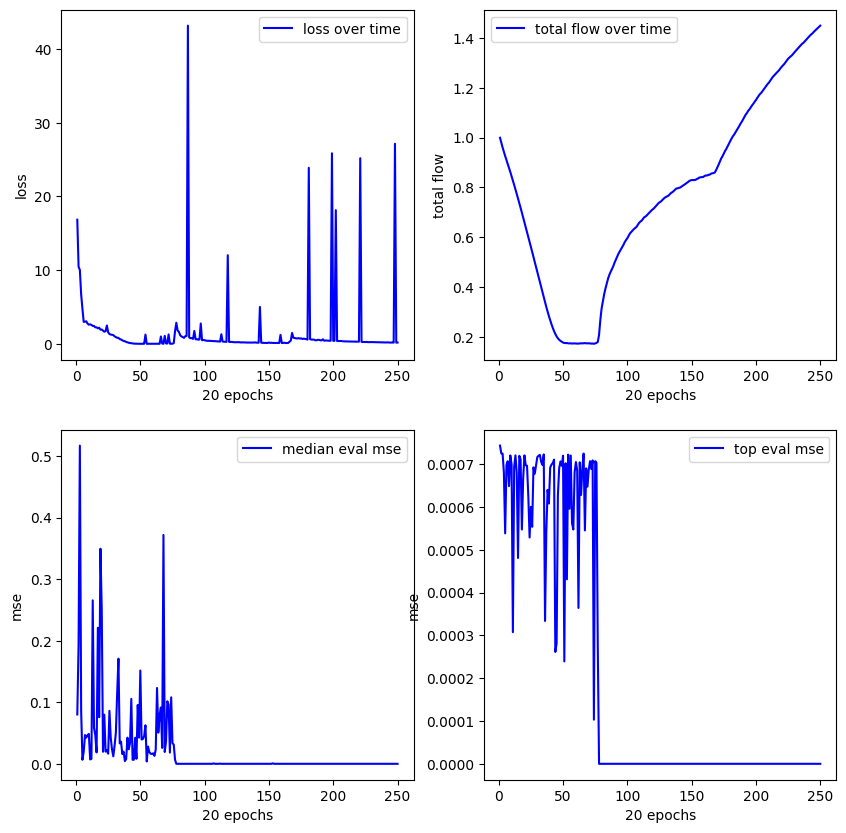

**************************************************
Experiment 18
training started with device cuda


13.879:   0%|          | 1/5000 [00:00<11:04,  7.52it/s]


new best reward (vanilla): 0.3537334203720093
mse (pre/post optimized): 0.0005004953127354383/8.877914865479397e-07
sin((x1) * (0.5))
expr: sin(0.5*x1)

new best reward (vanilla): 0.8845667243003845
mse (pre/post optimized): 6.093709816923365e-05/8.877914865479397e-07
sin((0.5) * (x1))
expr: sin(0.5*x1)


13.879:   0%|          | 14/5000 [00:00<03:13, 25.82it/s]


new best reward (vanilla): 0.9043877124786377
mse (pre/post optimized): 2.4729247343202587e-06/3.1482131817028858e-06
(x1) * (0.53)
expr: 0.53*x1


0.012:  65%|██████▍   | 3239/5000 [01:45<00:52, 33.62it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 1.3909806108170006e-18/0.0016112278681248426
((0.04) + (x1)) - ((x1) * (0.56))
expr: 0.44*x1 + 0.04


0.080: 100%|██████████| 5000/5000 [02:57<00:00, 28.18it/s] 


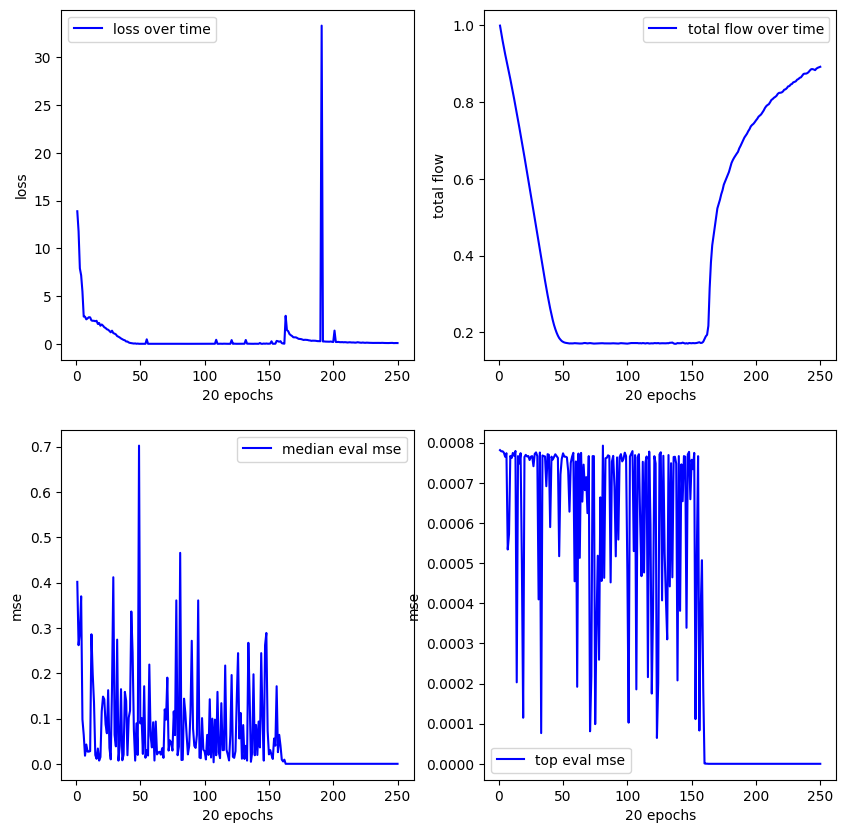

**************************************************
Experiment 19
training started with device cuda


18.496:   0%|          | 1/5000 [00:00<13:24,  6.21it/s]


new best reward (vanilla): 0.972845196723938
mse (pre/post optimized): 2.2759179046261124e-05/1.9772858649957925e-05
(sin(x1)) - ((x1) * (0.49))
expr: -0.49*x1 + sin(x1)


18.496:   0%|          | 6/5000 [00:00<05:13, 15.92it/s]


new best reward (vanilla): 0.9983618855476379
mse (pre/post optimized): 1.2568163754167472e-07/7.3844758086139e-10
(0.0) + ((0.5) * (x1))
expr: 0.5*x1


5.925:   1%|▏         | 66/5000 [00:02<03:28, 23.72it/s] 


new best reward (vanilla): 1.0
mse (pre/post optimized): 4.876741322208962e-18/0.044345203787088394
((x1) + (0.22)) - ((x1) * (0.47))
expr: 0.53*x1 + 0.22


0.044: 100%|██████████| 5000/5000 [03:10<00:00, 26.30it/s] 


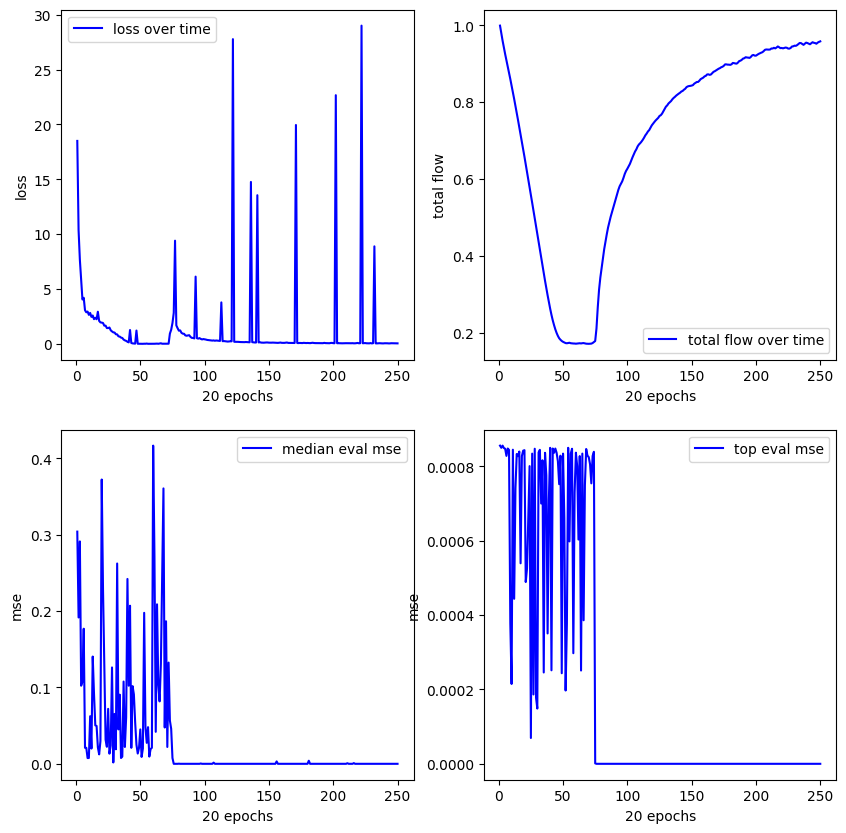

**************************************************
Experiment 20
training started with device cuda


16.317:   0%|          | 1/5000 [00:00<08:37,  9.65it/s]


new best reward (vanilla): 0.9558762907981873
mse (pre/post optimized): 4.077086123288609e-05/5.559927103604423e-06
(0.5) * (sin(x1))
expr: 0.5*sin(x1)


6.324:   1%|          | 61/5000 [00:02<04:11, 19.64it/s] 


new best reward (vanilla): 0.9999399185180664
mse (pre/post optimized): 1.6234613653409724e-10/7.430919595208252e-07
((x1) - (0.0)) - ((0.49) * (x1))
expr: 0.51*x1


2.287:  31%|███       | 1529/5000 [00:50<02:16, 25.46it/s]


new best reward (vanilla): 1.0
mse (pre/post optimized): 0.0/0.06312942504882812
(0.25) + ((x1) * (0.31))
expr: 0.31*x1 + 0.25


0.248: 100%|██████████| 5000/5000 [03:02<00:00, 27.37it/s] 


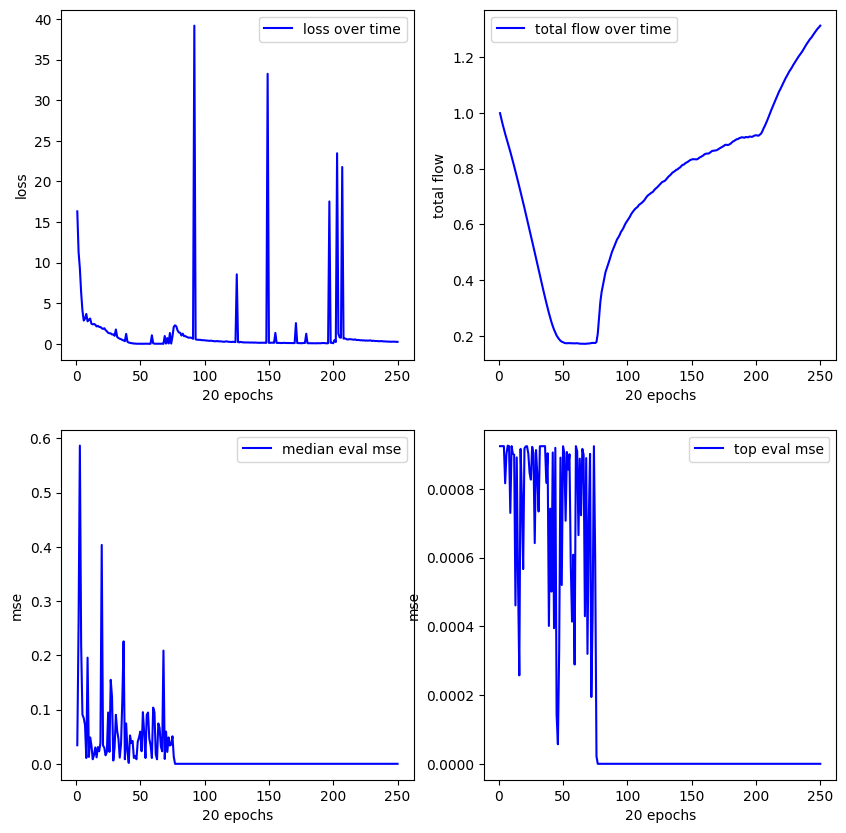

--------------------------------------------------
FUNCTION x**2 - 4x + 3 Interval considered: [0, 1]
**************************************************
Experiment 1
training started with device cuda


15.939:   0%|          | 0/5000 [00:00<?, ?it/s]


new best reward (vanilla): 0.400254487991333
mse (pre/post optimized): 0.4271280765533447/0.41585054993629456
sqrt((0.45) / (x1))
expr: 0.670820393249937*sqrt(1/x1)

new best reward (vanilla): 0.5903104543685913
mse (pre/post optimized): 0.1866682767868042/0.186668261885643
((0.62) * (x1)) - (log(x1))


15.939:   0%|          | 1/5000 [00:00<17:19,  4.81it/s]

expr: 0.62*x1 - log(x1)


0.000: 100%|██████████| 5000/5000 [02:41<00:00, 31.02it/s]


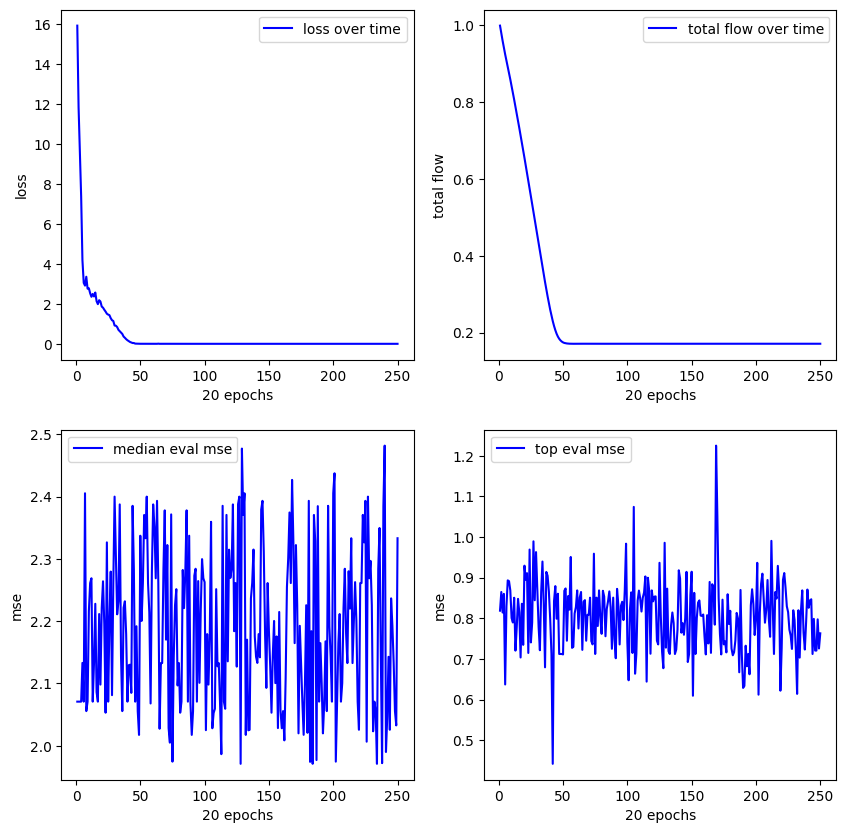

**************************************************
Experiment 2
training started with device cuda


15.558:   0%|          | 1/5000 [00:00<13:08,  6.34it/s]


new best reward (vanilla): 0.1393260359764099
mse (pre/post optimized): 0.5961963534355164/0.5961963534355164
(sqrt(x1)) / ((x1) + (x1))
expr: 1/(2*sqrt(x1))

new best reward (vanilla): 0.8376659154891968
mse (pre/post optimized): 0.09834972023963928/0.09834972023963928
(0.47) - (log(x1))
expr: 0.47 - log(x1)


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.19it/s]


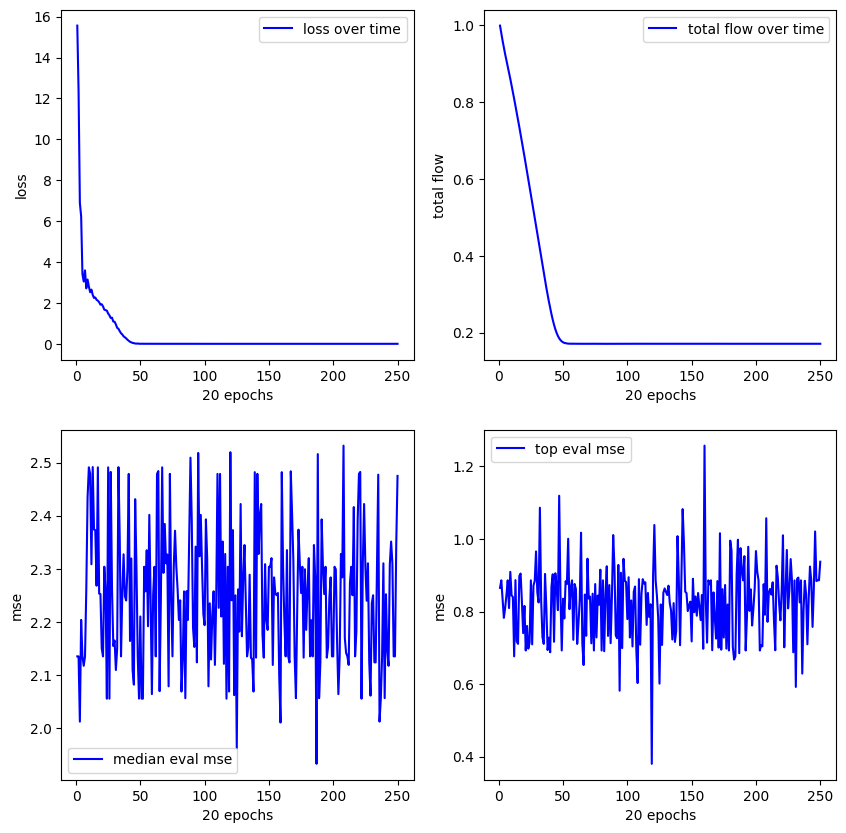

**************************************************
Experiment 3
training started with device cuda


14.628:   0%|          | 1/5000 [00:00<12:53,  6.46it/s]


new best reward (vanilla): 0.7093368768692017
mse (pre/post optimized): 0.21221226453781128/0.21221226453781128
exp((0.83) - (x1))
expr: 2.29331874026418*exp(-x1)


14.628:   0%|          | 14/5000 [00:00<04:45, 17.45it/s]


new best reward (vanilla): 0.8083025217056274
mse (pre/post optimized): 0.04069048538804054/0.04069048538804054
(cos(x1)) / ((x1) + (0.29))
expr: cos(x1)/(x1 + 0.29)


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.21it/s]


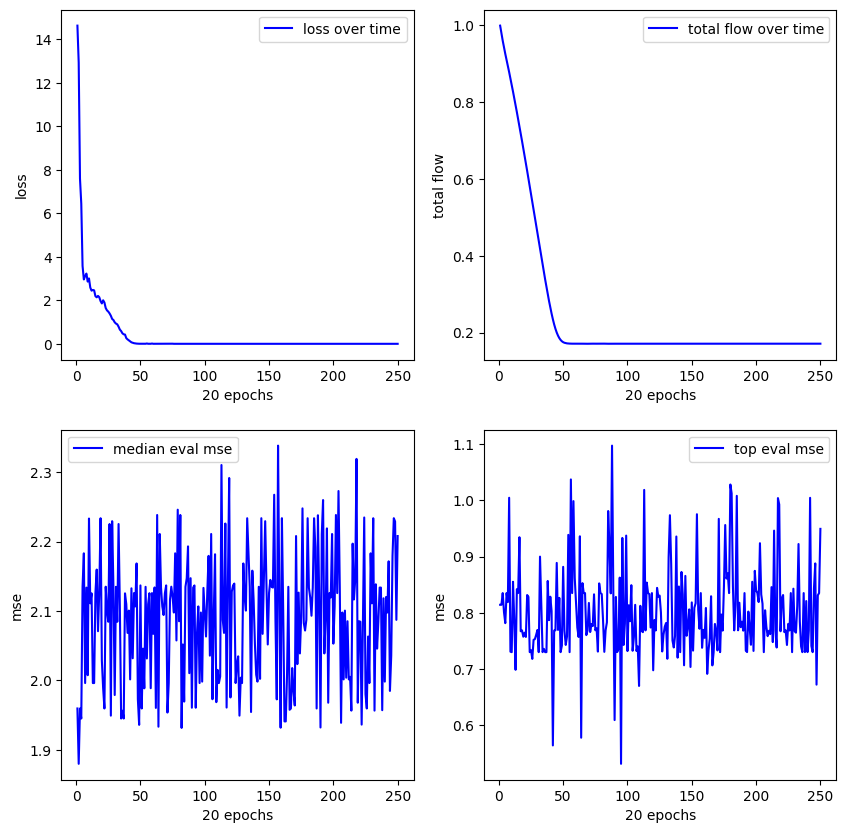

**************************************************
Experiment 4
training started with device cuda


13.618:   0%|          | 2/5000 [00:00<04:40, 17.80it/s]


new best reward (vanilla): 9.999999747378752e-05
mse (pre/post optimized): inf/nan
sqrt(log(x1))
expr: sqrt(log(x1))

new best reward (vanilla): 0.5272297859191895
mse (pre/post optimized): 0.3697544038295746/0.3697544038295746
(x1) - (log(x1))
expr: x1 - log(x1)


10.764:   0%|          | 22/5000 [00:01<05:59, 13.84it/s]


new best reward (vanilla): 0.9349716305732727
mse (pre/post optimized): 0.014504419639706612/1.5036802291870117
((0.69) - (x1)) / (0.87)
expr: 0.793103448275862 - 1.14942528735632*x1


0.000: 100%|██████████| 5000/5000 [02:42<00:00, 30.84it/s]


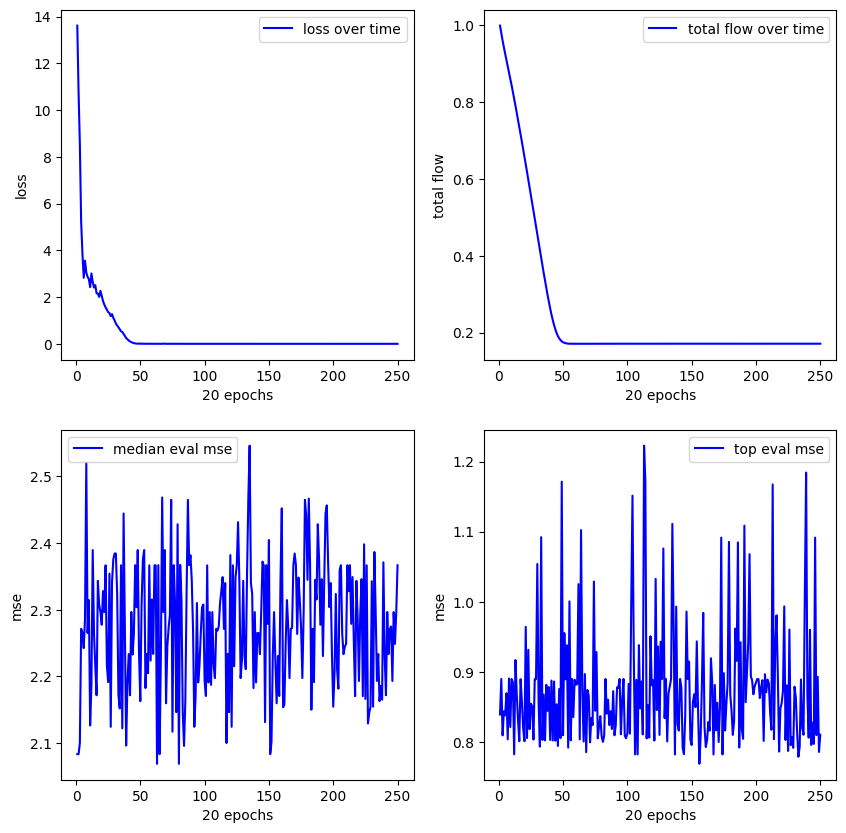

**************************************************
Experiment 5
training started with device cuda


15.706:   0%|          | 1/5000 [00:00<12:09,  6.85it/s]


new best reward (vanilla): 0.4689064025878906
mse (pre/post optimized): 0.43532347679138184/0.43532347679138184
(sin(x1)) - (log(x1))
expr: -log(x1) + sin(x1)


15.706:   0%|          | 4/5000 [00:00<08:12, 10.13it/s]


new best reward (vanilla): 0.47585660219192505
mse (pre/post optimized): 0.2483173906803131/0.23384974896907806
log((0.9) / (x1))
expr: log(0.9/x1)


15.706:   0%|          | 14/5000 [00:00<04:45, 17.49it/s]


new best reward (vanilla): 0.5017131567001343
mse (pre/post optimized): 0.1012524962425232/0.2189602106809616
(cos(x1)) / ((0.24) + (x1))
expr: cos(x1)/(x1 + 0.24)


0.000: 100%|██████████| 5000/5000 [02:42<00:00, 30.85it/s]


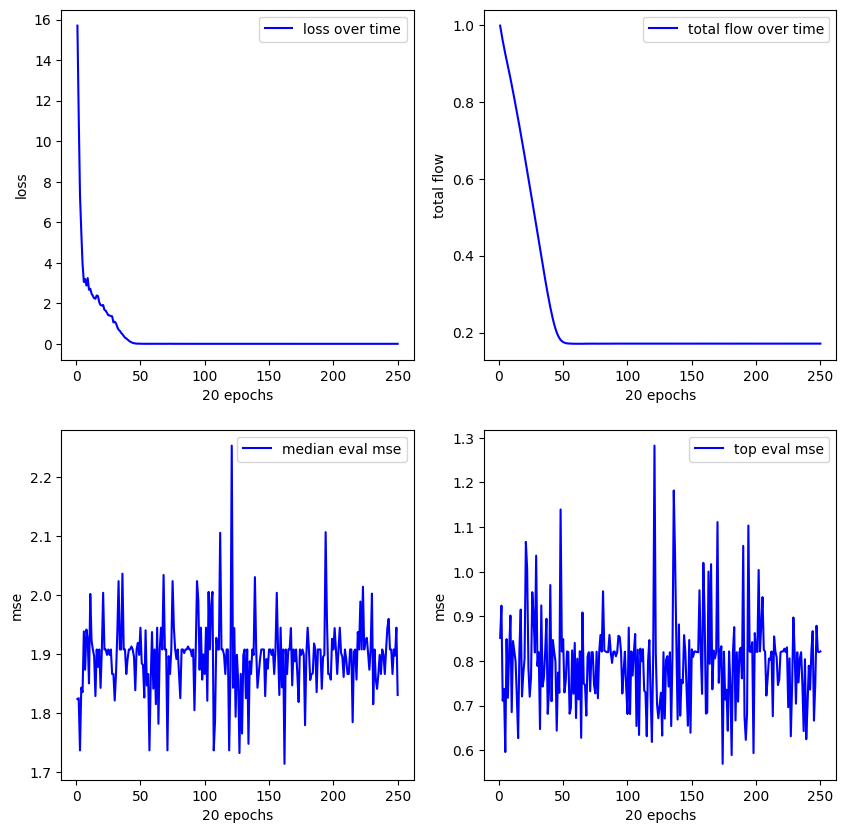

**************************************************
Experiment 6
training started with device cuda


15.951:   0%|          | 1/5000 [00:00<10:54,  7.64it/s]


new best reward (vanilla): 0.6947464942932129
mse (pre/post optimized): 0.21583637595176697/0.1943129003047943
exp((0.86) - (x1))
expr: 2.36316069370579*exp(-x1)


10.724:   1%|          | 32/5000 [00:01<04:16, 19.34it/s]


new best reward (vanilla): 0.7165275812149048
mse (pre/post optimized): 0.05101975053548813/0.05101975053548813
(cos(x1)) / ((0.29) + (x1))
expr: cos(x1)/(x1 + 0.29)


0.000: 100%|██████████| 5000/5000 [02:42<00:00, 30.84it/s]


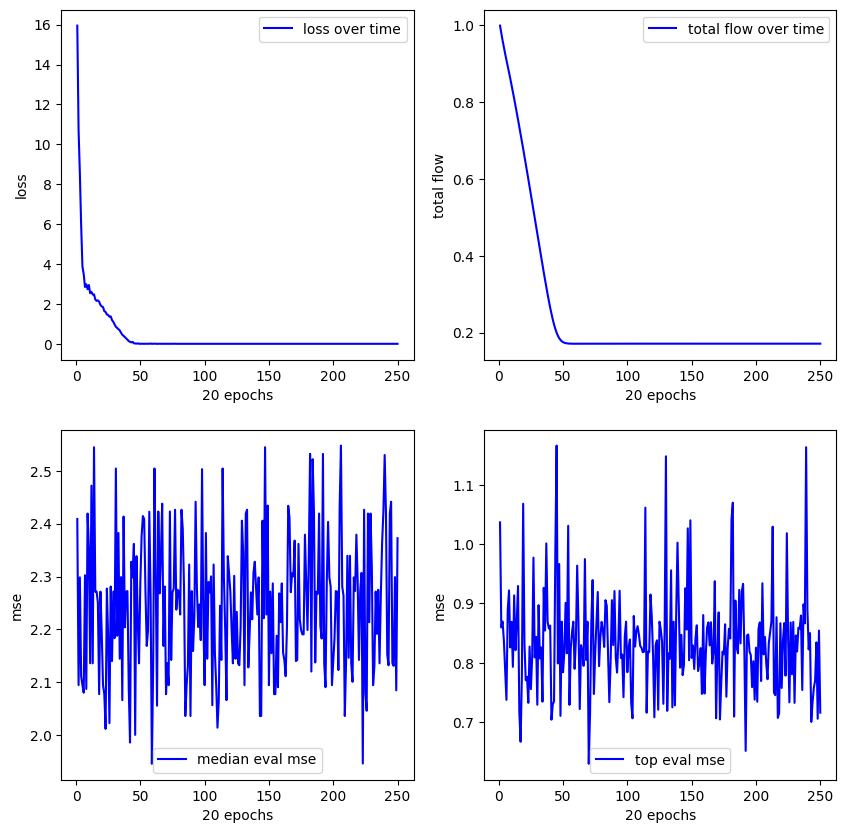

**************************************************
Experiment 7
training started with device cuda


13.808:   0%|          | 1/5000 [00:00<15:26,  5.39it/s]


new best reward (vanilla): 0.4390873908996582
mse (pre/post optimized): 0.4068361520767212/0.40683475136756897
sqrt((0.49) / (x1))
expr: 0.7*sqrt(1/x1)

new best reward (vanilla): 0.524787187576294
mse (pre/post optimized): 0.1948881298303604/2.136298179626465
square((x1) - (-0.41))
expr: square(x1 + 0.41)


13.325:   1%|          | 38/5000 [00:02<05:31, 14.97it/s]


new best reward (vanilla): 0.5584158897399902
mse (pre/post optimized): 0.050189677625894547/0.050189677625894547
(cos(x1)) / ((x1) + (0.26))
expr: cos(x1)/(x1 + 0.26)


8.478:   1%|          | 55/5000 [00:03<04:05, 20.13it/s] 


new best reward (vanilla): 0.84648597240448
mse (pre/post optimized): 0.0077145639806985855/0.015669479966163635
((0.91) - (x1)) / (0.31)
expr: 2.93548387096774 - 3.2258064516129*x1


0.000: 100%|██████████| 5000/5000 [02:39<00:00, 31.31it/s]


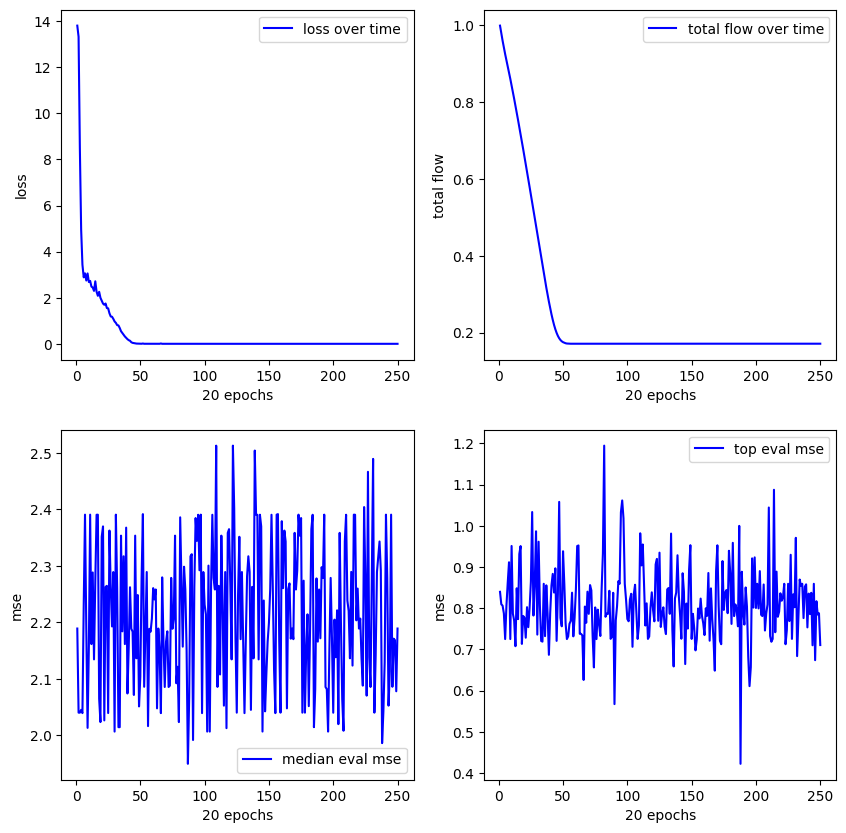

**************************************************
Experiment 8
training started with device cuda


10.579:   0%|          | 1/5000 [00:00<13:10,  6.33it/s]


new best reward (vanilla): 9.999999747378752e-05
mse (pre/post optimized): 1.7271212339401245/0.3723439872264862
(cos(x1)) * ((1.65) - (x1))
expr: (1.65 - x1)*cos(x1)

new best reward (vanilla): 0.6337718367576599
mse (pre/post optimized): 0.27524393796920776/0.04967863857746124
(cos(x1)) / ((0.28) + (x1))
expr: cos(x1)/(x1 + 0.28)


10.579:   0%|          | 16/5000 [00:01<08:09, 10.18it/s]


new best reward (vanilla): 0.9515174627304077
mse (pre/post optimized): 0.01140266377478838/0.02540029212832451
((0.89) - (x1)) / (0.29)
expr: 3.06896551724138 - 3.44827586206897*x1


0.000: 100%|██████████| 5000/5000 [02:39<00:00, 31.27it/s]


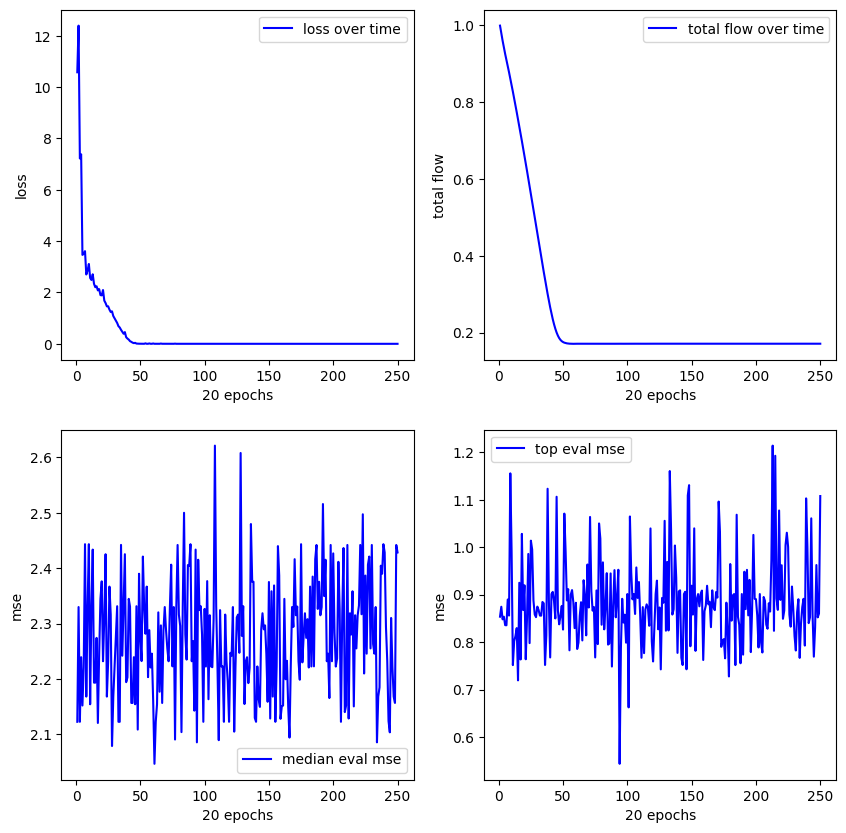

**************************************************
Experiment 9
training started with device cuda


11.295:   0%|          | 1/5000 [00:00<14:13,  5.86it/s]


new best reward (vanilla): 0.6836953163146973
mse (pre/post optimized): 0.24177740514278412/0.25459587574005127
exp((0.72) - (x1))
expr: 2.05443321064389*exp(-x1)


8.858:   1%|          | 57/5000 [00:02<04:07, 20.00it/s] 


new best reward (vanilla): 0.8690197467803955
mse (pre/post optimized): 0.006243543233722448/5.538130283355713
((0.49) - (x1)) / (0.1)
expr: 4.9 - 10.0*x1


0.000: 100%|██████████| 5000/5000 [02:37<00:00, 31.69it/s]


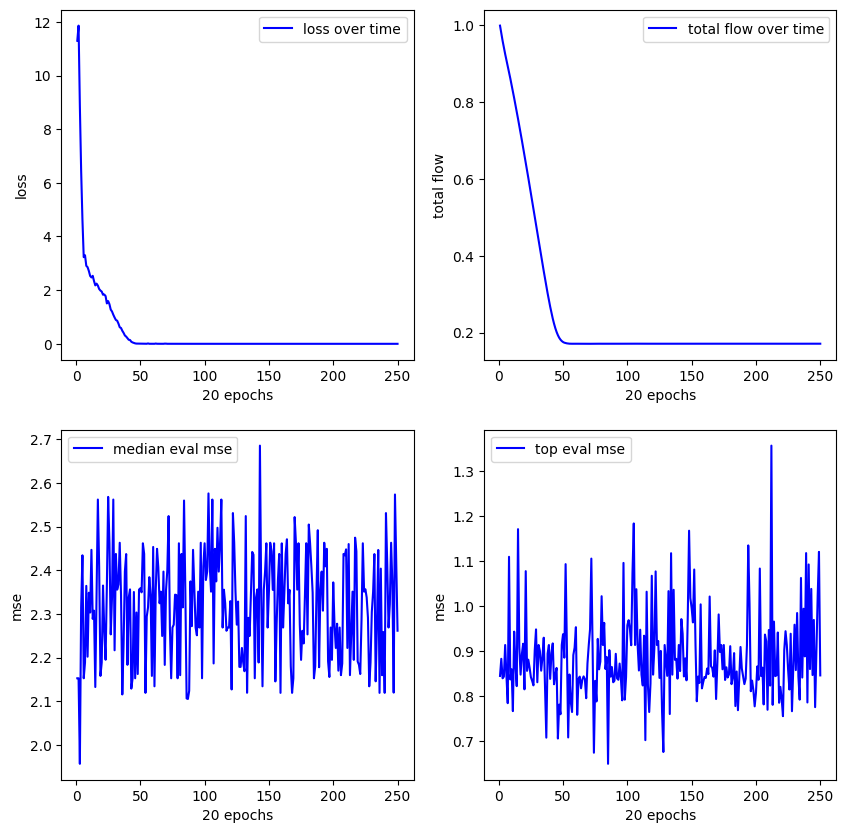

**************************************************
Experiment 10
training started with device cuda


13.293:   0%|          | 1/5000 [00:00<12:22,  6.73it/s]


new best reward (vanilla): 0.10462474822998047
mse (pre/post optimized): 0.6698336601257324/0.6669743061065674
cos((0.0) - (x1))
expr: cos(x1)

new best reward (vanilla): 0.589996337890625
mse (pre/post optimized): 0.2720516324043274/0.2720516324043274
(sin(x1)) - (log(x1))
expr: -log(x1) + sin(x1)


13.293:   0%|          | 18/5000 [00:01<04:03, 20.43it/s]


new best reward (vanilla): 0.7071555852890015
mse (pre/post optimized): 0.05928688123822212/0.6998347640037537
(cos(x1)) / ((0.15) + (x1))
expr: cos(x1)/(x1 + 0.15)


2.950:   3%|▎         | 142/5000 [00:06<03:08, 25.81it/s]


new best reward (vanilla): 0.8180463910102844
mse (pre/post optimized): 0.009575588628649712/0.028768397867679596
((1.04) - (x1)) / (0.4)
expr: 2.6 - 2.5*x1


0.000: 100%|██████████| 5000/5000 [02:41<00:00, 30.99it/s]


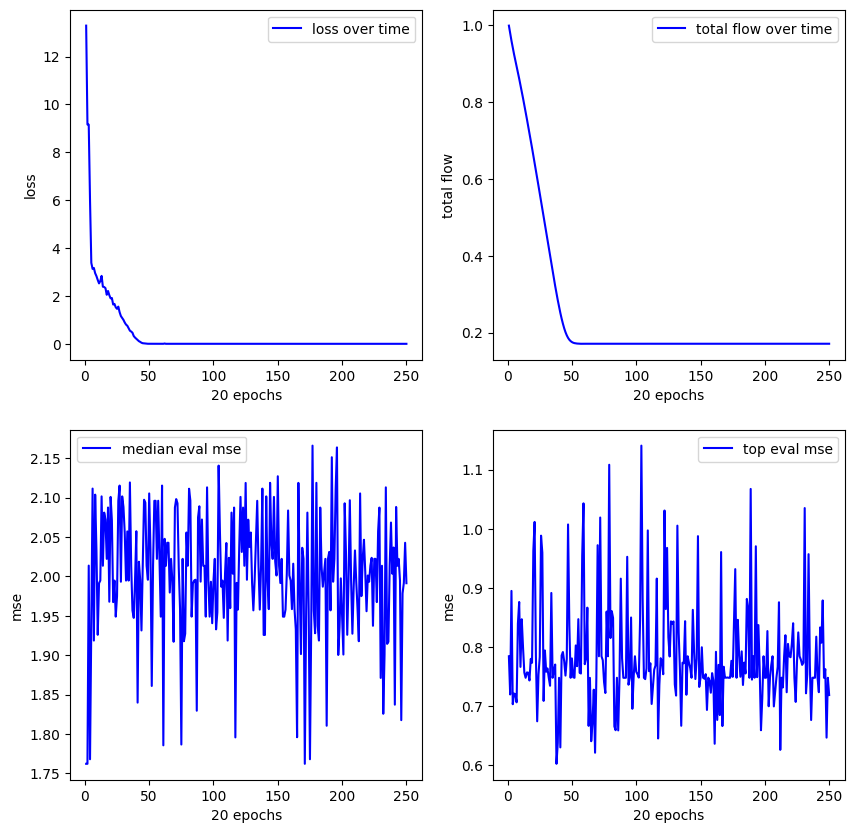

**************************************************
Experiment 11
training started with device cuda


12.977:   0%|          | 1/5000 [00:00<11:29,  7.25it/s]


new best reward (vanilla): 0.009616196155548096
mse (pre/post optimized): 0.7785294055938721/0.7776325941085815
cos((0.05) - (x1))
expr: cos(x1 - 0.05)

new best reward (vanilla): 0.015388786792755127
mse (pre/post optimized): 0.7672930359840393/0.7672930359840393
cos(square(x1))
expr: cos(square(x1))

new best reward (vanilla): 0.84824138879776
mse (pre/post optimized): 0.11662530899047852/0.23969195783138275
((1.2) - (x1)) + ((0.76) - (x1))
expr: 1.96 - 2*x1


0.000: 100%|██████████| 5000/5000 [02:39<00:00, 31.36it/s]


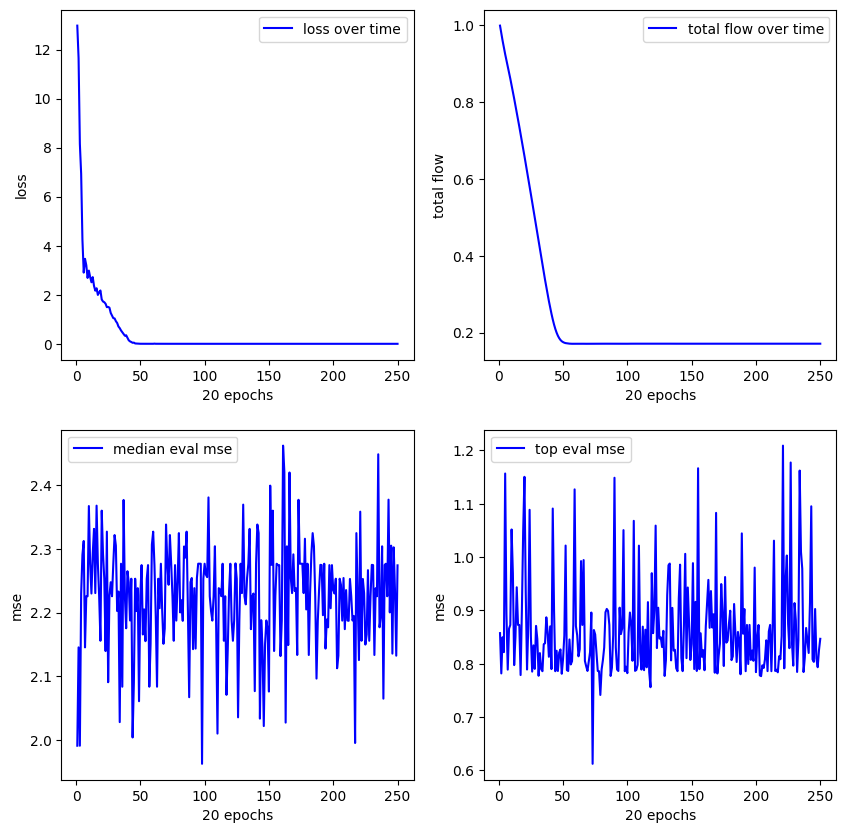

**************************************************
Experiment 12
training started with device cuda


13.570:   0%|          | 1/5000 [00:00<10:44,  7.76it/s]


new best reward (vanilla): 0.3223820924758911
mse (pre/post optimized): 0.6074485778808594/0.6074485778808594
(cos(x1)) + (cos(x1))
expr: 2*cos(x1)


13.570:   0%|          | 4/5000 [00:00<04:28, 18.62it/s]


new best reward (vanilla): 0.3472866415977478
mse (pre/post optimized): 0.3556283712387085/0.6216544508934021
log((0.71) / (x1))
expr: log(0.71/x1)


13.570:   0%|          | 16/5000 [00:01<05:54, 14.08it/s]


new best reward (vanilla): 0.8502820730209351
mse (pre/post optimized): 0.05327227711677551/0.05328020453453064
(cos(x1)) / ((x1) + (0.3))
expr: cos(x1)/(x1 + 0.3)


0.000: 100%|██████████| 5000/5000 [02:38<00:00, 31.53it/s]


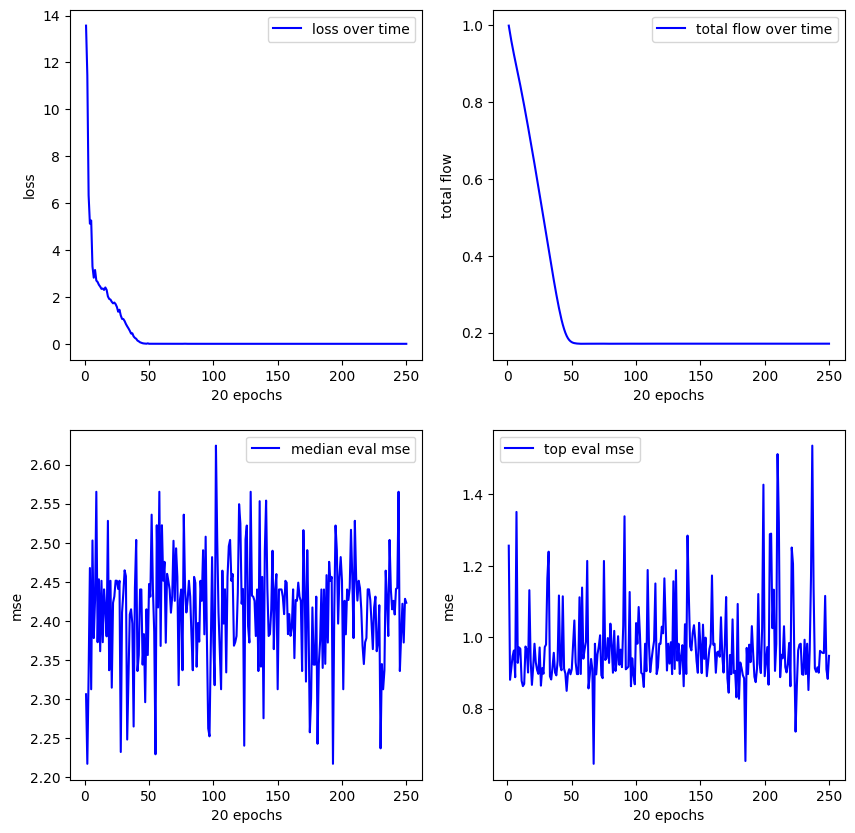

**************************************************
Experiment 13
training started with device cuda


15.125:   0%|          | 1/5000 [00:00<13:34,  6.14it/s]


new best reward (vanilla): 0.6772758960723877
mse (pre/post optimized): 0.22819913923740387/0.20132800936698914
exp((0.84) - (x1))
expr: 2.31636697678109*exp(-x1)


13.033:   0%|          | 22/5000 [00:01<04:38, 17.87it/s]


new best reward (vanilla): 0.7566667795181274
mse (pre/post optimized): 0.012696969322860241/0.029255293309688568
((1.04) - (x1)) / (0.4)
expr: 2.6 - 2.5*x1


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.23it/s]


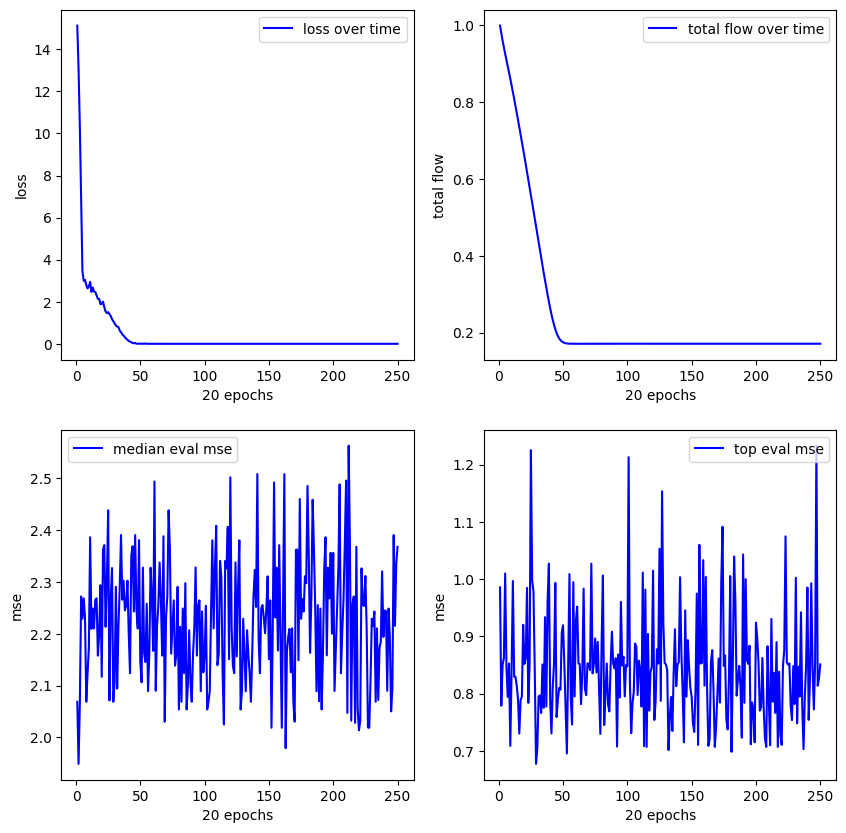

**************************************************
Experiment 14
training started with device cuda


13.407:   0%|          | 1/5000 [00:00<11:15,  7.40it/s]


new best reward (vanilla): 0.7017040252685547
mse (pre/post optimized): 0.22318144142627716/0.23862572014331818
((x1) + (0.05)) - (log(x1))
expr: x1 - log(x1) + 0.05


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.15it/s]


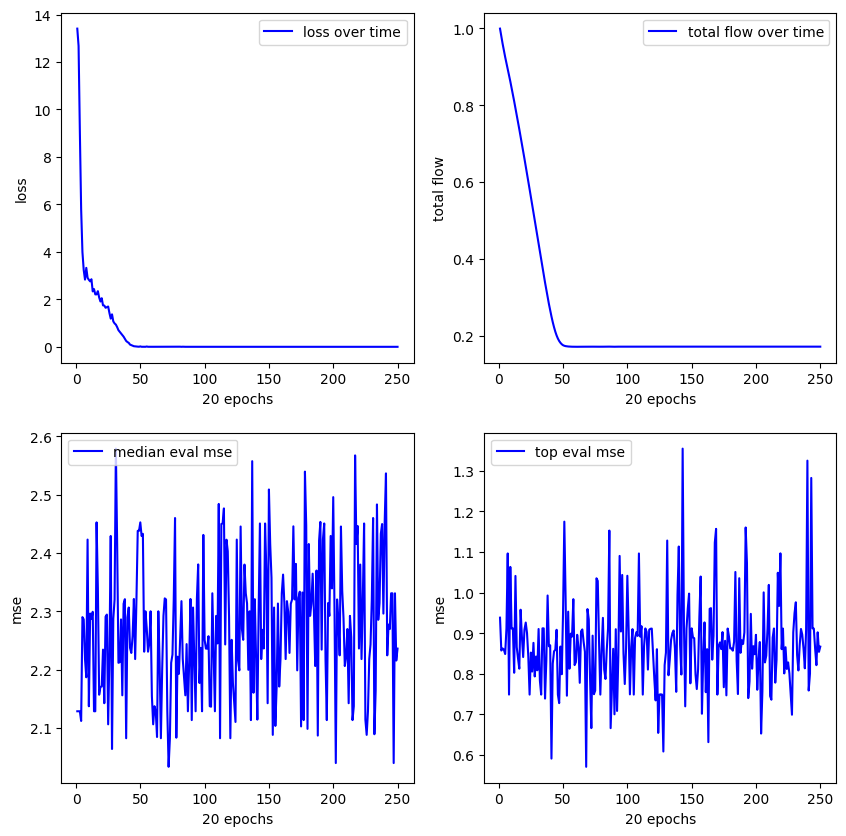

**************************************************
Experiment 15
training started with device cuda


11.831:   0%|          | 1/5000 [00:00<16:21,  5.09it/s]


new best reward (vanilla): 0.13520491123199463
mse (pre/post optimized): 0.6639295220375061/0.6639295220375061
cos(sqrt(x1))
expr: cos(sqrt(x1))

new best reward (vanilla): 0.5885817408561707
mse (pre/post optimized): 0.27742329239845276/0.27742329239845276
exp((0.72) - (x1))
expr: 2.05443321064389*exp(-x1)


13.554:   0%|          | 21/5000 [00:01<05:35, 14.86it/s]


new best reward (vanilla): 0.6413516998291016
mse (pre/post optimized): 0.06509306281805038/0.06509307026863098
(cos(x1)) / ((0.31) + (x1))
expr: cos(x1)/(x1 + 0.31)


6.416:   2%|▏         | 79/5000 [00:04<03:41, 22.17it/s] 


new best reward (vanilla): 0.9101298451423645
mse (pre/post optimized): 0.00586039200425148/0.04923345148563385
((0.82) - (x1)) / (0.29)
expr: 2.82758620689655 - 3.44827586206897*x1


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.23it/s]


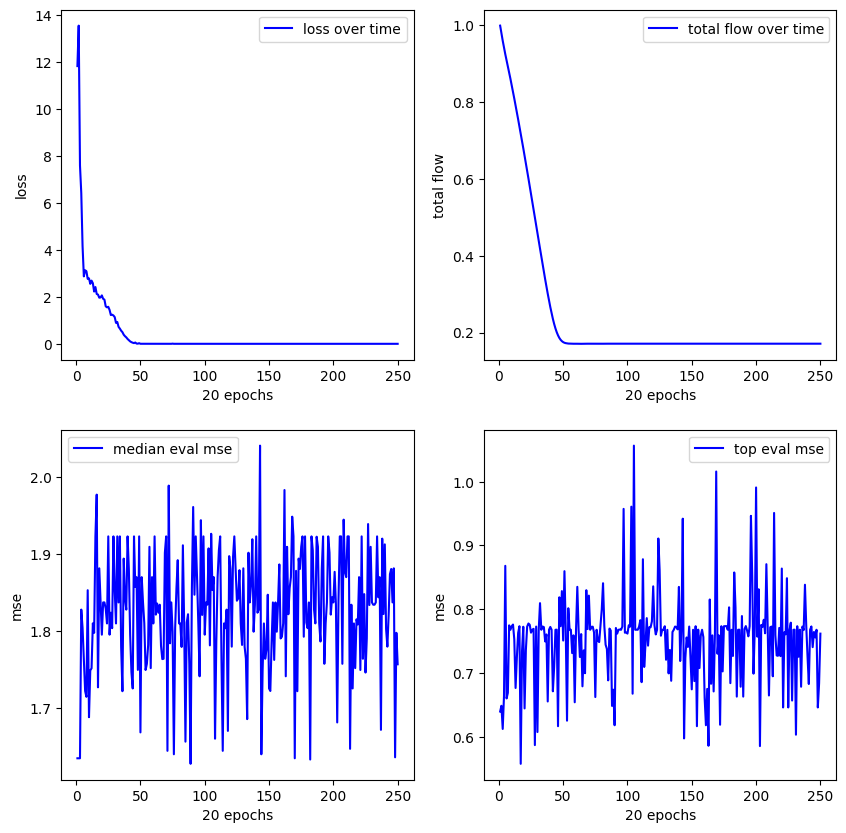

**************************************************
Experiment 16
training started with device cuda


14.061:   0%|          | 1/5000 [00:00<14:04,  5.92it/s]


new best reward (vanilla): 0.5613220930099487
mse (pre/post optimized): 0.3221510946750641/0.3217683732509613
sqrt((0.37) / (x1))
expr: 0.608276253029822*sqrt(1/x1)


14.061:   0%|          | 6/5000 [00:00<06:50, 12.17it/s]


new best reward (vanilla): 0.6518371105194092
mse (pre/post optimized): 0.08070363104343414/1.9080798625946045
square((x1) - (-0.27))
expr: square(x1 + 0.27)


0.000: 100%|██████████| 5000/5000 [02:39<00:00, 31.30it/s]


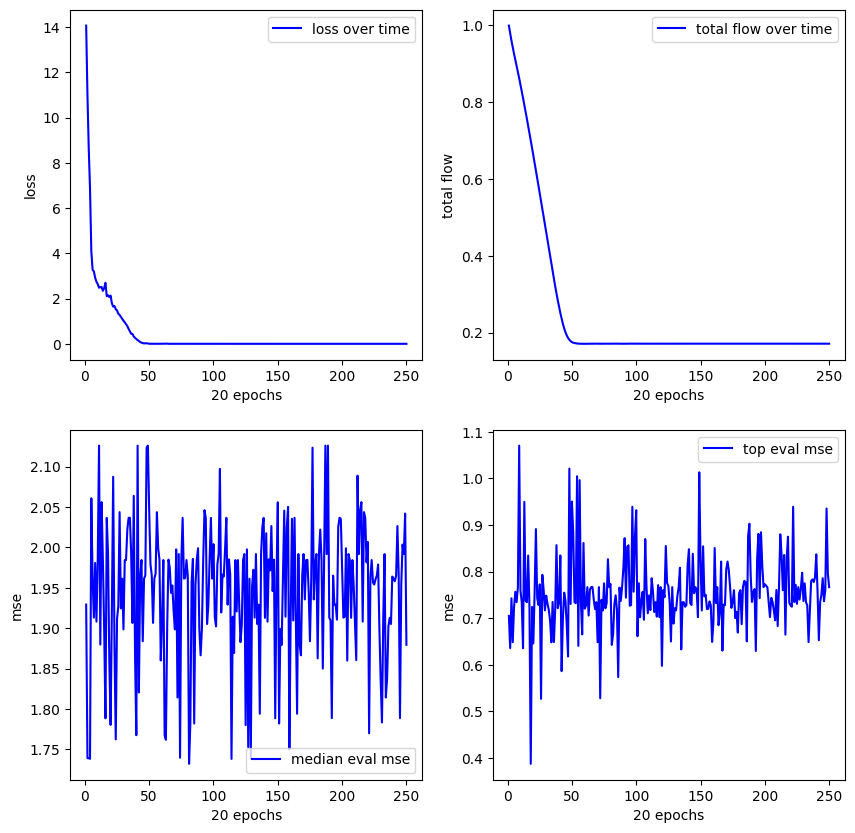

**************************************************
Experiment 17
training started with device cuda


15.466:   0%|          | 0/5000 [00:00<?, ?it/s]


new best reward (vanilla): 0.6415209770202637
mse (pre/post optimized): 0.23914659023284912/0.051740746945142746
square((x1) - (1.6))
expr: square(x1 - 1.6)


13.890:   1%|          | 28/5000 [00:01<04:15, 19.46it/s]


new best reward (vanilla): 0.9393582344055176
mse (pre/post optimized): 0.006779535207897425/0.013570968993008137
((0.9) - (x1)) / (0.31)
expr: 2.90322580645161 - 3.2258064516129*x1


0.000: 100%|██████████| 5000/5000 [02:41<00:00, 30.92it/s]


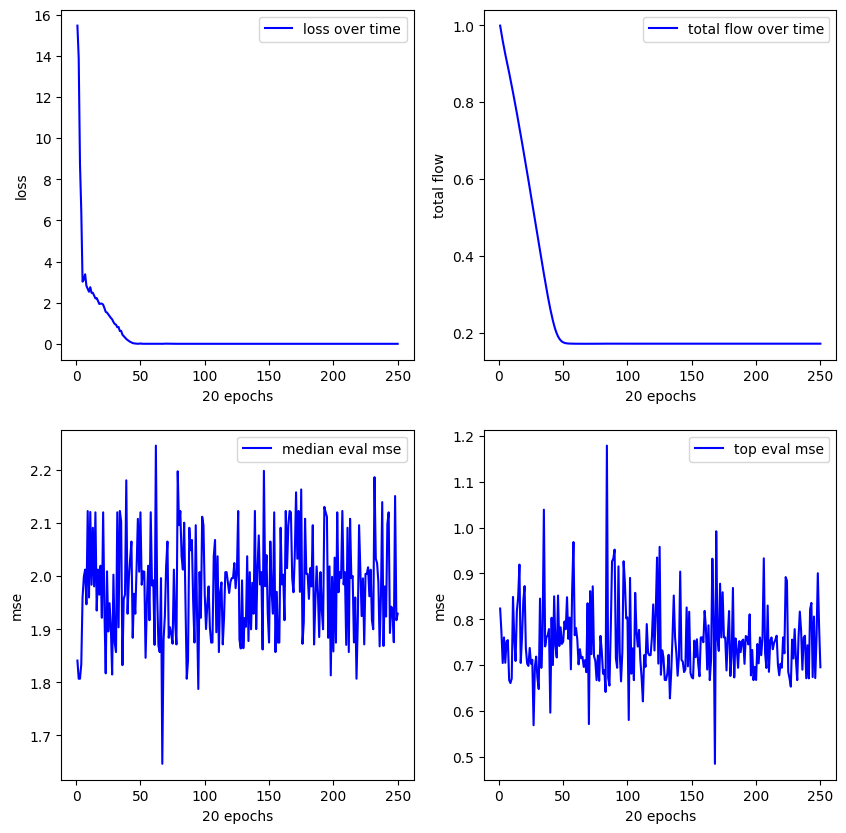

**************************************************
Experiment 18
training started with device cuda


15.876:   0%|          | 2/5000 [00:00<07:08, 11.66it/s]


new best reward (vanilla): 0.22962039709091187
mse (pre/post optimized): 0.5931806564331055/0.5931806564331055
(sqrt(x1)) - (log(x1))
expr: sqrt(x1) - log(x1)

new best reward (vanilla): 0.7908846735954285
mse (pre/post optimized): 0.12774039804935455/0.07354988902807236
square((1.53) - (x1))
expr: square(1.53 - x1)


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.22it/s]


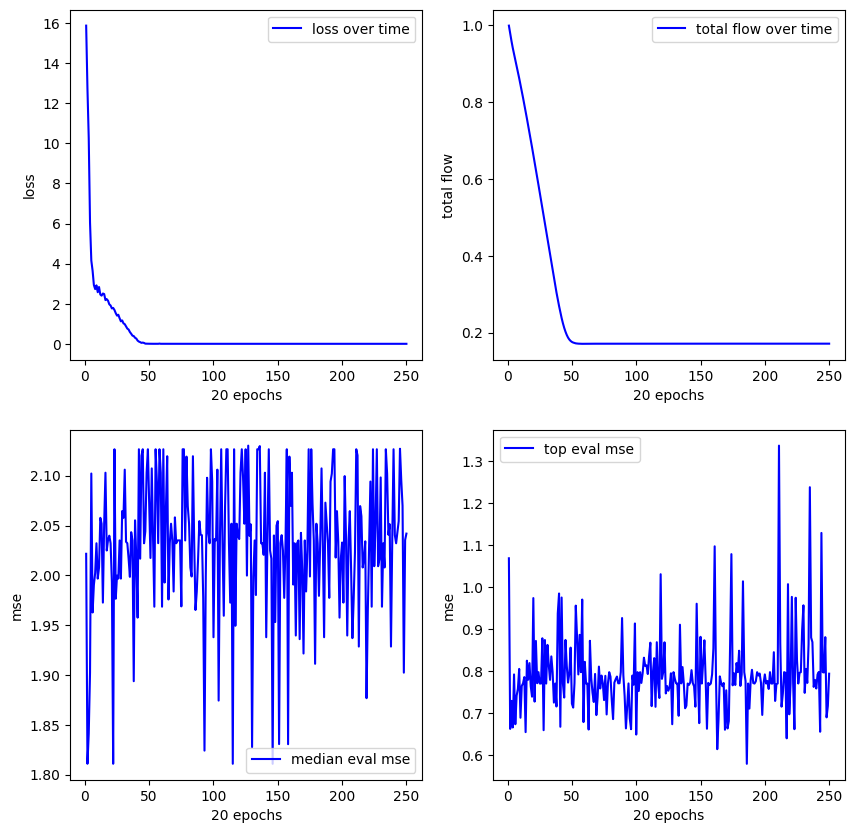

**************************************************
Experiment 19
training started with device cuda


16.645:   0%|          | 1/5000 [00:00<10:48,  7.71it/s]


new best reward (vanilla): 9.999999747378752e-05
mse (pre/post optimized): 1.3362419605255127/1.3362419605255127
sin(cos(x1))
expr: sin(cos(x1))

new best reward (vanilla): 0.570449948310852
mse (pre/post optimized): 0.3610784113407135/0.19250425696372986
exp((0.96) - (x1))
expr: 2.61169647342312*exp(-x1)


16.645:   0%|          | 7/5000 [00:00<04:37, 17.96it/s]


new best reward (vanilla): 0.727940559387207
mse (pre/post optimized): 0.0995393767952919/1.364233136177063
((0.66) - (x1)) / (0.43)
expr: 1.53488372093023 - 2.32558139534884*x1


0.000: 100%|██████████| 5000/5000 [02:41<00:00, 31.06it/s]


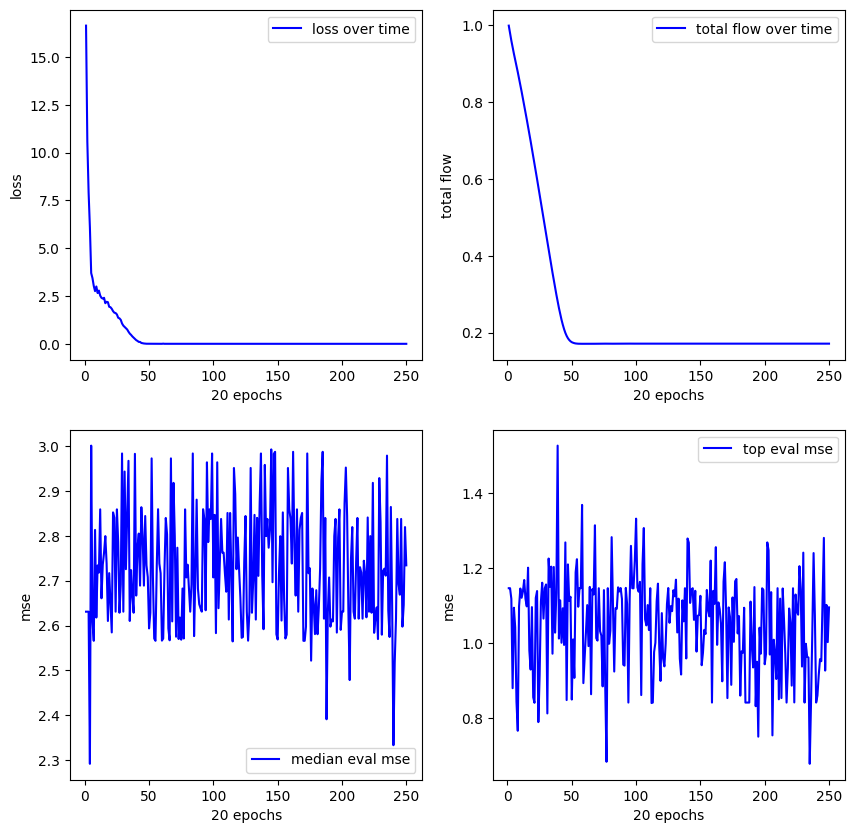

**************************************************
Experiment 20
training started with device cuda


12.670:   0%|          | 1/5000 [00:00<11:07,  7.49it/s]


new best reward (vanilla): 0.6207523941993713
mse (pre/post optimized): 0.2701253890991211/0.203264057636261
exp((0.85) - (x1))
expr: 2.33964685192599*exp(-x1)


0.000: 100%|██████████| 5000/5000 [02:41<00:00, 31.00it/s]


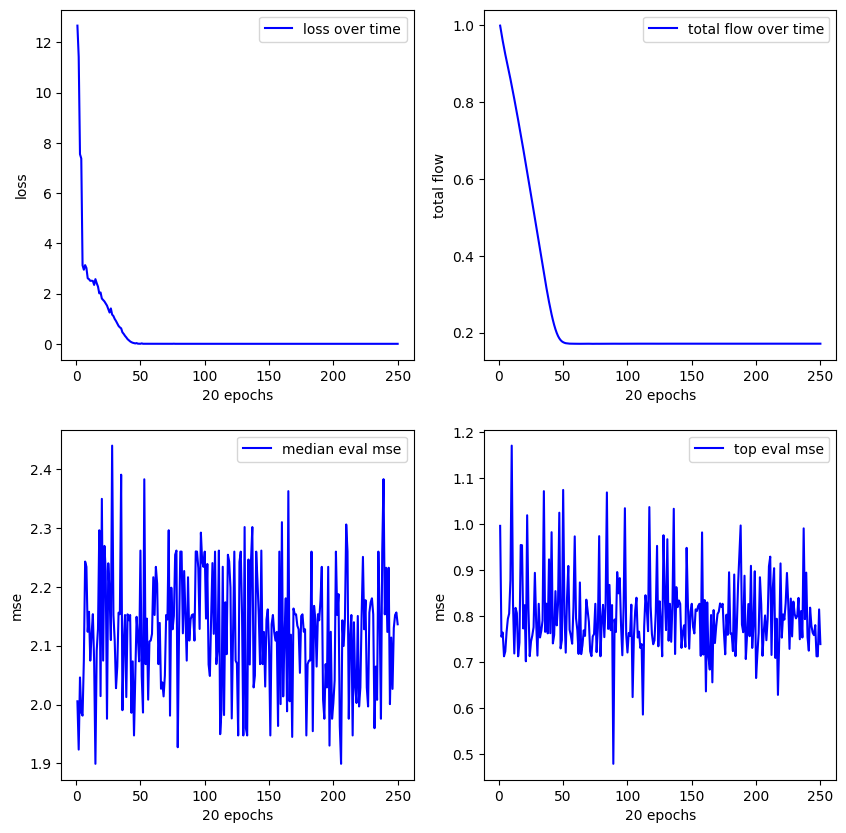

--------------------------------------------------
FUNCTION 4(1 - sqrt(x)) Interval considered: [0, 1]
**************************************************
Experiment 1
training started with device cuda


15.329:   0%|          | 1/5000 [00:00<13:58,  5.96it/s]


new best reward (vanilla): 0.41819465160369873
mse (pre/post optimized): 0.4660662114620209/0.2814599871635437
exp((0.81) - (x1))
expr: 2.24790798667647*exp(-x1)

new best reward (vanilla): 0.6706002950668335
mse (pre/post optimized): 0.1645570695400238/0.1645987331867218
((0.42) * (x1)) - (log(x1))
expr: 0.42*x1 - log(x1)


11.022:   1%|          | 35/5000 [00:02<04:32, 18.23it/s]


new best reward (vanilla): 0.7401732206344604
mse (pre/post optimized): 0.03258867934346199/0.03258867934346199
(cos(x1)) / ((x1) + (0.26))
expr: cos(x1)/(x1 + 0.26)


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.06it/s]


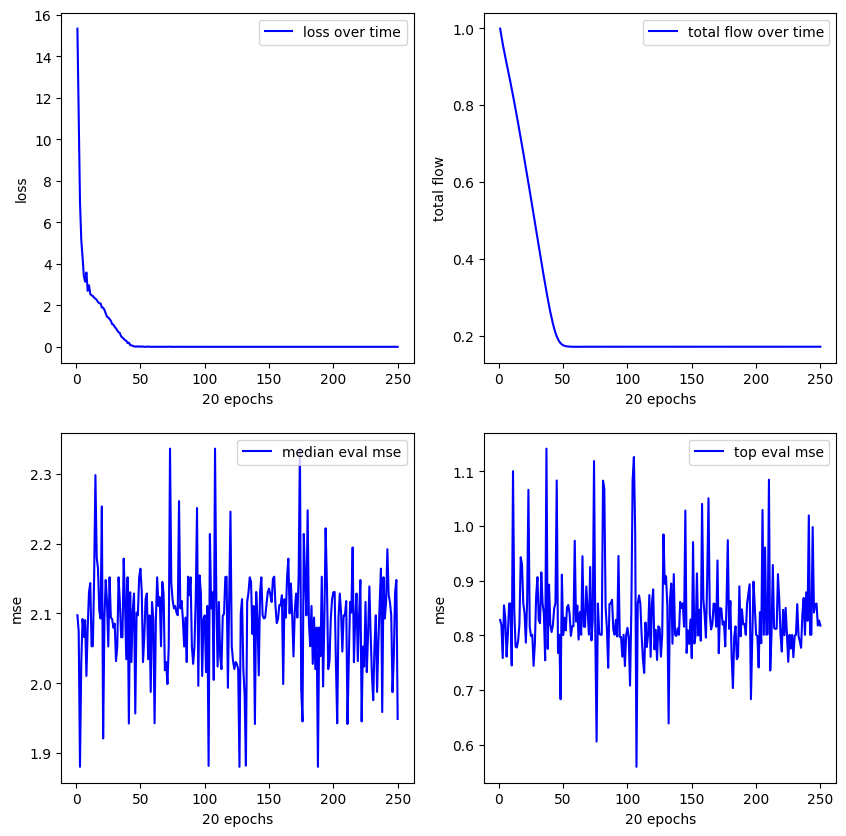

**************************************************
Experiment 2
training started with device cuda


16.258:   0%|          | 1/5000 [00:00<10:15,  8.13it/s]


new best reward (vanilla): 0.9195759296417236
mse (pre/post optimized): 0.06262262910604477/0.17640316486358643
log((0.99) / (x1))
expr: log(0.99/x1)


0.000: 100%|██████████| 5000/5000 [02:37<00:00, 31.69it/s]


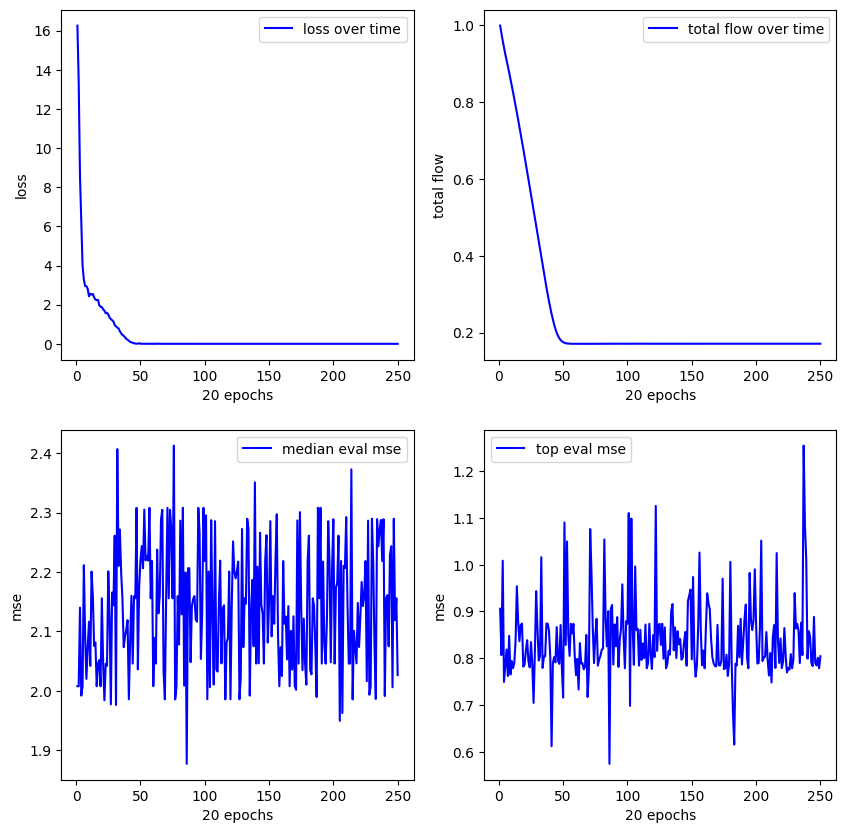

**************************************************
Experiment 3
training started with device cuda


15.107:   0%|          | 1/5000 [00:00<14:22,  5.79it/s]


new best reward (vanilla): 0.001844167709350586
mse (pre/post optimized): 0.8533920049667358/0.8533920049667358
sqrt(cos(x1))
expr: sqrt(cos(x1))

new best reward (vanilla): 0.5415207147598267
mse (pre/post optimized): 0.39133480191230774/0.39074015617370605
sqrt((0.38) / (x1))
expr: 0.616441400296898*sqrt(1/x1)


15.107:   0%|          | 4/5000 [00:00<09:05,  9.15it/s]


new best reward (vanilla): 0.7295341491699219
mse (pre/post optimized): 0.10709282755851746/2.1113154888153076
square((x1) - (-0.33))
expr: square(x1 + 0.33)


15.107:   0%|          | 7/5000 [00:00<08:07, 10.24it/s]


new best reward (vanilla): 0.7622975707054138
mse (pre/post optimized): 0.03232259675860405/0.03232259675860405
(cos(x1)) / ((0.27) + (x1))
expr: cos(x1)/(x1 + 0.27)


0.000: 100%|██████████| 5000/5000 [02:38<00:00, 31.61it/s]


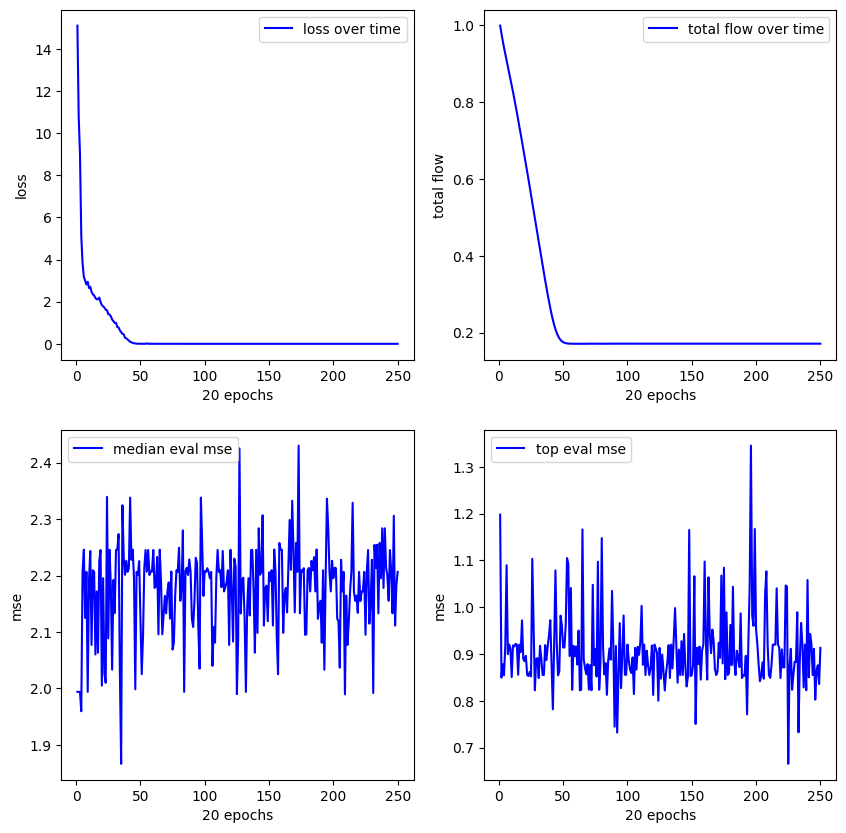

**************************************************
Experiment 4
training started with device cuda


12.654:   0%|          | 1/5000 [00:00<11:50,  7.03it/s]


new best reward (vanilla): 0.023527443408966064
mse (pre/post optimized): 0.8690714836120605/0.8690714836120605
cos(x1)
expr: cos(x1)

new best reward (vanilla): 0.5020725727081299
mse (pre/post optimized): 0.4337771534919739/0.3147728741168976
sqrt((0.37) / (x1))
expr: 0.608276253029822*sqrt(1/x1)


12.654:   0%|          | 6/5000 [00:00<05:10, 16.09it/s]


new best reward (vanilla): 0.7577509880065918
mse (pre/post optimized): 0.10614165663719177/0.08690560609102249
log((1.18) / (x1))
expr: log(1.18/x1)


0.000: 100%|██████████| 5000/5000 [02:38<00:00, 31.63it/s]


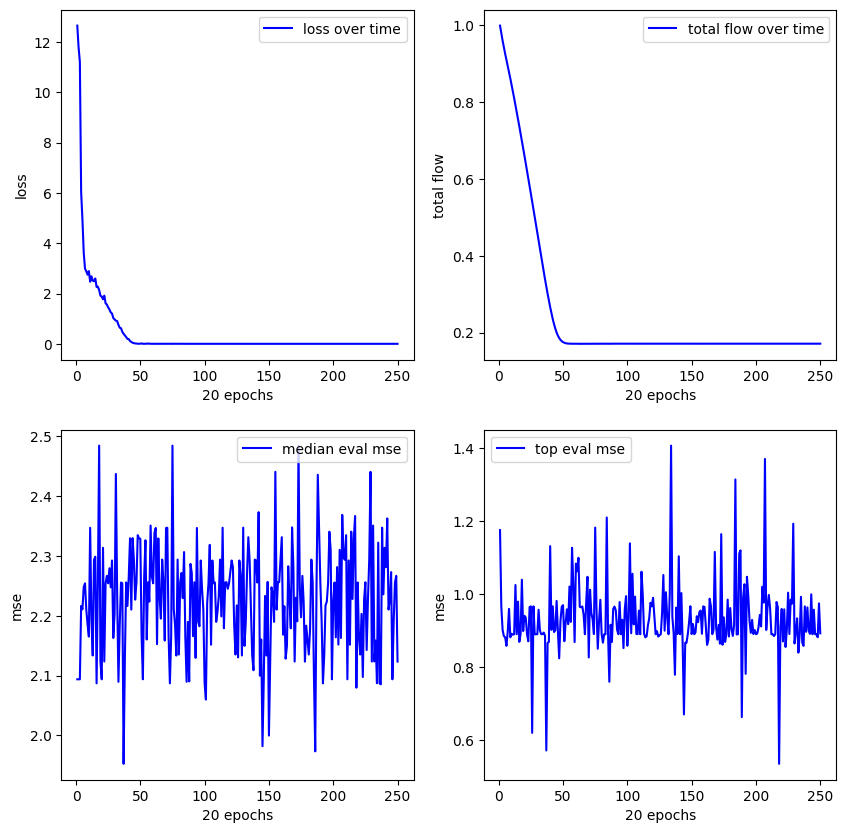

**************************************************
Experiment 5
training started with device cuda


17.361:   0%|          | 1/5000 [00:00<14:37,  5.69it/s]


new best reward (vanilla): 0.7935216426849365
mse (pre/post optimized): 0.17254598438739777/2.195072889328003
square((-0.36) - (x1))
expr: square(-x1 - 0.36)


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.19it/s]


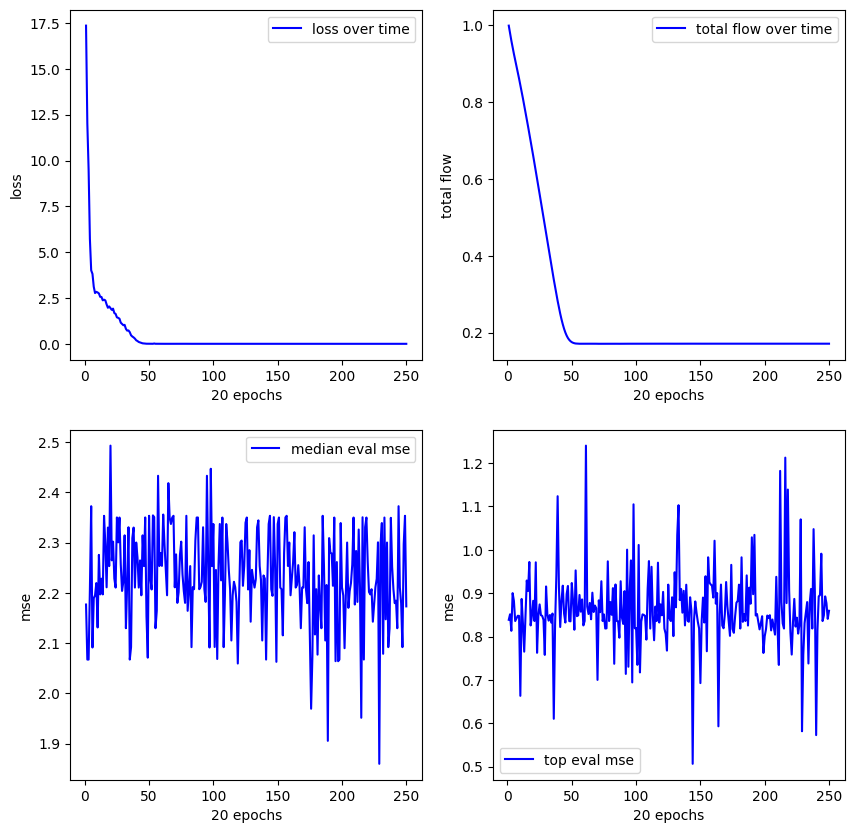

**************************************************
Experiment 6
training started with device cuda


13.053:   0%|          | 1/5000 [00:00<13:48,  6.03it/s]


new best reward (vanilla): 0.7492161989212036
mse (pre/post optimized): 0.20859259366989136/0.20857632160186768
sqrt((0.52) / (x1))
expr: 0.721110255092798*sqrt(1/x1)


0.000: 100%|██████████| 5000/5000 [02:38<00:00, 31.52it/s]


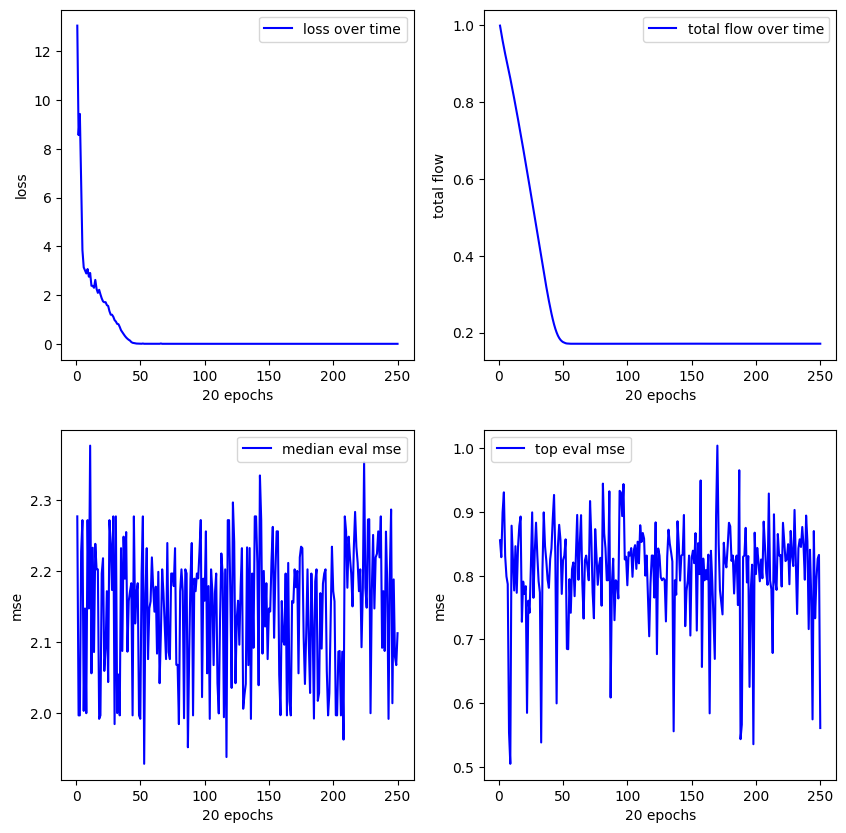

**************************************************
Experiment 7
training started with device cuda


14.578:   0%|          | 1/5000 [00:00<13:34,  6.14it/s]


new best reward (vanilla): 0.890548825263977
mse (pre/post optimized): 0.09699280560016632/0.09699279814958572
(0.39) - (log(x1))
expr: 0.39 - log(x1)


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.25it/s]


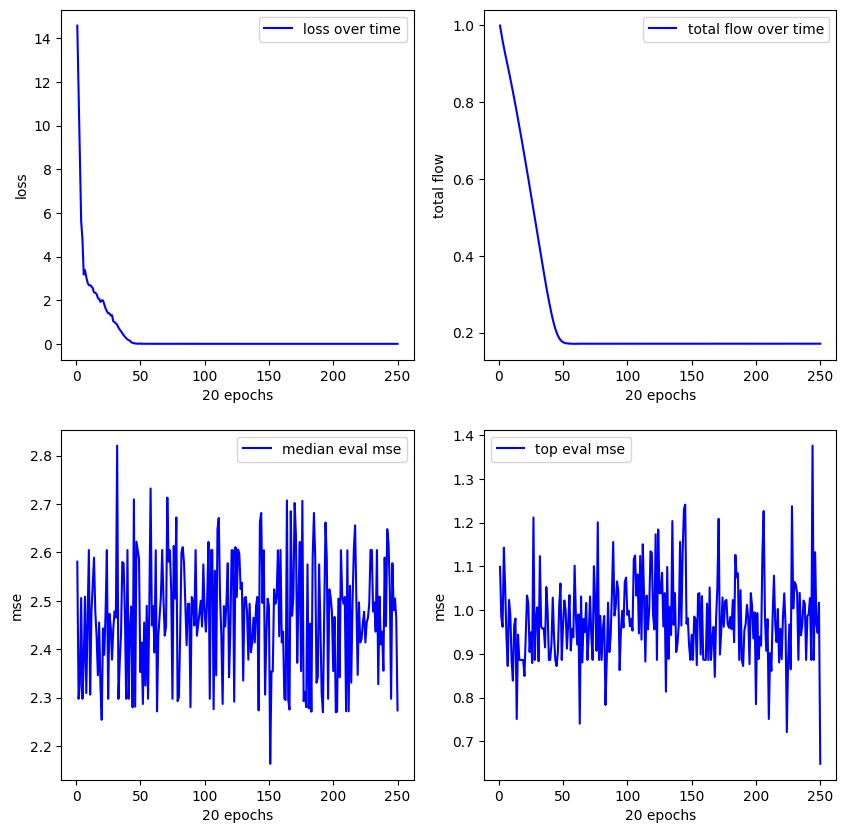

**************************************************
Experiment 8
training started with device cuda


12.995:   0%|          | 1/5000 [00:00<14:35,  5.71it/s]


new best reward (vanilla): 0.2517317533493042
mse (pre/post optimized): 0.6953685879707336/0.6931866407394409
(0.58) + (cos(x1))
expr: cos(x1) + 0.58

new best reward (vanilla): 0.7208877801895142
mse (pre/post optimized): 0.20061525702476501/0.20061525702476501
(sin(x1)) - (log(x1))
expr: -log(x1) + sin(x1)


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.10it/s]


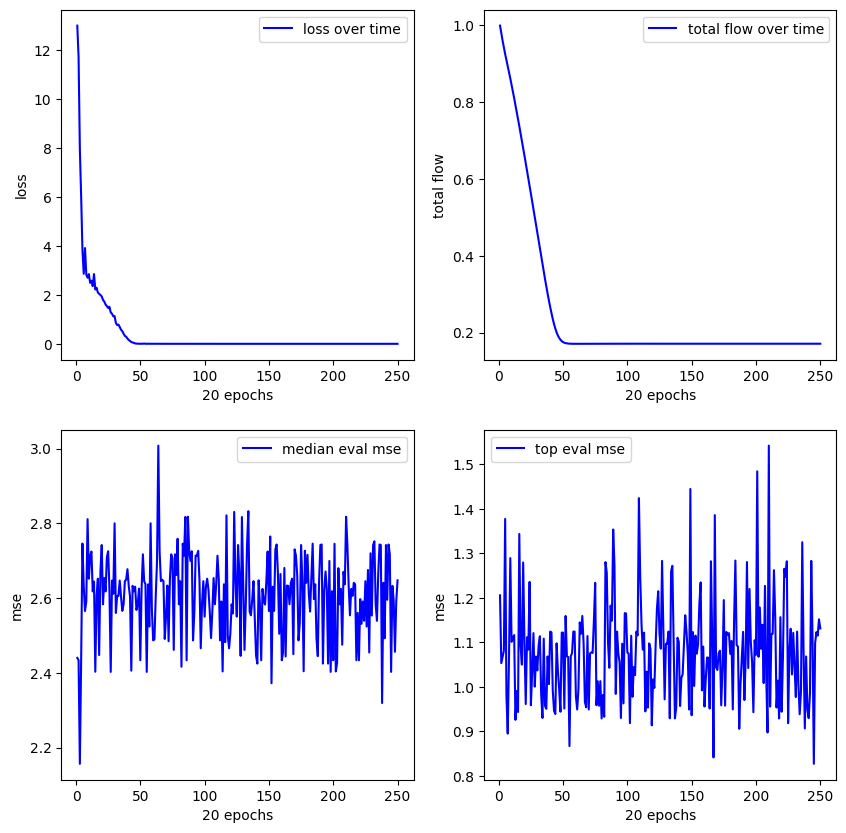

**************************************************
Experiment 9
training started with device cuda


14.089:   0%|          | 1/5000 [00:00<15:43,  5.30it/s]


new best reward (vanilla): 9.999999747378752e-05
mse (pre/post optimized): 1.9136481285095215/1.9136481285095215
exp(sin(x1))
expr: exp(sin(x1))

new best reward (vanilla): 0.38090938329696655
mse (pre/post optimized): 0.60882568359375/0.60882568359375
(cos(x1)) + (cos(x1))
expr: 2*cos(x1)


14.089:   0%|          | 7/5000 [00:00<06:49, 12.20it/s]


new best reward (vanilla): 0.7606586217880249
mse (pre/post optimized): 0.10276467353105545/0.0995301604270935
(1.03) / ((0.28) + (x1))
expr: 1.03/(x1 + 0.28)


0.000: 100%|██████████| 5000/5000 [02:41<00:00, 30.93it/s]


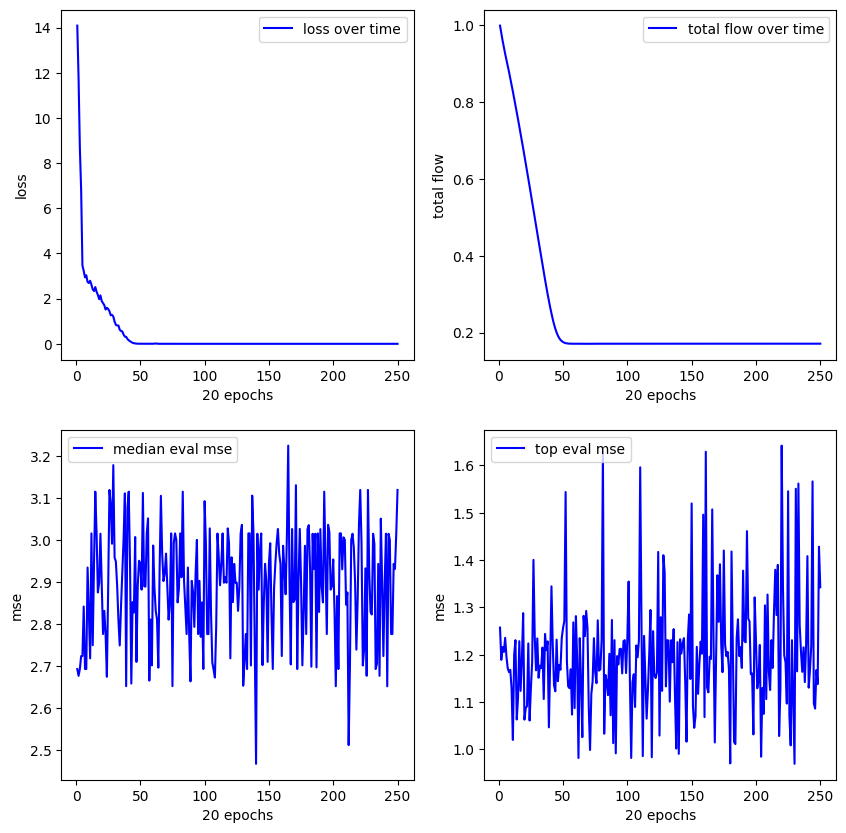

**************************************************
Experiment 10
training started with device cuda


13.230:   0%|          | 1/5000 [00:00<12:49,  6.50it/s]


new best reward (vanilla): 0.6874953508377075
mse (pre/post optimized): 0.2584775984287262/0.2584652304649353
exp((0.88) - (x1))
expr: 2.41089970641721*exp(-x1)


9.444:   0%|          | 21/5000 [00:01<07:28, 11.11it/s] 


new best reward (vanilla): 0.8855421543121338
mse (pre/post optimized): 0.021528100594878197/0.19445495307445526
(cos(x1)) / ((0.18) + (x1))
expr: cos(x1)/(x1 + 0.18)


0.000: 100%|██████████| 5000/5000 [02:41<00:00, 30.88it/s]


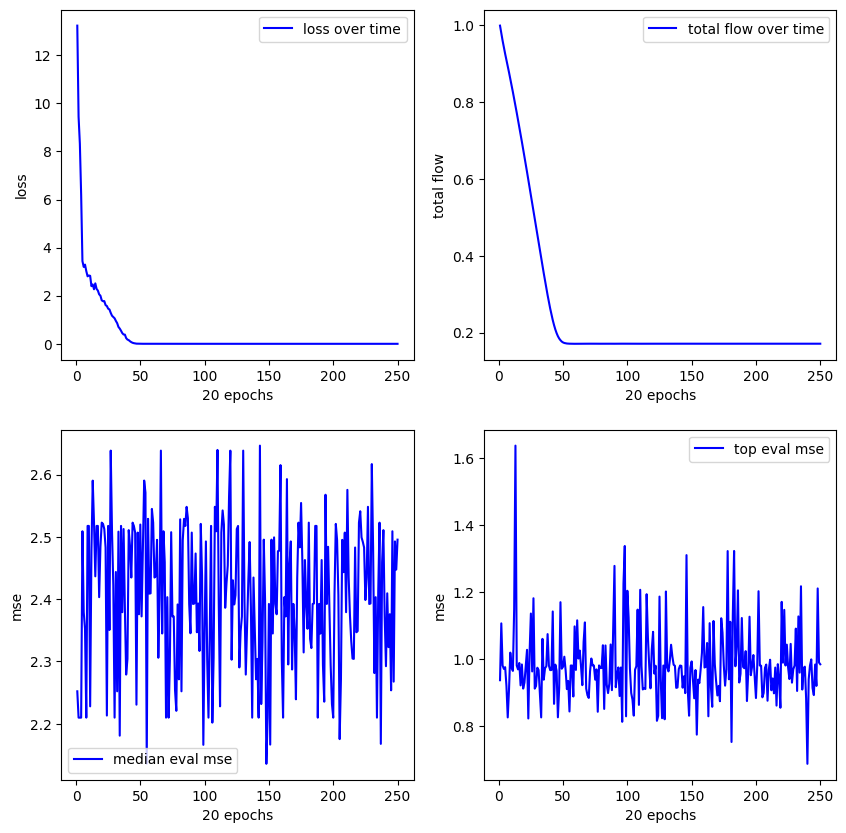

**************************************************
Experiment 11
training started with device cuda


15.239:   0%|          | 1/5000 [00:00<12:43,  6.55it/s]


new best reward (vanilla): 0.6425760388374329
mse (pre/post optimized): 0.27187252044677734/0.2503948509693146
exp((0.83) - (x1))
expr: 2.29331874026418*exp(-x1)


15.239:   0%|          | 3/5000 [00:00<07:55, 10.51it/s]


new best reward (vanilla): 0.809009313583374
mse (pre/post optimized): 0.06126019358634949/0.06125869229435921
(0.39) - (log(x1))
expr: 0.39 - log(x1)


0.000: 100%|██████████| 5000/5000 [02:43<00:00, 30.61it/s]


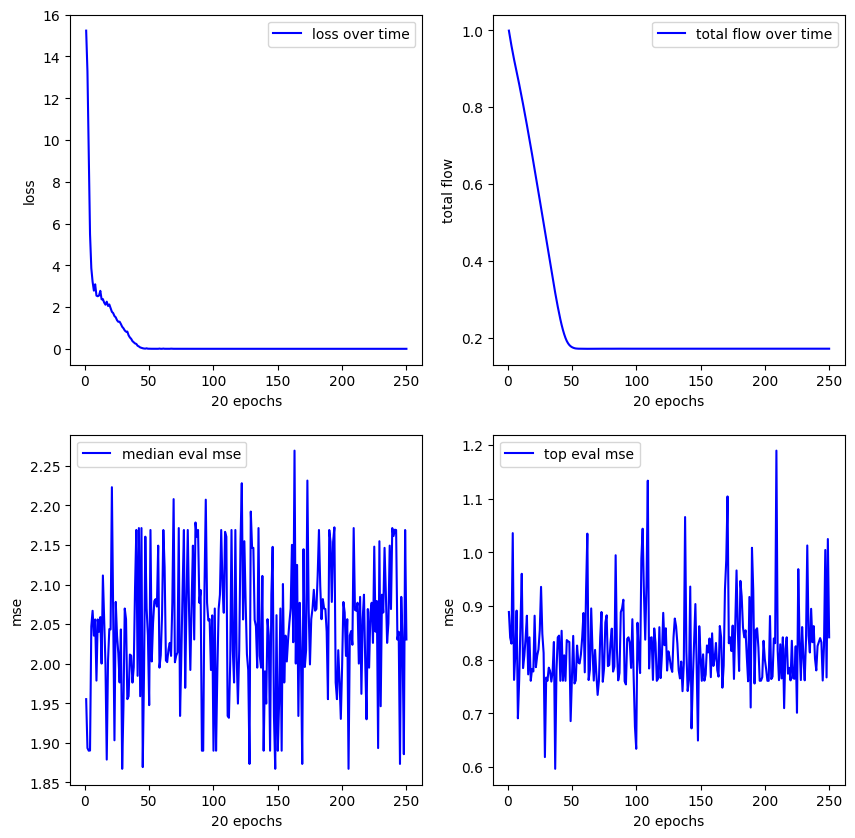

**************************************************
Experiment 12
training started with device cuda


13.800:   0%|          | 1/5000 [00:00<11:17,  7.38it/s]


new best reward (vanilla): 0.025118231773376465
mse (pre/post optimized): 0.859055757522583/0.859055757522583
square(cos(x1))
expr: square(cos(x1))

new best reward (vanilla): 0.4510347843170166
mse (pre/post optimized): 0.47280681133270264/0.18722835183143616
((-0.2) + (x1)) - (log(x1))
expr: x1 - log(x1) - 0.2

new best reward (vanilla): 0.7137857675552368
mse (pre/post optimized): 0.14644238352775574/0.1014564037322998
square((1.59) - (x1))
expr: square(1.59 - x1)


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.24it/s]


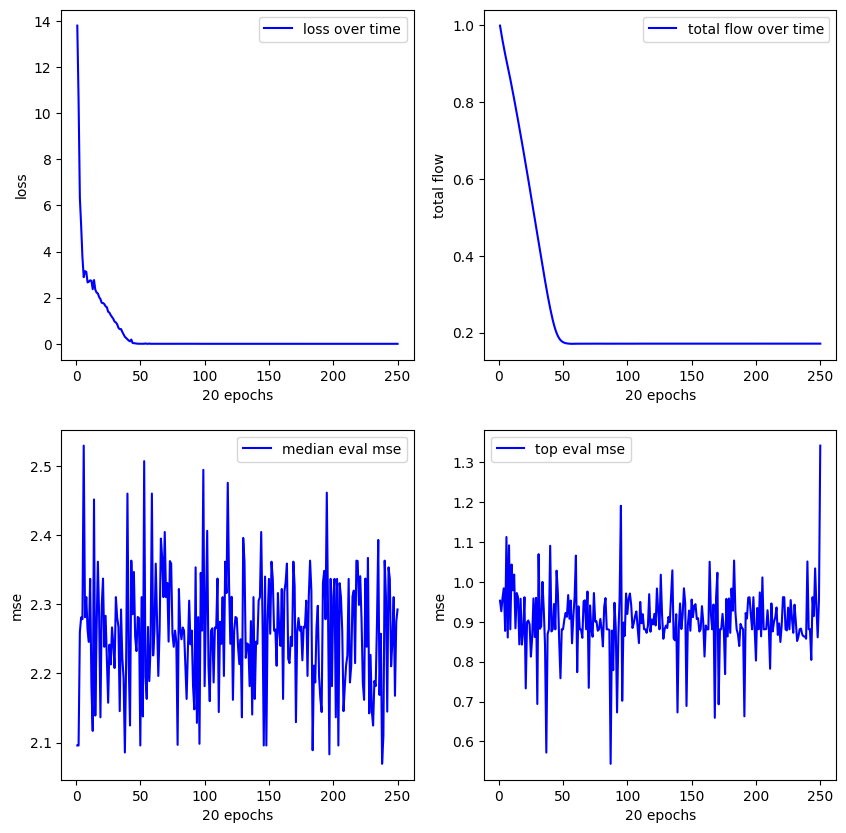

**************************************************
Experiment 13
training started with device cuda


16.631:   0%|          | 3/5000 [00:00<09:05,  9.16it/s]


new best reward (vanilla): 0.7045954465866089
mse (pre/post optimized): 0.2818325459957123/0.2818325459957123
(sin(x1)) - (log(x1))
expr: -log(x1) + sin(x1)


16.631:   0%|          | 18/5000 [00:01<03:45, 22.12it/s]


new best reward (vanilla): 0.7486916780471802
mse (pre/post optimized): 0.0474659726023674/0.051598258316516876
(cos(x1)) / ((0.26) + (x1))
expr: cos(x1)/(x1 + 0.26)


0.000: 100%|██████████| 5000/5000 [02:38<00:00, 31.45it/s]


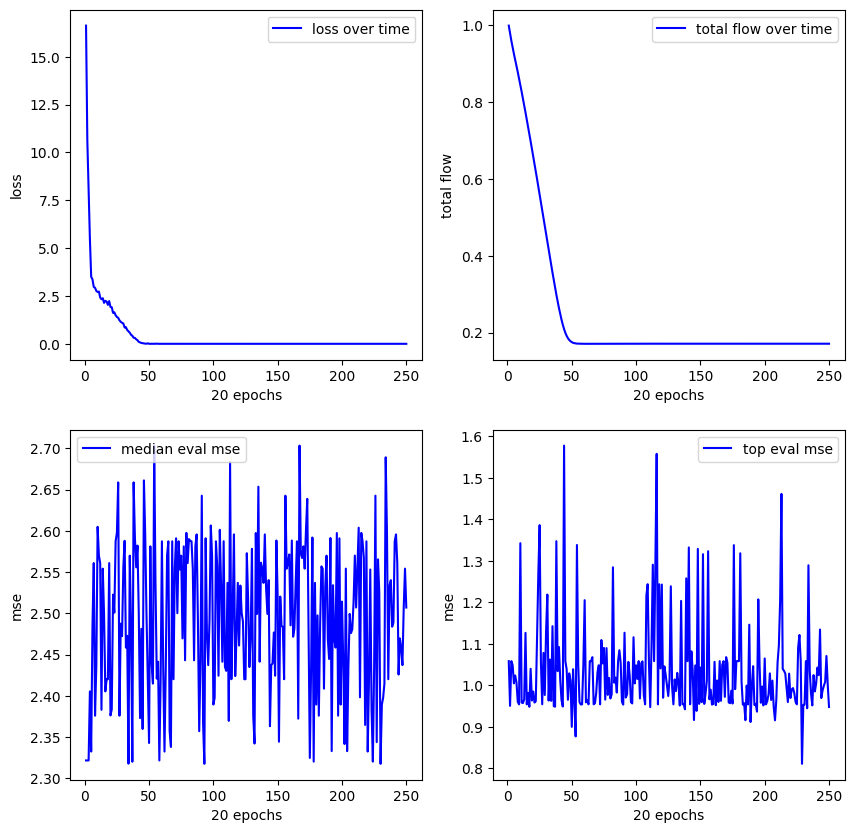

**************************************************
Experiment 14
training started with device cuda


14.199:   0%|          | 2/5000 [00:00<05:10, 16.09it/s]


new best reward (vanilla): 0.7154088616371155
mse (pre/post optimized): 0.2366378754377365/0.22405679523944855
(0.69) / (sqrt(x1))
expr: 0.69/sqrt(x1)


14.199:   0%|          | 8/5000 [00:00<03:53, 21.36it/s]


new best reward (vanilla): 0.8318792581558228
mse (pre/post optimized): 0.03540622070431709/0.03540622070431709
(cos(x1)) / ((0.27) + (x1))
expr: cos(x1)/(x1 + 0.27)


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.25it/s]


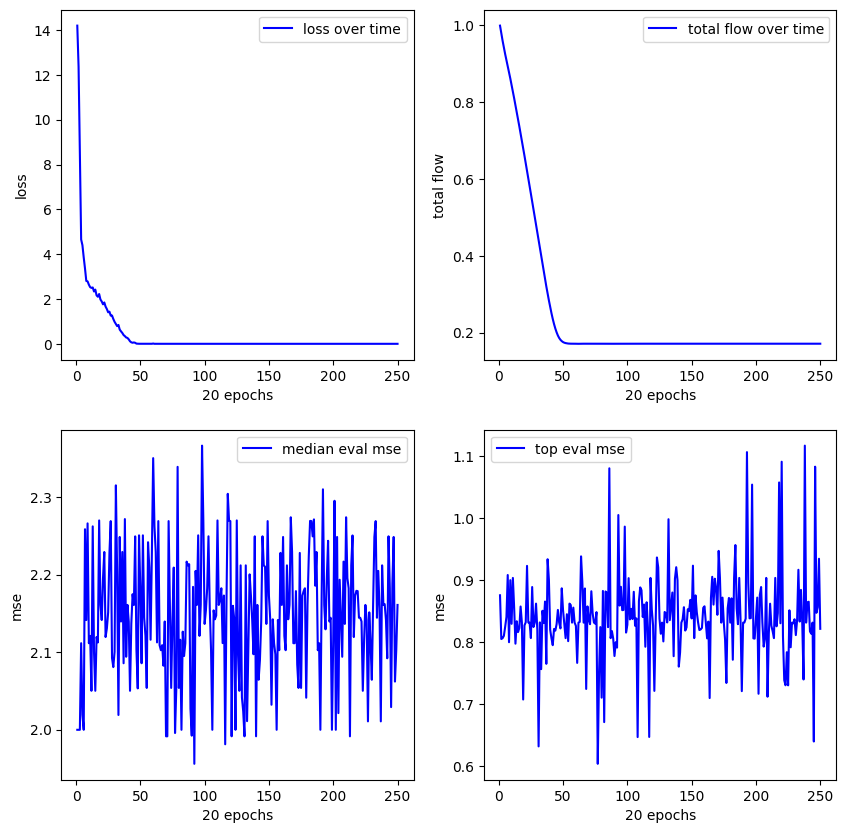

**************************************************
Experiment 15
training started with device cuda


15.364:   0%|          | 1/5000 [00:00<09:03,  9.20it/s]


new best reward (vanilla): 0.7590584754943848
mse (pre/post optimized): 0.2053046077489853/0.2053046077489853
(sqrt(x1)) - (log(x1))
expr: sqrt(x1) - log(x1)


0.000: 100%|██████████| 5000/5000 [02:41<00:00, 31.00it/s]


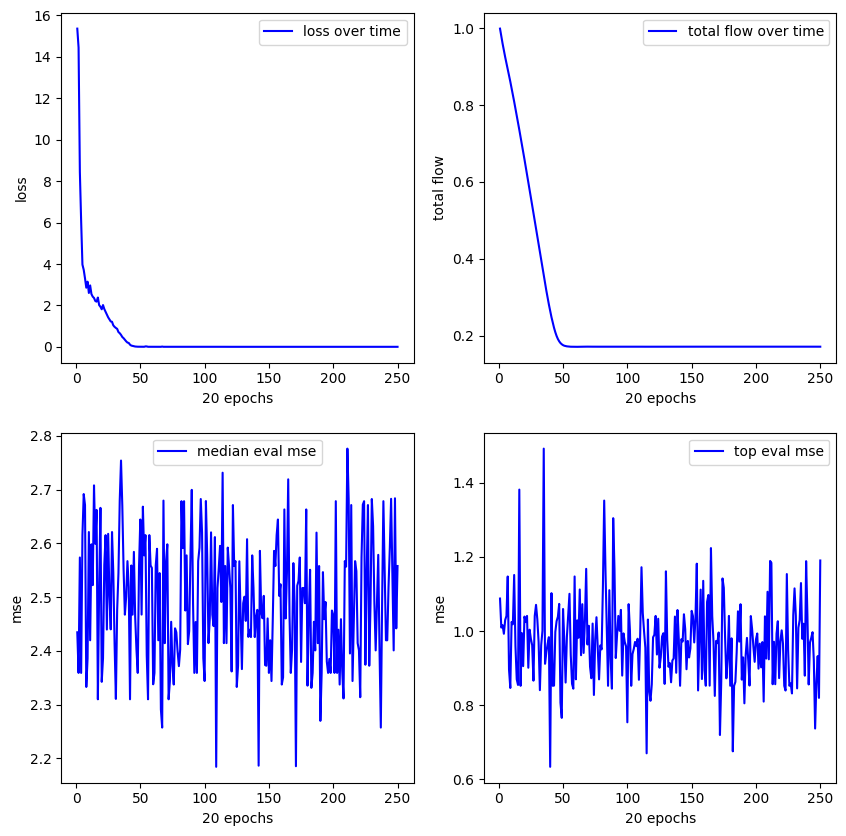

**************************************************
Experiment 16
training started with device cuda


16.099:   0%|          | 1/5000 [00:00<10:44,  7.76it/s]


new best reward (vanilla): 0.025844216346740723
mse (pre/post optimized): 0.7840646505355835/0.7840646505355835
cos(square(x1))
expr: cos(square(x1))

new best reward (vanilla): 0.6099122762680054
mse (pre/post optimized): 0.3066653907299042/0.2657378315925598
exp((0.84) - (x1))
expr: 2.31636697678109*exp(-x1)


16.099:   0%|          | 8/5000 [00:00<04:16, 19.47it/s]


new best reward (vanilla): 0.6780397891998291
mse (pre/post optimized): 0.0796988308429718/1.1996535062789917
((0.64) - (x1)) / (0.48)
expr: 1.33333333333333 - 2.08333333333333*x1


0.000: 100%|██████████| 5000/5000 [02:37<00:00, 31.72it/s]


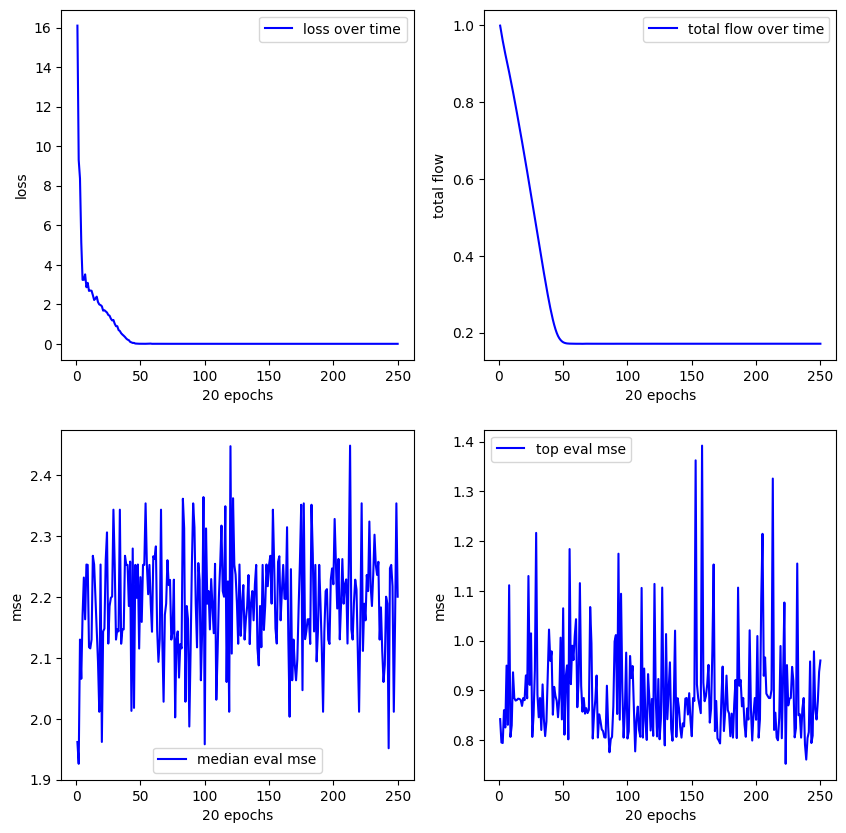

**************************************************
Experiment 17
training started with device cuda


14.121:   0%|          | 1/5000 [00:00<10:48,  7.71it/s]


new best reward (vanilla): 0.8799508810043335
mse (pre/post optimized): 0.09997694939374924/0.0989697054028511
(0.13) - (log(x1))
expr: 0.13 - log(x1)


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.16it/s]


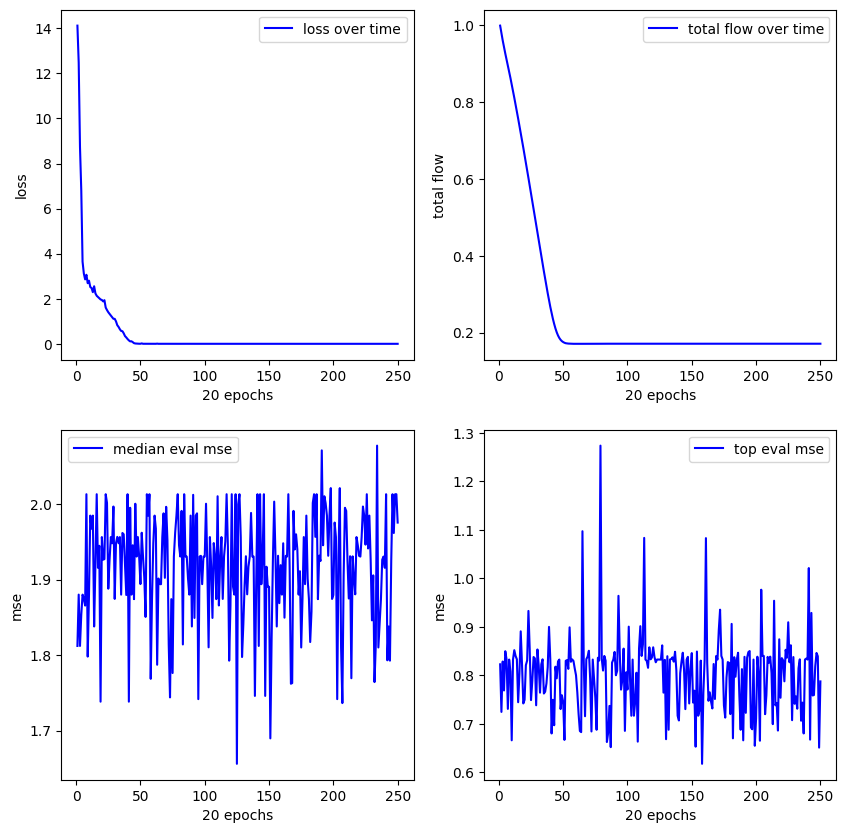

**************************************************
Experiment 18
training started with device cuda


12.402:   0%|          | 1/5000 [00:00<09:36,  8.67it/s]


new best reward (vanilla): 0.6993554830551147
mse (pre/post optimized): 0.20449687540531158/0.20449687540531158
(x1) - (log(x1))
expr: x1 - log(x1)


12.402:   0%|          | 15/5000 [00:01<06:30, 12.77it/s]


new best reward (vanilla): 0.705195426940918
mse (pre/post optimized): 0.022694408893585205/0.022694403305649757
(cos(x1)) / ((0.25) + (x1))
expr: cos(x1)/(x1 + 0.25)


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.08it/s]


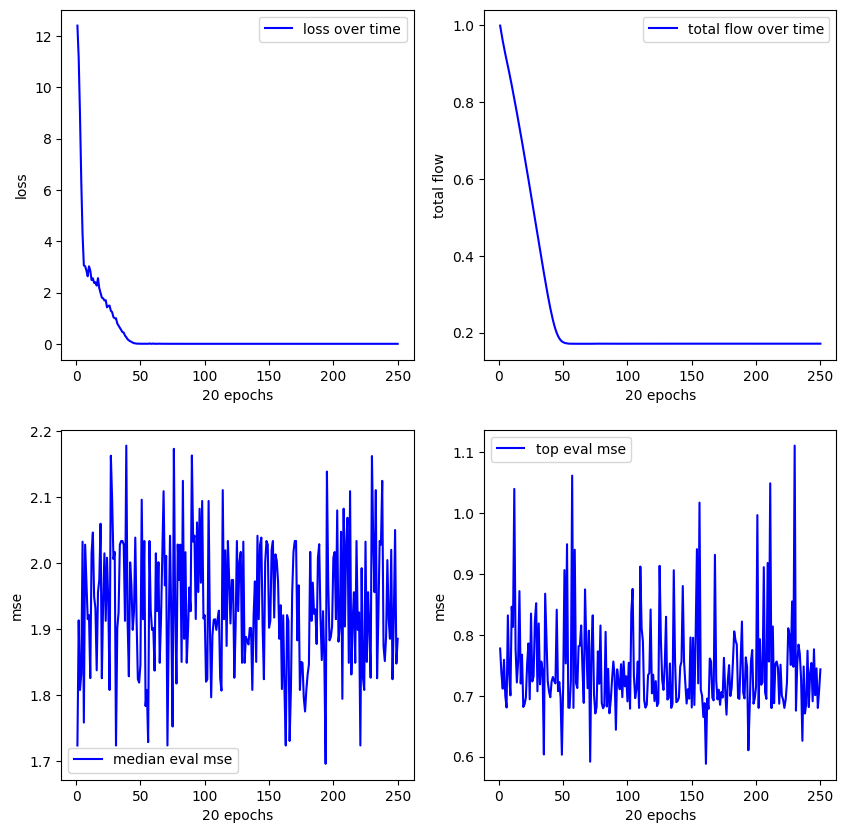

**************************************************
Experiment 19
training started with device cuda


13.866:   0%|          | 0/5000 [00:00<?, ?it/s]


new best reward (vanilla): 0.667434811592102
mse (pre/post optimized): 0.2614477276802063/0.16231133043766022
square((x1) - (1.49))
expr: square(x1 - 1.49)


13.866:   0%|          | 5/5000 [00:00<09:01,  9.23it/s]


new best reward (vanilla): 0.6991552114486694
mse (pre/post optimized): 0.09444072097539902/0.09444070607423782
(0.27) - (log(x1))
expr: 0.27 - log(x1)


0.000: 100%|██████████| 5000/5000 [02:38<00:00, 31.60it/s]


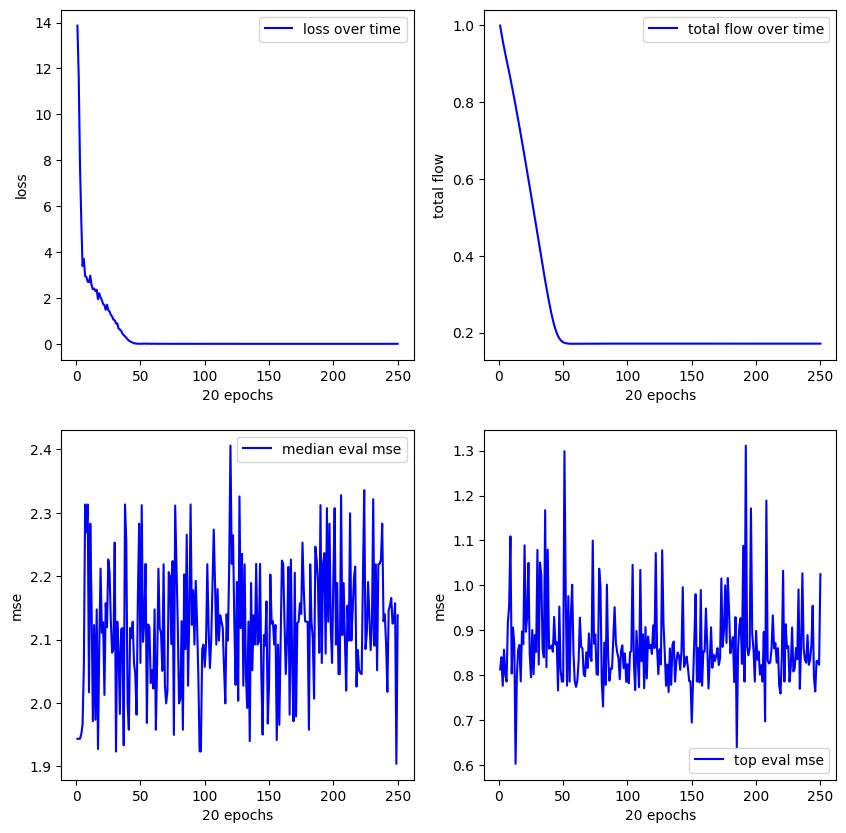

**************************************************
Experiment 20
training started with device cuda


15.690:   0%|          | 1/5000 [00:00<11:54,  7.00it/s]


new best reward (vanilla): 0.6899248361587524
mse (pre/post optimized): 0.2547599673271179/0.2533482313156128
(cos(x1)) - ((x1) - (0.95))
expr: -x1 + cos(x1) + 0.95


0.000: 100%|██████████| 5000/5000 [02:40<00:00, 31.07it/s]


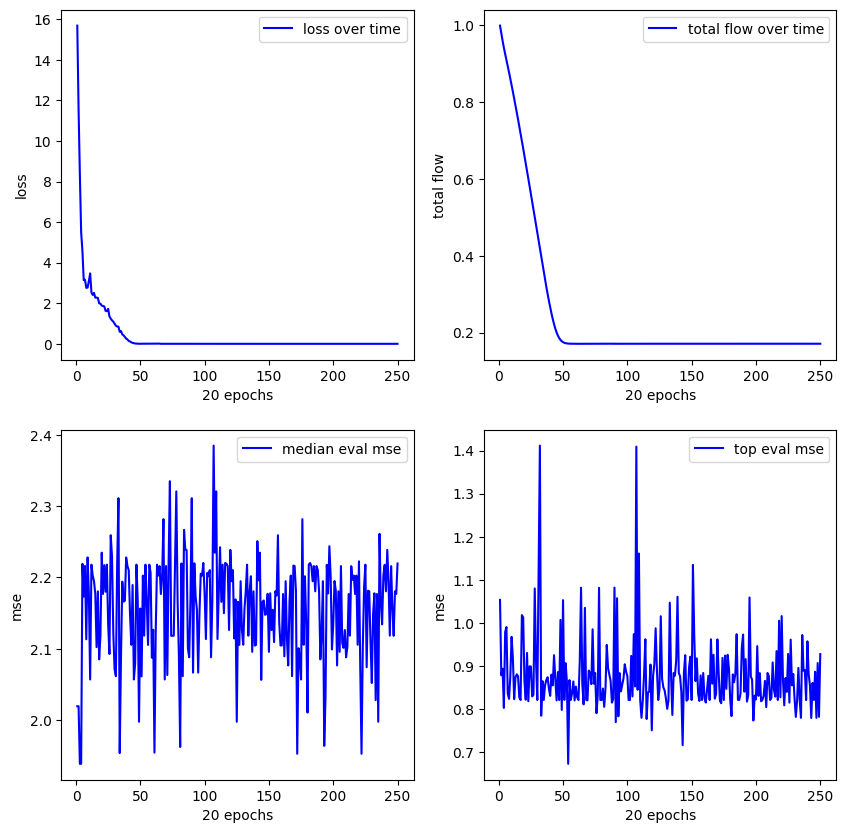

In [17]:
for i, (function, params) in enumerate(FUNC_PARAMS.items()):
    print('-'*50)
    print(f"FUNCTION {params['expr']}", f"Interval considered: [{params['interval'][0]}, {params['interval'][1]}]")
    for k in range(20):
        print('*'*50)
        print(f"Experiment {k+1}")

        low_bound, upp_bound = params["interval"]
        exp_path = results_folder/f"h{i+1}"/f"exp{k+1}"
        exp_path.mkdir(exist_ok=True, parents=True)
        # Traslación lineal al intervalo correspondiente
        X = torch.empty(200, 1).uniform_(0, 1) * (upp_bound - low_bound) + low_bound
        y = function(*X.split(1, dim=1))
        noise = 0.1 * torch.normal(mean=0, std=y.std())
        y = y + noise
        model, env, errs, avg_mses, top_mses = train_gfn_sr(X, y, batch_size, num_epochs, seed=(i+1)*k, show_plot=True, use_gpu=True, save_path=str(exp_path/"plots.png"))
        torch.save(model, str(exp_path/f"h{i+1}_noise.pt"))
        evaluate_model(env, model, save_path=str(exp_path/"results.json"))

In [7]:
for experiment in sorted(results_folder.iterdir()):
    results_list = []
    for iteration in experiment.rglob("*.json"):
        with iteration.open('r') as file:
            results = json.load(file)
            results_list.append(results["rmse"])
    results_tensor = torch.tensor(results_list)
    print(f"{experiment.name:3} -> mean: {results_tensor.mean().item():.3f}, std: {results_tensor.std().item():.3f}")

h1  -> mean: 1.007, std: 0.165
h2  -> mean: 1.089, std: 0.211
h3  -> mean: 0.148, std: 0.180
h4  -> mean: 0.013, std: 0.036
h5  -> mean: 1.473, std: 0.072
h6  -> mean: 1.508, std: 0.119
